In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = "1"

In [2]:
import cv2
import scipy
import scipy.io
import scipy.ndimage
from scipy.ndimage import label
import numpy as np
import sklearn.metrics
import matplotlib.pyplot as plt
import pandas as pd
import pydicom

In [3]:
import tensorflow as tf

2024-08-21 04:44:51.146330: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


In [4]:
def dice_coef(y_true,y_pred, loss_type='jaccard', smooth=1.):

    y_true_f = tf.reshape(y_true,[-1])
    y_pred_f = tf.reshape(y_pred,[-1])

    intersection = tf.reduce_sum(y_true_f * y_pred_f)

    if loss_type == 'jaccard':
        union = tf.reduce_sum(tf.square(y_pred_f)) + tf.reduce_sum(tf.square(y_true_f))

    elif loss_type == 'sorensen':
        union = tf.reduce_sum(y_pred_f) + tf.reduce_sum(y_true_f)

    else:
        raise ValueError("Unknown `loss_type`: %s" % loss_type)

    return (2. * intersection + smooth) / (union + smooth)

def dice_loss(y_true,y_pred, loss_type='jaccard', smooth=1.):

    y_true_f = tf.cast(tf.reshape(y_true,[-1]),tf.float32)
    y_pred_f =tf.cast(tf.reshape(y_pred,[-1]),tf.float32)

    intersection = tf.reduce_sum(y_true_f * y_pred_f)

    if loss_type == 'jaccard':
        union = tf.reduce_sum(tf.square(y_pred_f)) + tf.reduce_sum(tf.square(y_true_f))

    elif loss_type == 'sorensen':
        union = tf.reduce_sum(y_pred_f) + tf.reduce_sum(y_true_f)

    else:
        raise ValueError("Unknown `loss_type`: %s" % loss_type)

    return (1-(2. * intersection + smooth) / (union + smooth))

In [5]:
# model0_0 = tf.keras.models.load_model('/home/airdp/abdullah/Spine_assesment/Live_Testing/Initial_archi/Atten_512x512_Spine_A200', custom_objects={'dice_coef': dice_coef})
model1_1 = tf.keras.models.load_model('/home/airdp/abdullah/Spine_assesment/Testing_2/Res_Verterba_edges_DHEQ_Z', custom_objects={'dice_coef': dice_coef})
model1_2 = tf.keras.models.load_model('/home/airdp/abdullah/Spine_assesment/Live_Testing/Initial_archi/Atten_Points_to_line_with_Cvec', custom_objects={'dice_coef': dice_coef})
model2 = tf.keras.models.load_model('/home/airdp/abdullah/Spine_assesment/Testing_2/Cerntroid_attention', custom_objects={'dice_coef': dice_coef})
# model3 = tf.keras.models.load_model('/home/airdp/abdullah/Spine_assesment/Live_Testing/Initial_archi/R_ResNet', custom_objects={'dice_coef': dice_coef})

2024-08-21 04:46:12.855879: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2024-08-21 04:46:12.856815: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2024-08-21 04:46:12.904926: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:1a:00.0 name: NVIDIA TITAN RTX computeCapability: 7.5
coreClock: 1.77GHz coreCount: 72 deviceMemorySize: 23.64GiB deviceMemoryBandwidth: 625.94GiB/s
2024-08-21 04:46:12.904986: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
2024-08-21 04:46:12.907315: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.10
2024-08-21 04:46:12.907428: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublasLt.so.10
2024-

In [6]:
import numpy as np
import copy
from skimage.transform import pyramid_reduce, pyramid_expand




def isPowerofTwo(x):
    # check if number x is a power of two
    return x and (not(x & (x - 1)))


def findNextPowerOf2(n):
    # taken from https://www.techiedelight.com/round-next-highest-power-2/
    # Function will find next power of 2

    # decrement `n` (to handle cases when `n` itself
    # is a power of 2)
    n = n - 1
    # do till only one bit is left
    while n & n - 1:
        n = n & n - 1  # unset rightmost bit
    # `n` is now a power of two (less than `n`)
    # return next power of 2
    return n << 1


def resize_image(img):
    """MUSICA works for dimension like 2^N*2^M.
    Hence padding is required for arbitrary shapes

    Parameters
    ----------
    img : numpy.ndarray
        Original image

    Returns
    -------
    numpy.ndarray
        Resized image after padding
    """
    row, col = img.shape
    # check if dimensions are power of two
    # if not pad the image accordingly
    if isPowerofTwo(row):
        rowdiff = 0
    else:
        nextpower = findNextPowerOf2(row)
        rowdiff = nextpower - row

    if isPowerofTwo(col):
        coldiff = 0
    else:
        nextpower = findNextPowerOf2(col)
        coldiff = nextpower - col

    img_ = np.pad(
        img,
        ((0, rowdiff), (0, coldiff)),
        'reflect')
    return img_


def gaussian_pyramid(img, L):
    """Function for creating a Gaussian Pyramid

    Parameters
    ----------
    img : numpy.ndarray
        Input image or g0.
    L : Int
        Maximum level of decomposition.

    Returns
    -------
    list
        list containing images from g0 to gL in order
    """
    # Gaussian Pyramid
    tmp = copy.deepcopy(img)
    gp = [tmp]
    for layer in range(L):
        tmp = pyramid_reduce(tmp, preserve_range=True)
        gp.append(tmp)
    return gp


def laplacian_pyramid(img, L):
    """Function for creating Laplacian Pyramid

    Parameters
    ----------
    img : numpy.ndarray
        Input image or g0.
    L : Int
        Max layer of decomposition

    Returns
    -------
    list
        list containing laplacian layers from L_0 to L_L in order
    list
        list containing layers of gauss pyramid
    """
    gauss = gaussian_pyramid(img, L)
    # Laplacian Pyramid:
    lp = []
    for layer in range(L):
        tmp = pyramid_expand(gauss[layer+1], preserve_range=True)
        tmp = gauss[layer] - tmp
        lp.append(tmp)
    lp.append(gauss[L])
    return lp, gauss


def enhance_coefficients(laplacian, L, params):
    """Non linear operation of pyramid coefficients

    Parameters
    ----------
    laplacian : list
        Laplacian pyramid of the image.
    L : Int
        Max layer of decomposition
    params : dict
        Store values of a, M and p.

    Returns
    -------
    list
        List of enhanced pyramid coeffiencts.
    """
    # Non linear operation goes here:
    M = params['M']
    p = params['p']
    a = params['a']
    for layer in range(L):
        x = laplacian[layer]
        # removing all negative coefficients:
        # an attempt to reduce double edges
        x[x < 0] = 0.0
        G = a[layer]*M
        laplacian[layer] = G*np.multiply(
            np.divide(
                x, np.abs(x), out=np.zeros_like(x), where=x != 0),
            np.power(
                np.divide(
                    np.abs(x), M), p))
    return laplacian


def reconstruct_image(laplacian, L):
    """Function for reconstructing original image
    from a laplacian pyramid

    Parameters
    ----------
    laplacian : list
        Laplacian pyramid with enhanced coefficients
    L : int
        Max level of decomposition

    Returns
    -------
    numpy.ndarray
        Resultant image matrix after reconstruction.
    """
    # Reconstructing original image from laplacian pyramid
    rs = laplacian[L]
    for i in range(L-1, -1, -1):
        rs = pyramid_expand(rs, preserve_range=True)
        rs = np.add(rs, laplacian[i])
    return rs


def musica(img, L, params):
    """Function for running MUSICA algorithm

    Parameters
    ----------
    img : numpy.ndarray
        Input image
    L : int
        Max level of decomposition
    params : dict
        Contains parameter values required
        for non linear enhancement
    plot : bool, optional
        To plot the result, by default False

    Returns
    -------
    numpy.ndarray
        Final enhanced image with original dimensions
    """

    img_resized = resize_image(img)
    lp, _ = laplacian_pyramid(img_resized, L)
    lp = enhance_coefficients(lp, L, params)
    rs = reconstruct_image(lp, L)
    rs = rs[:img.shape[0], :img.shape[1]]
    return rs


def P_ENH(img):
    img = img - img.min()
    img = img/img.max()
    img = img*255
    img = img.astype(np.uint8)
    
    L = 9
    a = np.full(L, 9)
    params = {
            'M': 255.0,
            'a': a,
            'p': 0.4
            }
    img = musica(img, L, params)
    img = img - img.min()
    img = img/img.max()
    img = img*255
    img = img.astype(np.uint8)
    return(img)

In [7]:
def fix_dims(img,Center=256,F_mas=False,R_Resizer = False):
    a,b,_ = img.shape
    B = int(b*(512/a))
    if(F_mas):
        img = cv2.resize(img,(B,512),interpolation = cv2.INTER_NEAREST)
    else:
        img = cv2.resize(img,(B,512),interpolation = cv2.INTER_AREA)
    image = np.zeros((512,512,3))
    image = image.astype(np.uint8)
    p1 = int(Center - (B/2))
    image[:,p1:p1+B,:] = img
    R_info =  [p1,p1+B,a,b]
    if(R_Resizer):
        return(image,R_info)
    else:
        return(image)

In [8]:
def get_Spine_mask_GT(ID):
    try:
        img = cv2.imread('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/'+ID)
        CCC = img.shape
    except:
        img = cv2.imread('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/training/'+ID)
        CCC = img.shape
    # ID = paths[i].split('/')[-1]#'sunhl-1th-28-Feb-2017-295 A AP.jpg'
    try:
        mat = scipy.io.loadmat("/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/labels/test/"+ID+".mat")
    except:
        mat = scipy.io.loadmat("/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/labels/training/"+ID+".mat")
    image = img.copy()
    image = image.astype(np.uint8)

    mask = np.zeros((img.shape[0],img.shape[1],3),dtype=np.uint8)
    
    coords = mat['p2']
    coords_T = []
    loc = []
    a = 0
    while(a<len(coords)):
        coords_T.append([coords[a],coords[a+1]])
        loc.append(np.average([coords[a][1],coords[a+1][1]]))
        a = a+2
#         Z = [x for _,x in sorted(zip(loc,coords_T))]
    loc = np.array(loc)
    coords_T = np.array(coords_T)
    inds = loc.argsort()
    Z = coords_T[inds]

    New_coords = []
    for i in Z:
        New_coords.append(list(i[0]))
        New_coords.append(list(i[1]))
    coords = np.array(New_coords)

    mask = np.zeros((img.shape[0],img.shape[1],3),dtype=np.uint8)
    line_thickness = 25
    a = len(coords)-1
    cv2.line(mask, (coords[0][0], coords[0][1]), (coords[1][0], coords[1][1]), (255, 255, 255), thickness=line_thickness)
    cv2.line(mask, (coords[a][0], coords[a][1]), (coords[a-1][0], coords[a-1][1]), (255, 255, 255), thickness=line_thickness)
    for i in range(len(coords)-2):
        cv2.line(mask, (coords[i][0], coords[i][1]), (coords[i+2][0], coords[i+2][1]), (255, 255, 255), thickness=line_thickness)
    mask = scipy.ndimage.binary_fill_holes(mask[:,:,0]/255)
    mask = np.moveaxis(np.array([mask,mask,mask]),0,-1)*255
    mask = mask.astype(np.uint8)
    return(mask)

In [9]:
def make_full_contour_updatedv2(img,mask,colour,Thick):
#     img = (255*(img - np.min(img))/np.ptp(img)).astype(int)
    mask = (255*(mask - np.min(mask))/np.ptp(mask)).astype(int)
    winMask = np.zeros((img.shape[0],img.shape[1]), dtype=int)

    mask = mask.astype('uint8')
    winMask = winMask.astype('uint8')
    kernel_0 = np.array([[0,-1,0],[-1,4,-1],[0,-1,0]])
    output = cv2.filter2D(mask, -1, kernel_0)
    con_ones = np.where(output > 0, 1, 0)
    if(Thick==True):
        con_ones = con_ones*255
        con_ones = con_ones.astype(np.uint8)
        con_ones = cv2.GaussianBlur(con_ones,(5,5),1)
        con_ones[con_ones<=10]=0
        con_ones[con_ones>10]=255
        con_ones = cv2.GaussianBlur(con_ones,(5,5),1)
        con_ones[con_ones<=10]=0
        con_ones[con_ones>10]=1
    con_zeros = 1 - con_ones
    
    
    RGB_img = np.zeros([img.shape[0],img.shape[1],3],int)
    if(colour=='C1'):
        RGB_img[:,:,0] = img[:,:,0]*con_zeros+ (con_ones*215)
        RGB_img[:,:,1] = img[:,:,1]*con_zeros+ (con_ones*25)
        RGB_img[:,:,2] = img[:,:,2]*con_zeros+ (con_ones*25)
    elif(colour=='C3'):
        RGB_img[:,:,0] = img[:,:,0]*con_zeros+ (con_ones*25)
        RGB_img[:,:,1] = img[:,:,1]*con_zeros+ (con_ones*215)
        RGB_img[:,:,2] = img[:,:,2]*con_zeros+ (con_ones*25)
    elif(colour=="C2"):
        RGB_img[:,:,0] = img[:,:,0]*con_zeros+ (con_ones*45)
        RGB_img[:,:,1] = img[:,:,1]*con_zeros+ (con_ones*45)
        RGB_img[:,:,2] = img[:,:,2]*con_zeros + (con_ones*215)
    elif(colour=="C4"):
        RGB_img[:,:,0] = img[:,:,0]*con_zeros
        RGB_img[:,:,1] = img[:,:,1]*con_zeros + (con_ones*150)
        RGB_img[:,:,2] = img[:,:,2]*con_zeros + (con_ones*150)
    elif(colour=="c5"):
        RGB_img[:,:,0] = img[:,:,0]*con_zeros + (con_ones*180)
        RGB_img[:,:,1] = img[:,:,1]*con_zeros
        RGB_img[:,:,2] = img[:,:,2]*con_zeros + (con_ones*180)
    elif(colour=="C6"):
        RGB_img[:,:,0] = img[:,:,0]*con_zeros + (con_ones*225)
        RGB_img[:,:,1] = img[:,:,1]*con_zeros + (con_ones*225)
        RGB_img[:,:,2] = img[:,:,2]*con_zeros
    
    output = cv2.filter2D(winMask, -1, kernel_0)
    con_ones = np.where(output > 0, 1, 0)
    con_zeros = 1 - con_ones
    
    RGB_img[:,:,2] = RGB_img[:,:,2]*con_zeros
    RGB_img[:,:,0] = RGB_img[:,:,0]*con_zeros
    RGB_img[:,:,1] = RGB_img[:,:,1]*con_zeros+ (con_ones*255)
    
    
    return RGB_img.astype(np.uint8)

In [10]:
def make_label_1(temp):
    MASK = np.zeros(temp.shape)
    labelled_mask, num_labels = label(temp)
    for j in range(1,num_labels+1):
        mask2 =labelled_mask.copy()
        mask2[mask2!=j]=0
        mask2[mask2==j]=1
        if(np.sum(MASK)<np.sum(mask2)):
            MASK = mask2
    return(MASK)

In [11]:
def mid_PTOV(mid_p):
    mid_p_v = np.zeros((34,2))
    n = 1
    for i in range(-1,32):
        mid_1 = (mid_p[i,0]+mid_p[i+1,0])/2
        mid_2 = (mid_p[i,1]+mid_p[i+1,1])/2
        mid_p_v[n,0] = mid_1
        mid_p_v[n,1] = mid_2
        n=n+1
    return(mid_p_v)

In [12]:
def get_inbounds(mask1,mask2):
    inbound = np.zeros(mask1.shape)
    labelled_mask, num_labels = label(mask2)
    for j in range(1,num_labels+1):
        maskT =labelled_mask.copy()
        maskT[maskT!=j]=0
        maskT[maskT==j]=1
        if(np.sum(mask1*maskT)>np.sum(maskT*.2)):
            inbound = inbound+maskT
    return(inbound)

In [13]:
def get_LR_points(mask):
    points = []
    labelled_mask2, num_labels2 = label(mask)
    for j in range(1,num_labels2+1):
        mask1 =labelled_mask2.copy()
        mask1[mask1!=j]=0
        mask1[mask1==j]=1
        a,b = np.where(mask1>0)
        points.append([np.average(a),np.average(b)])
    if(points[0][1]>points[1][1]):
        return(points[1]+points[0])
    else:
        return(points[0]+points[1])

In [14]:
def mask_to_points(mask):
    Cord_pred = []
    buff = 1
    a,b = np.where(mask>0)
    Cord_pred.append(int(np.average(a[b==np.min(b)+buff])))
    Cord_pred.append(np.min(b)+buff)
    Cord_pred.append(int(np.average(a[b==np.max(b)-buff])))
    Cord_pred.append(np.max(b)-buff)
    return(Cord_pred)

In [15]:
def point_to_square(shape,points):
    line_thickness = 3
    square = np.zeros((shape[0],shape[1],3))
    p1 = (int(points[1]),int(points[0]))
    p2 = (int(points[3]),int(points[2]))
    p3 = (int(points[5]),int(points[4]))
    p4 = (int(points[7]),int(points[6]))
    cv2.line(square, p1,p2, (255, 255, 255), thickness=line_thickness)
    cv2.line(square, p3,p4, (255, 255, 255), thickness=line_thickness)
    line_thickness = 30
    cv2.line(square, p1,p3, (255, 255, 255), thickness=line_thickness)
    cv2.line(square, p2,p4, (255, 255, 255), thickness=line_thickness)
    square = scipy.ndimage.binary_fill_holes(square[:,:,0]/255)
    return(square)

In [16]:
def get_LR_points(mask):
    points = []
    labelled_mask2, num_labels2 = label(mask)
    for j in range(1,num_labels2+1):
        mask1 =labelled_mask2.copy()
        mask1[mask1!=j]=0
        mask1[mask1==j]=1
        a,b = np.where(mask1>0)
        points.append([np.average(a),np.average(b)])
    if(points[0][1]>points[1][1]):
        return(points[1]+points[0])
    else:
        return(points[0]+points[1])

In [17]:
def remove_smallest(mask):
    MASK = np.ones(mask.shape)
    labelled_mask, num_labels = label(mask)
    for j in range(1,num_labels+1):
        mask2 =labelled_mask.copy()
        mask2[mask2!=j]=0
        mask2[mask2==j]=1
        if(np.sum(MASK)>np.sum(mask2)):
            MASK = mask2
    mask = mask-MASK
    return(mask)

def make_label_1(temp):
    labelled_mask, num_labels = label(temp)
    while(num_labels>1):
        temp = remove_smallest(temp)
        labelled_mask, num_labels = label(temp)
    return(temp)

In [18]:
def remove_smallest(mask):
    MASK = np.ones(mask.shape)
    labelled_mask, num_labels = label(mask)
    for j in range(1,num_labels+1):
        mask2 =labelled_mask.copy()
        mask2[mask2!=j]=0
        mask2[mask2==j]=1
        if(np.sum(MASK)>np.sum(mask2)):
            MASK = mask2
    mask = mask-MASK
    return(mask)

def make_label_1(temp):
    labelled_mask, num_labels = label(temp)
    while(num_labels>1):
        temp = remove_smallest(temp)
        labelled_mask, num_labels = label(temp)
    return(temp)

In [19]:
def get_P0X(P1_L1,P2_L1,img_line):
    M_L1 = (P1_L1[1]-P2_L1[1])/(P1_L1[0]-P2_L1[0])
    B_L1 = P1_L1[1]-(M_L1*P1_L1[0])
    
    #y=mx+b
    P1 = int(img_line.shape[1]/8)
    P2 = int(img_line.shape[1]-(img_line.shape[1]/8))
    print(P1,P2)
    
    P00 = (int((M_L1*P1)+B_L1),P1)
    PXX = (int((M_L1*P2)+B_L1),P2)
    return(P00,PXX)

In [20]:
def get_angle(M1,M2):
    angle = np.arctan(np.abs((M1-M2)/(1+(M1*M2))))
    angle = angle*(180/3.1415)
    return(angle)

In [21]:
def get_T12_mask(img):
    IMAGE = img.copy()
    img = (img - np.min(img)) / (np.max(img) - np.min(img))
    img = img*255
    img = img.astype(np.uint8)
    IMG = img.copy()    
    IMG = cv2.equalizeHist(IMG)
    img = IMG
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
#     img = clahe.apply(img)
    cmap='gray'
    img = plt.get_cmap(cmap)(img)[:, :, :3]
    img = cv2.resize(img, (512,512), interpolation=cv2.INTER_LINEAR)
    temp = np.zeros((1,512,512,3))
    temp[0,:,:,:]=img
    global model3
    z = model3.predict(temp)
    z[z>.1]=1
    z[z<=.1]=0
    Z = z[0,:,:,0]
    Z = scipy.ndimage.binary_fill_holes(Z)
    Z = Z.astype(np.uint8)
    Z = cv2.resize(Z,(IMAGE.shape[1],IMAGE.shape[0]), interpolation=cv2.INTER_LINEAR)
    return(Z)

In [22]:
def get_inbounds2(mask1,mask2):
    inbound = np.zeros(mask1.shape)
    Mmask = np.zeros(mask1.shape)
    A,B = np.where(mask1>0)
    A1 = np.max([np.min(A)-30,0])
    A2 = np.min([np.max(A)+30,mask1.shape[0]])
    B1 = np.max([np.min(B)-30,0])
    B2 = np.min([np.max(B)+30,mask1.shape[1]])
    Mmask[A1:A2,B1:B2] = 1
    mask2 = mask2*Mmask
    labelled_mask, num_labels = label(mask2)
    for j in range(1,num_labels+1):
        maskT =labelled_mask.copy()
        maskT[maskT!=j]=0
        maskT[maskT==j]=1
        if(np.sum(mask1*maskT)>np.sum(maskT*.2)):
            inbound = inbound+maskT
    return(inbound)

In [23]:
def mid_PTOV(mid_p):
    mid_p_v = np.zeros((34,2))
    n = 1
    for i in range(-1,32):
        mid_1 = (mid_p[i,0]+mid_p[i+1,0])/2
        mid_2 = (mid_p[i,1]+mid_p[i+1,1])/2
        mid_p_v[n,0] = mid_1
        mid_p_v[n,1] = mid_2
        n=n+1
    return(mid_p_v)

In [35]:
math.pi

3.141592653589793

In [36]:
import math
def cmean_smape(gt_angles,pred_angles):
    sine_ = []
    cosine = []
    difference = []
    addition = []
    for i in range(3):
        gt = math.radians(gt_angles[i]+math.pi)
        pred = math.radians(pred_angles[i]+math.pi)
        diff = abs(pred - gt) 
        difference.append(diff)
        add = (pred+gt)
        addition.append(add)
        sin_diff = math.sin(diff)
        sine_.append(sin_diff)
        cos_diff = math.cos(diff)
        cosine.append(cos_diff)
    sin_s = np.sum(sine_)
    cos_s = np.sum(cosine)
    cmean = math.atan(sin_s / cos_s)
    cmean = math.degrees(cmean)
    
    dif = np.sum(difference)
    ad = np.sum(addition)
    smape = dif/ad
    return cmean, smape

In [25]:
def isS(p):
    ll = linefun(p)
    # print(ll)
    # print(np.sum(np.sum(ll * ll.T)))
    # print(np.sum(np.sum(np.abs(ll * ll.T))))
    flag = np.sum(np.sum(ll * ll.T)) != np.sum(np.sum(np.abs(ll * ll.T)))
    # print(flag)
    return flag

def linefun(p):
    num = p.shape[0]
    ll = np.zeros(num-2)
    for i in range(num-2):
        ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])
    return ll

# isS(mid_p_v)

In [26]:
def get_pred_angles(file_name,mid_p):
    ap_num = 68
    try:
        im = cv2.imread('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/'+ID)
        CCC = im.shape
    except:
        im = cv2.imread('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/training/'+ID)
        CCC = im.shape
    try:
        mat = scipy.io.loadmat("/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/labels/test/"+ID+".mat")
    except:
        mat = scipy.io.loadmat("/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/labels/training/"+ID+".mat")
    image = im.copy()
    image = image.astype(np.uint8)

    vnum = ap_num // 4

    cob_angles = np.zeros(3)
    
    mid_p_v = mid_PTOV(mid_p)


    vec_m = np.zeros((mid_p.shape[0] // 2, 2))
    for n in range(mid_p.shape[0] // 2):
        vec_m[n, :] = mid_p[n * 2, :] - mid_p[(n - 1) * 2 + 1, :]
    mod_v = np.sqrt(np.sum(vec_m * vec_m, axis=1))
    dot_v = np.dot(vec_m, vec_m.T)    
    x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
    x[x > 1] = 1
    angles = np.arccos(x) #(dot_v / (mod_v.reshape(-1, 1) * mod_v))
    maxt = np.max(angles, axis=0)
    pos1 = np.argmax(angles, axis=0)
    pos2 = np.argmax(maxt)
    pt = np.real(maxt / np.pi * 180)
    cob_angles = [0,0,0]
    cob_angles[0] = np.array(np.max([pt]))

    if not isS(mid_p_v):
    #     print(vec_m)
        mod_v1 = np.sqrt(np.sum(vec_m[0, :] * vec_m[0, :]))
        mod_vs1 = np.sqrt(np.sum(vec_m[pos2, :] * vec_m[pos2, :]))
        mod_v2 = np.sqrt(np.sum(vec_m[vnum-1, :] * vec_m[vnum-1, :]))
        mod_vs2 = np.sqrt(np.sum(vec_m[pos1[pos2], :] * vec_m[pos1[pos2], :]))

        dot_v1 = np.dot(vec_m[0, :], vec_m[pos2, :].T)
        dot_v2 = np.dot(vec_m[vnum-1, :], vec_m[pos1[pos2], :].T)
        x = dot_v1 / (mod_v1 * mod_vs1.T)
        if x>1:
            x=1
        mt = np.arccos(x)#dot_v1 / (mod_v1 * mod_vs1.T))
    #     x = dot_v1 / (mod_v2 * mod_vs2.T)
    #     x[x>1] = 1
        y = (dot_v2 / (mod_v2 * mod_vs2.T))
        if y>1:
            y=1
        tl = np.arccos(y)#dot_v2 / (mod_v2 * mod_vs2.T))
#         print(mt)
        mt = np.real(mt / np.pi * 180)
#         print(mt)
        cob_angles[1] = mt
        tl = np.real(tl / np.pi * 180)
        cob_angles[2] = tl

    else:
        if (mid_p_v[pos2*2, 1] + mid_p_v[pos1[pos2]*2, 1]) < im.shape[0]:
            # calculate cob angle upside
            mod_v_p = np.sqrt(np.sum(vec_m[pos2, :] ** 2, axis=1))
            mod_v1 = np.sqrt(np.sum(vec_m[0:pos2, :] ** 2, axis=1))
            dot_v1 = np.dot(vec_m[pos2, :], vec_m[0:pos2, :].T)

            angles1 = np.arccos(dot_v1 / (mod_v_p[:, np.newaxis] * mod_v1[np.newaxis, :]))
            CobbAn1 = np.max(angles1)
            pos1_1 = np.argmax(angles1)
            mt = np.real(CobbAn1 / np.pi * 180)
            cob_angles[1] = mt

#             plt.plot([mid_p[pos1_1*2, 0], mid_p[(pos1_1-1)*2+1, 0]],
#                      [mid_p[pos1_1*2, 1], mid_p[(pos1_1-1)*2+1, 1]],
#                      color='g', linewidth=2)

            #calculate cob angle downside
            mod_v_p2 = np.sqrt(np.sum(vec_m[pos1[pos2], :] ** 2, axis=1))
            mod_v2 = np.sqrt(np.sum(vec_m[pos1[pos2]:vnum, :] ** 2, axis=1))
            dot_v2 = np.dot(vec_m[pos1[pos2], :], vec_m[pos1[pos2]:vnum, :].T)

            angles2 = np.arccos(dot_v2 / (mod_v_p2[:, np.newaxis] * mod_v2[np.newaxis, :]))
            CobbAn2 = np.max(angles2)
            pos1_2 = np.argmax(angles2)
            tl = np.real(CobbAn2 / np.pi * 180)
            cob_angles[2] = tl

            pos1_2 = pos1_2 + pos1[pos2] - 1

#             plt.plot([mid_p[pos1_2*2, 0], mid_p[(pos1_2-1)*2+1, 0]],
#                      [mid_p[pos1_2*2, 1], mid_p[(pos1_2-1)*2+1, 1]],
#                      color='g', linewidth=2)

        else:
            # Calculate the Cobb angle (upside)
            mod_v_p = np.sqrt(np.sum(vec_m[pos2, :] ** 2, axis=1))
            mod_v1 = np.sqrt(np.sum(vec_m[0:pos2, :] ** 2, axis=1))
            dot_v1 = np.dot(vec_m[pos2, :], vec_m[0:pos2, :].T)

            angles1 = np.arccos(dot_v1 / (mod_v_p[:, np.newaxis] * mod_v1[np.newaxis, :]))
            CobbAn1 = np.max(angles1)
            pos1_1 = np.argmax(angles1)
            mt = np.real(CobbAn1 / np.pi * 180)
            print(mt)
            cob_angles[1] = mt

#             plt.plot([mid_p[pos1_1*2, 0], mid_p[(pos1_1-1)*2+1, 0]],
#                      [mid_p[pos1_1*2, 1], mid_p[(pos1_1-1)*2+1, 1]],
#                      color='g', linewidth=2)

            # Calculate the Cobb angle (upper upside)
            mod_v_p2 = np.sqrt(np.sum(vec_m[pos1_1, :] ** 2, axis=1))
            mod_v2 = np.sqrt(np.sum(vec_m[0:pos1_1, :] ** 2, axis=1))
            dot_v2 = np.dot(vec_m[pos1_1, :], vec_m[0:pos1_1, :].T)

            angles2 = np.arccos(dot_v2 / (mod_v_p2[:, np.newaxis] * mod_v2[np.newaxis, :]))
            CobbAn2 = np.max(angles2)
            pos1_2 = np.argmax(angles2)
            tl = np.real(CobbAn2 / np.pi * 180)
            cob_angles[2] = tl

#             plt.plot([mid_p[pos1_2*2, 0], mid_p[(pos1_2-1)*2+1, 0]],
#                      [mid_p[pos1_2*2, 1], mid_p[(pos1_2-1)*2+1, 1]],
#                      color='g', linewidth=2)


    df = pd.read_csv("/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/labels/test/angles.csv", names=['angle1', 'angle2', 'angle3'], header=None)
    df2 = pd.read_csv("/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/labels/test/filenames.csv",names=['name'], header=None)
    df['name'] = df2['name']
    ddf = df[df['name']== file_name]
    if(len(ddf)==0):
        df = pd.read_csv("/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/labels/training/angles.csv", names=['angle1', 'angle2', 'angle3'], header=None)
        df2 = pd.read_csv("/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/labels/training/filenames.csv",names=['name'], header=None)
        df['name'] = df2['name']
        ddf = df[df['name']== file_name]
    ddf.index = range(len(ddf))
    gt_angles = [0,0,0]
    number = 0
    gt_angles[0] = ddf['angle1'][number]
    gt_angles[1] = ddf['angle2'][number]
    gt_angles[2] = ddf['angle3'][number]
    cob_angles[0] = float(cob_angles[0])
    return(gt_angles,cob_angles)

In [27]:
def fix_size(mask,size=5):
    Mask = np.zeros((512,512,3))
    labelled_mask, num_labels = label(mask/255)
    for j in range(1,num_labels+1):
        maskT =labelled_mask.copy()
        maskT[maskT!=j]=0
        maskT[maskT==j]=1
        a,b = np.where(maskT>0)
        A = int(np.average(a))
        B = int(np.average(b))
        cv2.circle(Mask,(B, A), size, (255,255,255), -1)
    return(Mask[:,:,0]/255)

In [28]:
from glob import glob
from tqdm import tqdm
paths = glob("/media/healthhubai/Data/Scoliosis_Xray/boostnet_labeldata/data/Test/*.jpg")

In [29]:
len(paths)

128

In [30]:
def preprocess_Z(mask2,R_sizer,A1,A2,B1,B2):
    mask2 = mask2[:,R_sizer[0]:R_sizer[1]]
    mask2 = cv2.resize(mask2,(R_sizer[3],R_sizer[2]),interpolation = cv2.INTER_NEAREST)
    mask2 = np.moveaxis(np.array([mask2,mask2,mask2]),0,-1)
    mask2,R_sizer = fix_dims(mask2[A1:A2,B1:B2,:],Center=256,F_mas=True,R_Resizer = True)
    mask2 = mask2[:,:,0]
    return(mask2)

In [31]:
def preprocess_C(mask2,R_sizer,A1,A2,B1,B2,img):
    mask2 = mask2[:,R_sizer[0]:R_sizer[1]]
    mask2 = cv2.resize(mask2,(R_sizer[3],R_sizer[2]),interpolation = cv2.INTER_NEAREST)
    mask2T = np.zeros((img.shape[0],img.shape[1]))
    mask2T[A1:A2,B1:B2] = mask2
    mask2 = mask2T
    mask2 = np.moveaxis(np.array([mask2,mask2,mask2]),0,-1)
    mask2,R_sizer = fix_dims(mask2,Center=256,F_mas=True,R_Resizer = True)
    mask2 = mask2[:,:,0]
    return(mask2)


In [39]:
# Cs = []
# Ss = []
# ID_S = []
# Gts = []
# Preds = []
# Failed = []
# for path in paths:
#     ID = path.split('/')[-1]
#     try:
#         img = cv2.imread('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/'+ID)
#         CCC = img.shape
#     except:
#         img = cv2.imread('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/training/'+ID)
#         CCC = img.shape

#     #     IMG,R_sizer = fix_dims(img,Center=256,F_mas=False,R_Resizer = True)
#     #     inp = IMG[:,:,1].copy()
#     #     inp = cv2.equalizeHist(inp)
#     #     Image = np.zeros((1,1,512,512))
#     #     Image[0,0,:,:] = inp
#     #     z = model0_0.predict(Image/255)
#     #     z[z>.01]=1
#     #     z[z<=.01]=0

#     #     mask2 = z[0,:,:,:].copy()
#     #     mask2 = np.moveaxis(mask2,0,-1)
#     #     mask2 = make_label_1(mask2)
#     #     mask6 = mask2.copy()
#     #     mask6 = mask6[:,R_sizer[0]:R_sizer[1]]
#     #     mask6 = cv2.resize(mask6,(R_sizer[3],R_sizer[2]),interpolation = cv2.INTER_NEAREST)
#     #         img = dcm.pixel_array
#     U_L_Bound = get_Spine_mask_GT(ID)[:,:,0]/255
#     mask6 = U_L_Bound

#     A,B = np.where(mask6>0)
#     Sh1 = mask6.shape[0]
#     Sh2 = mask6.shape[1]
#     A1 = np.min(A)
#     A2 = np.max(A)
#     #     A1 = A1+int(0.2*(A2-A1))
#     if((A2-A1)<mask6.shape[1]):
#         B1,B2 = Get_CP(A1,A2,0,Sh2)
#         print(A1,A2,Sh1,Sh2,B1,B2)
#     else:
#         B1=0
#         B2=Sh2


#     #     try:
#     #     img = bpdfhe(img)
#     try:
#         img = cv2.imread('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/'+ID)
#         CCC = img.shape
#     except:
#         img = cv2.imread('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/training/'+ID)
#         CCC = img.shape
#     img2 = img.copy()
#     # img2 = ((img2/np.max(img2))*255).astype(np.uint8)
#     img[:,:,0] = P_ENH(img[:,:,0])
#     img[:,:,1] = img[:,:,0].copy()
#     img[:,:,2] = img[:,:,0].copy()
#     img = np.array(img)
#     img = ((img/np.max(img))*255).astype(np.uint8)

#     mask5G = np.moveaxis(np.array([mask6,mask6,mask6]),0,-1)
#     mask5,R_sizer = fix_dims(mask5G[A1:A2,B1:B2,:],Center=256,F_mas=True,R_Resizer = True)
#     mask5 = mask5[:,:,0]
#     IMG2,R_sizer = fix_dims(img2[A1:A2,B1:B2,:],Center=256,F_mas=False,R_Resizer = True)
#     IMG,R_sizer = fix_dims(img2[A1:A2,B1:B2,:],Center=256,F_mas=False,R_Resizer = True)
#     mask4,R_sizer_T = fix_dims(mask5G[0:Sh1,0:Sh2,:],Center=256,F_mas=True,R_Resizer = True)
#     mask4 = mask4[:,:,0]
#     IMG3,R_sizer_T = fix_dims(img2[0:Sh1,0:Sh2,:],Center=256,F_mas=False,R_Resizer = True)
#     #         T12_mask = get_T12_mask_2(IMG,R_sizer,A1,A2,B1,B2,img.shape)

#     #     if(np.sum(T12_mask)==0):
#     #         T12_mask = get_T12_mask_2(IMG2,R_sizer,A1,A2,B1,B2,img.shape)


#     # predicting centriods
#     inp = IMG2[:,:,0].copy()
#     maskT = cv2.blur((mask5*255).astype(np.uint8),(20,50),0)
#     maskT[maskT<=20] = 0
#     maskT[maskT>20] = 1
#     inp = maskT*inp
#     inp = cv2.equalizeHist(inp)
#     Image = np.zeros((1,1,512,512))
#     Image[0,0,:,:] = inp
#     z = model2.predict(Image/255)
#     ZC = z.copy()
#     z[z>.8]=1
#     z[z<=.8]=0
#     labelled_mask1, num_labels1 = label(z[0,0,:,:])
#     labelled_mask2, num_labels2 = label(z[0,1,:,:])  
#     if(num_labels1!=17 and num_labels2!=17):
#         z = ZC.copy()
#         z[z>.7]=1
#         z[z<=.7]=0
#     labelled_mask1, num_labels1 = label(z[0,0,:,:])
#     labelled_mask2, num_labels2 = label(z[0,1,:,:])  
#     if(num_labels1!=17 and num_labels2!=17):
#         z = ZC.copy()
#         z[z>.6]=1
#         z[z<=.6]=0
#     ZC = z.copy()
#     ZC[0,1,:,:] = preprocess_C(ZC[0,1,:,:],R_sizer,A1,A2,B1,B2,img)
#     ZC[0,0,:,:] = preprocess_C(ZC[0,0,:,:],R_sizer,A1,A2,B1,B2,img)
#     mask2 = ZC[0,:,:,:].copy()
#     mask2 = np.moveaxis(mask2,0,-1)
#     mask33 = mask2.copy()
#     labelled_maskC, num_labels_C = label(mask33)

#     # predicting locators
#     clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(16,16))
#     inp = IMG3[:,:,2].copy()
#     inp = clahe.apply(inp)
#     inp = P_ENH(inp)
#     # inp = IMG3[:,:,2]
#     maskT = cv2.blur((mask4*255).astype(np.uint8),(20,50),0)
#     maskT[maskT<=30] = 0
#     maskT[maskT>30] = 1
#     inp = maskT*inp
#     Image = np.zeros((1,512,512,1))
#     Image[0,:,:,0] = inp
#     z = model1_1.predict(Image/255)
#     z[z>.3]=1
#     z[z<=.3]=0

#     maskA = z[0,:,:,:].copy()

#     flag = False
#     for i in range(4):
#         labelled_mask1, num_labels1 = label(z[0,:,:,i])
#         if(num_labels1<15):
#             flag=True
#     if(flag):
#         clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4,4))
#         IMG3[:,:,2] = clahe.apply(IMG3[:,:,2])
#         IMG3[:,:,2] = clahe.apply(IMG3[:,:,2])
#         IMG3[:,:,2] = clahe.apply(IMG3[:,:,2])
#         IMG3[:,:,2] = P_ENH(IMG3[:,:,2])
#         inp = IMG3[:,:,2]
#         maskT = cv2.blur((mask4*255).astype(np.uint8),(20,20),0)
#         maskT[maskT<=30] = 0
#         maskT[maskT>30] = 1
#         inp = maskT*inp
#         Image = np.zeros((1,512,512,1))
#         Image[0,:,:,0] = inp
#         z = model1_1.predict(Image/255)
#         z[z>.2]=1
#         z[z<=.2]=0
#         maskA = z[0,:,:,:].copy()


#     # z[0,:,:,0] = preprocess_Z(z[0,:,:,0],R_sizer_T,A1,A2,B1,B2)
#     # z[0,:,:,1] = preprocess_Z(z[0,:,:,1],R_sizer_T,A1,A2,B1,B2)
#     # z[0,:,:,2] = preprocess_Z(z[0,:,:,2],R_sizer_T,A1,A2,B1,B2)
#     # z[0,:,:,3] = preprocess_Z(z[0,:,:,3],R_sizer_T,A1,A2,B1,B2)


#     R_sizer = R_sizer_T
#     A1=0
#     A2 = Sh1
#     B1 = 0
#     B2 = Sh2

#     Z = np.zeros((1,6,512,512))
#     Z[0,0,:,:] = z[0,:,:,0]
#     Z[0,1,:,:] = z[0,:,:,1]
#     Z[0,2,:,:] = z[0,:,:,2]
#     Z[0,3,:,:] = z[0,:,:,3]
#     Z[0,4,:,:] = ZC[0,0,:,:]
#     Z[0,5,:,:] = ZC[0,1,:,:]

#     z1 = model1_2.predict(Z)
#     z1[z1>.8]=1
#     z1[z1<=.8]=0

#     mask2 = z1[0,:,:,:].copy()
#     mask2 = np.moveaxis(mask2,0,-1)

#     mask2[:,:,2] = mask33[:,:,0]+mask33[:,:,1]
#     mask2 = mask2[:,R_sizer[0]:R_sizer[1]]
#     mask2 = cv2.resize(mask2,(R_sizer[3],R_sizer[2]),interpolation = cv2.INTER_NEAREST)
#     mask2T = np.zeros(img.shape)
#     mask2T[A1:A2,B1:B2,:] = mask2
#     mask2 = mask2T

#     Temp = np.zeros((512,512,3))
#     Temp[:,:,0] = mask33[:,:,0]
#     Temp[:,:,1] = mask33[:,:,1]
#     Temp = Temp[:,R_sizer[0]:R_sizer[1]]
#     Temp = cv2.resize(Temp,(R_sizer[3],R_sizer[2]),interpolation = cv2.INTER_NEAREST)
#     TempT = np.zeros(img.shape)
#     TempT[A1:A2,B1:B2,:] = Temp


#     Z = mask2[:,:,2]

#     labelled_mask1, num_labels1 = label(mask2[:,:,0])
#     labelled_mask2, num_labels2 = label(mask2[:,:,1])   

#     mask2T = np.zeros(mask2.shape)
#     j1 = 1
#     j2 = 1
#     Edges_Sizes = []
#     for j in range(1,num_labels2+2):
#         mask1 =labelled_mask1.copy()
#         mask1[mask1!=j1]=0
#         mask1[mask1==j1]=1
#         Edges_Sizes.append(np.sum(mask1))
#         A1,B1 = np.where(mask1>0)
#         mask2 =labelled_mask2.copy()
#         mask2[mask2!=j2]=0
#         mask2[mask2==j2]=1
#         Edges_Sizes.append(np.sum(mask2))
#         A2,B2 = np.where(mask2>0)
#         if(np.average(A2)>np.average(A1)):
#             mask2T[:,:,0] = mask2T[:,:,0]+mask1
#             mask2T[:,:,1] = mask2T[:,:,1]+mask2
#         if(np.average(A2)<np.average(A1)):
#             j2 = j2+1
#         else:
#             j1 = j1+1
#             j2 = j2+1

#     Avg_Size = np.average(Edges_Sizes)
#     mask2 = mask2T
#     mask2T = np.zeros(mask2.shape)
#     labelled_mask1, num_labels1 = label(mask2[:,:,0])
#     labelled_mask2, num_labels2 = label(mask2[:,:,1])   
#     for j in range(1,num_labels2+2):
#         mask1 =labelled_mask1.copy()
#         mask1[mask1!=j]=0
#         mask1[mask1==j]=1    
#         mask2 =labelled_mask2.copy()
#         mask2[mask2!=j]=0
#         mask2[mask2==j]=1
#         if(np.sum(mask1)>float(Avg_Size*.4)):
#             mask2T[:,:,0] = mask2T[:,:,0]+mask1
#         if(np.sum(mask2)>float(Avg_Size*.4)):
#             mask2T[:,:,1] = mask2T[:,:,1]+mask2
#     mask2T[:,:,2] = Z
#     mask2 = mask2T  


#     labelled_mask1, num_labels1 = label(mask2[:,:,0])
#     labelled_mask2, num_labels2 = label(mask2[:,:,1])       
#     mask2T = np.zeros(mask2.shape)

#     j1 = 1
#     j2 = 1
#     for j in range(1,num_labels1+1):
#         mask11 =labelled_mask1.copy()
#         mask11[mask11!=j1]=0
#         mask11[mask11==j1]=1
#         A11,B11 = np.where(mask11>0)

#         if(j1<num_labels1):
#             mask12 =labelled_mask1.copy()
#             mask12[mask12!=j1+1]=0
#             mask12[mask12==j1+1]=1
#             A12,B12 = np.where(mask12>0)

#         mask2 =labelled_mask2.copy()
#     #     mask2[mask2!=0]=1
#         A2,B2 = np.where(mask2>0)


#         mask2[:np.min(A11),:]=0
#         if(j1<num_labels1):
#             mask2[np.max(A12):,:]=0

#         T = np.unique(mask2)
#         mask2 =labelled_mask2.copy()
#         for k in np.unique(mask2):
#             if(k not in T):
#                 mask2[mask2==k]=0
#         mask2[mask2!=0]=1

#         j1 = j1+1

#         labelled_mask2T, num_labels2T = label(mask2)
#         if(num_labels2T == 1):

#             if(np.sum(mask11)!=0 and np.sum(mask2)!=0):
#                 mask2T[:,:,0] = mask2T[:,:,0]+mask11
#                 mask2T[:,:,1] = mask2T[:,:,1]+mask2
#         elif(num_labels2T > 1):
#             Dist = []
#             Js = []
#             for k in range(1,num_labels2T+1):
#                 mask3 =labelled_mask2T.copy()
#                 mask3[mask3!=k]=0
#                 mask3[mask3==k]=1
#                 if(np.sum(mask3)<(np.sum(mask11)*.5)):
#                     continue
#                 A,B = np.where(mask3>0)
#                 Dis = np.average(A)-np.average(A11)
#                 if(Dis<0):
#                     continue
#                 Dist.append(Dis)
#                 Js.append(k)
#             if(len(Dist)>0):
#                 MI = int(Js[Dist.index(min(Dist))])
#                 mask3 =labelled_mask2T.copy()
#                 mask3[mask3!=MI]=0
#                 mask3[mask3==MI]=1
#                 if(np.sum(mask11)!=0 and np.sum(mask3)!=0):
#                     mask2T[:,:,0] = mask2T[:,:,0]+mask11
#                     mask2T[:,:,1] = mask2T[:,:,1]+mask3

#     mask2T[:,:,2] = Z
#     mask2 = mask2T

#     mask2T[:,:,2] = Z

#     Z = mask2[:,:,2]
#     mask2T = np.zeros(mask2.shape)
#     mask2T1 = mask2[:,:,0]
#     mask2T2 = mask2[:,:,1]
#     labelled_mask1, num_labels1 = label(mask2[:,:,0])
#     labelled_mask2, num_labels2 = label(mask2[:,:,1])   
#     a1 = 1
#     a2 = 1
#     while(True):
#         if(a1>num_labels1+2):
#             break
#         if(a2>num_labels2+2):
#             break
#         mask1 =labelled_mask1.copy()
#         mask1[mask1!=a1]=0
#         mask1[mask1==a1]=1    
#         mask2 =labelled_mask2.copy()
#         mask2[mask2!=a2]=0
#         mask2[mask2==a2]=1
#         a1 = a1+1
#         a2 = a2+1
#         if(np.sum(mask1)==0 or np.sum(mask2)==0):
#             continue
#         Sq_points = mask_to_points(mask1)+mask_to_points(mask2)
#         shape = (img.shape[0],img.shape[1])
#         square = point_to_square(shape,Sq_points)
#         if(np.sum(square*(mask2T1-mask1))>np.sum(mask1)*.1):
#             print(np.sum(square*(mask2T1-mask1)))
#             a2 = a2-1
#             continue
#         if(np.sum(square*(mask2T2-mask2))>np.sum(mask1)*.1):
#             print(np.sum(square*(mask2T2-mask2)))
#             a1 = a1-1
#             continue
#         mask2T[:,:,0] = mask2T[:,:,0]+mask1
#         mask2T[:,:,1] = mask2T[:,:,1]+mask2
#     mask2T[:,:,2] = Z
#     mask2 = mask2T 
#     mask7 = mask2.copy()


#     labelled_mask1, num_labels1 = label(mask2[:,:,0])
#     labelled_mask2, num_labels2 = label(mask2[:,:,1])  

#     mid_p = np.zeros((34,2))
#     up_p = np.zeros((34,2))
#     dw_p = np.zeros((34,2))
#     END=17
#     tt = -1
#     VMs = np.zeros((img.shape[0],img.shape[1],num_labels2))
#     St = 1
#     if(num_labels2>17):
#         St = num_labels2-16
#     for j in range(St,num_labels2+1):
#         mask1 =labelled_mask1.copy()
#         mask1[mask1!=j]=0
#         mask1[mask1==j]=1
#         mask2 =labelled_mask2.copy()
#         mask2[mask2!=j]=0
#         mask2[mask2==j]=1
#         Sq_points = mask_to_points(mask1)+mask_to_points(mask2)
#         shape = (img.shape[0],img.shape[1])
#         square = point_to_square(shape,Sq_points)
#         VMs[:,:,j-1] = square
#         sides = get_inbounds2(square,Z)
#         labelled_mask3, num_labels3 = label(sides)
#         if(num_labels3!=2):
#             END = END+1
#             continue
#         points = get_LR_points(sides)
#         mid_p[tt,1] = points[0]
#         mid_p[tt,0] = points[1]
#         up_p[tt,1] = Sq_points[0]
#         up_p[tt,0] = Sq_points[1]
#         dw_p[tt,1] = Sq_points[4]
#         dw_p[tt,0] = Sq_points[5]

#         tt=tt+1
#         mid_p[tt,1] = points[2]
#         mid_p[tt,0] = points[3]
#         up_p[tt,1] = Sq_points[2]
#         up_p[tt,0] = Sq_points[3]
#         dw_p[tt,1] = Sq_points[6]
#         dw_p[tt,0] = Sq_points[7]
#         tt=tt+1

#     while(True):
#         mid_p[tt,1] = points[0]
#         mid_p[tt,0] = points[1]
#         up_p[tt,1] = Sq_points[0]
#         up_p[tt,0] = Sq_points[1]
#         dw_p[tt,1] = Sq_points[4]
#         dw_p[tt,0] = Sq_points[5]
#         tt=tt+1
#         if(tt>=33):
#             break
#         mid_p[tt,1] = points[2]
#         mid_p[tt,0] = points[3]
#         up_p[tt,1] = Sq_points[2]
#         up_p[tt,0] = Sq_points[3]
#         dw_p[tt,1] = Sq_points[6]
#         dw_p[tt,0] = Sq_points[7]
#         tt=tt+1
#         if(tt>=33):
#             break

#     labelled_mask1, num_labels1 = label(TempT[:,:,0])
#     labelled_mask2, num_labels2 = label(TempT[:,:,1])  
#     if(num_labels1==17 and num_labels2==17):

#         mid_p = np.zeros((34,2))
#         up_p = np.zeros((34,2))
#         dw_p = np.zeros((34,2))
#         END=17
#         tt = -1
#         St = 1
#         if(num_labels2>17):
#             St = num_labels2-16
#         for j in range(St,num_labels2+1):
#             mask1 =labelled_mask1.copy()
#             mask1[mask1!=j]=0
#             mask1[mask1==j]=1
#             mask2 =labelled_mask2.copy()
#             mask2[mask2!=j]=0
#             mask2[mask2==j]=1
#             points = get_LR_points(mask2+mask1)
#             mid_p[tt,1] = points[0]
#             mid_p[tt,0] = points[1]

#             tt=tt+1
#             mid_p[tt,1] = points[2]
#             mid_p[tt,0] = points[3]
#             tt=tt+1





#     mid_p2 = (up_p+dw_p)/2
#     gt_angles,cob_angles = get_pred_angles(ID,mid_p)
#     try:
#         gt_angles,cob_angles2 = get_pred_angles(ID,mid_p2)
#     except:
#         cob_angles2 = cob_angles
#     gt_angles[0] = float(gt_angles[0])
#     gt_angles[1] = float(gt_angles[1])
#     gt_angles[2] = float(gt_angles[2])
#     C,S = cmean_smape(gt_angles,cob_angles)
#     C2,S2 = cmean_smape(gt_angles,cob_angles2)
#     if(S2<S):
#         cob_angles = cob_angles2
#     print(ID)
#     print('Ground Truth Cobb angles',gt_angles)
#     print('Infered Cobb angles',cob_angles)
#     ID_S.append(ID)
#     Gts.append(gt_angles)
#     Preds.append(cob_angles)
#     C,S = cmean_smape(gt_angles,cob_angles)
#     print('CMAE : ',C)
#     print('SMAPE : ',S)
#     plt.imshow(IMG)
#     plt.show()
#     plt.imshow(mask7)
#     plt.show()
#     Cs.append(C)
#     Ss.append(S)

In [40]:
# print(np.average(Cs))
# print(np.average(Ss))

[ WARN:0@2571.485] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-239 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2571.493] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-239 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2571.604] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-239 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-239 B AP.jpg
Ground Truth Cobb angles [57.911, 19.395, 29.051]
Infered Cobb angles [57.37750855933459, 20.002742544720174, 30.945455281267257]
CMAE :  1.0118877584065444
SMAPE :  0.012999014511596574


[ WARN:0@2587.530] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-239 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2587.544] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-239 B AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


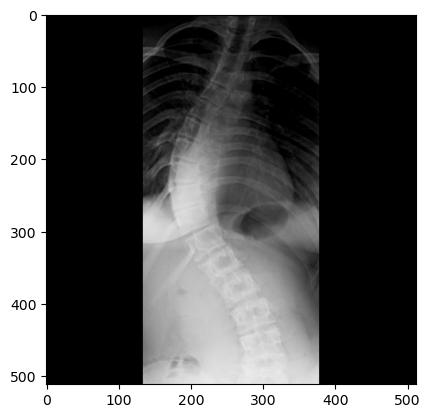

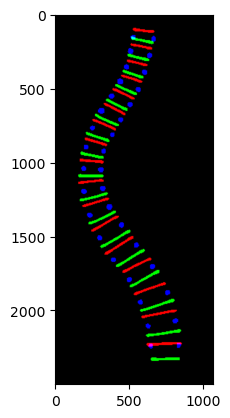

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-295 B AP.jpg
Ground Truth Cobb angles [19.321, 0.041317, 16.482]
Infered Cobb angles [17.754116832976216, 1.8047994290058156, 11.54437518899476]
CMAE :  2.755866046008895
SMAPE :  0.09636670940704686


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


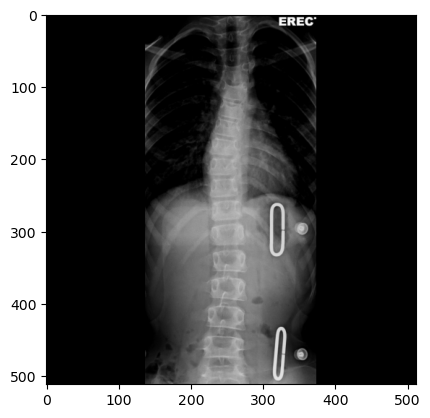

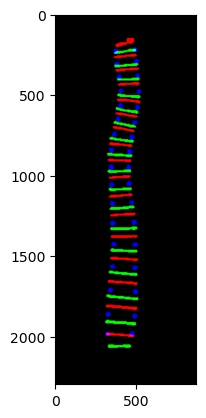

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-295 C AP.jpg
Ground Truth Cobb angles [19.953, 17.483, 19.66]
Infered Cobb angles [19.84155409402912, 13.518458535182477, 10.231787194194261]
CMAE :  4.500809565773921
SMAPE :  0.11297054458363529


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


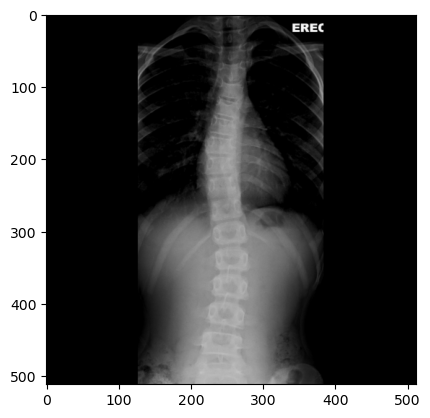

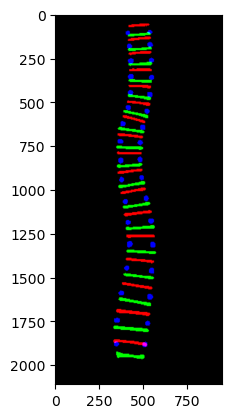

[ WARN:0@2610.820] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-05-Jan-2017-172 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2610.826] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-05-Jan-2017-172 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2610.916] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-05-Jan-2017-172 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-05-Jan-2017-172 A AP.jpg
Ground Truth Cobb angles [45.616, 17.835, 38.664]
Infered Cobb angles [49.16137829720853, 18.910585495519314, 32.83109647646209]
CMAE :  3.484639895869048
SMAPE :  0.04711758973999644


[ WARN:0@2623.121] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-05-Jan-2017-172 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2623.133] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-05-Jan-2017-172 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


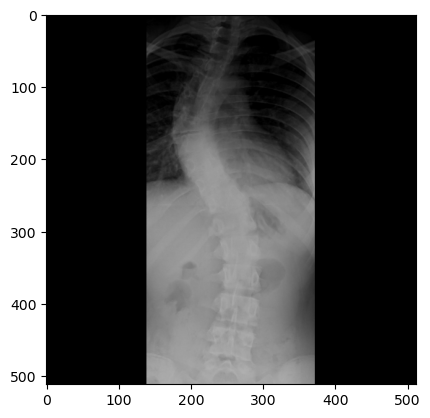

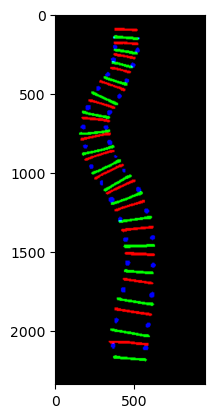

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-311 D AP.jpg
Ground Truth Cobb angles [41.524, 19.011, 23.36]
Infered Cobb angles [42.04299603263633, 19.13669278562768, 22.760249244277897]
CMAE :  0.4148134741458186
SMAPE :  0.0066660039483098605


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


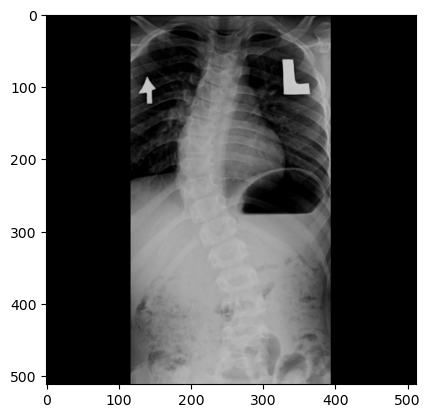

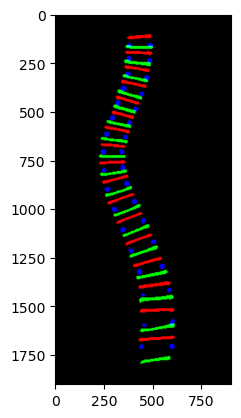

[ WARN:0@2633.192] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-05-Jan-2017-174 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.198] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-05-Jan-2017-174 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.291] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-05-Jan-2017-174 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-05-Jan-2017-174 A AP.jpg
Ground Truth Cobb angles [8.7058, 1.646, 1.7289]
Infered Cobb angles [8.774323818117095, 2.2662873762833033, 2.1779531729492194]
CMAE :  0.37928838772153667
SMAPE :  0.025773381030432693


[ WARN:0@2645.601] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-05-Jan-2017-174 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2645.614] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-05-Jan-2017-174 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


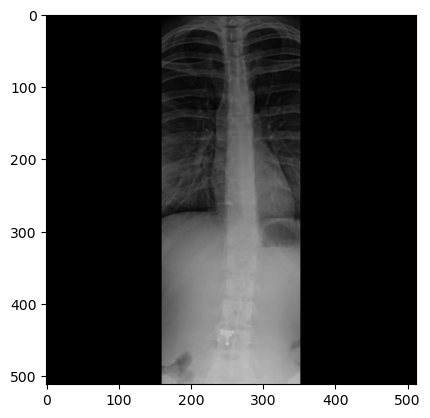

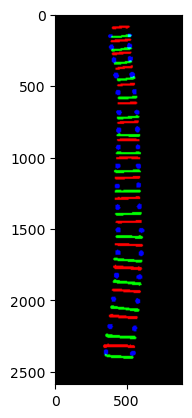

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-311 J AP.jpg
Ground Truth Cobb angles [53.32, 13.642, 30.345]
Infered Cobb angles [50.117498442025756, 14.582954624072597, 30.157438323145954]
CMAE :  1.443616221990927
SMAPE :  0.020524745647022658


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


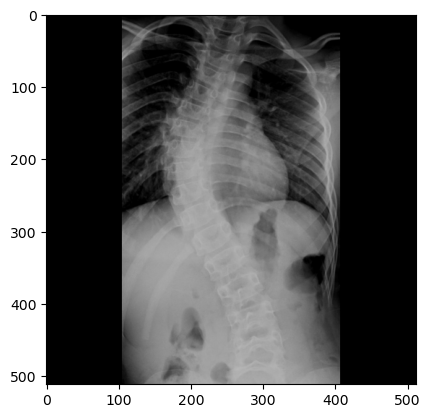

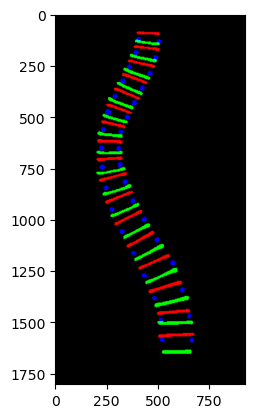

[ WARN:0@2655.691] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-05-Jan-2017-175 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2655.699] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-05-Jan-2017-175 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2655.824] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-05-Jan-2017-175 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-05-Jan-2017-175 A AP.jpg
Ground Truth Cobb angles [10.655, 6.7079, 0.0]
Infered Cobb angles [11.739984740466051, 5.239520144139636, 0.0]
CMAE :  0.8511277700762767
SMAPE :  0.0480028289543984


[ WARN:0@2671.699] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-05-Jan-2017-175 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2671.714] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-05-Jan-2017-175 A AP.jpg'): can't open/read file: check file path/integrity


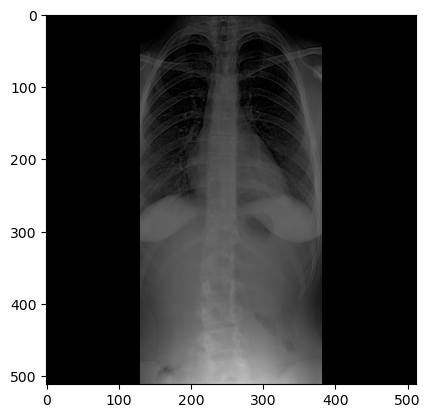

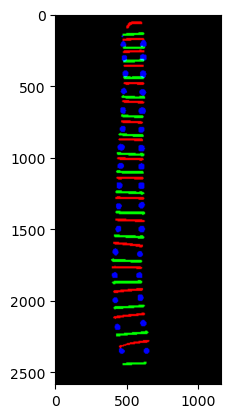

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-311 L AP.jpg
Ground Truth Cobb angles [32.927, 15.759, 16.901]
Infered Cobb angles [29.144854793077613, 4.986204121804999, 17.95201344404906]
CMAE :  5.20031474060875
SMAPE :  0.1143128993664197


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


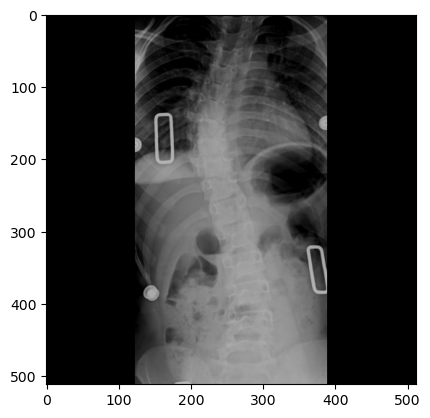

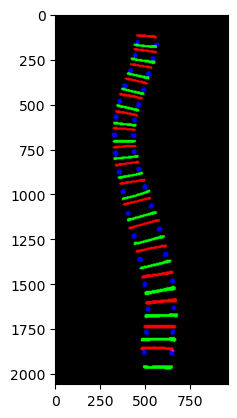

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-311 M AP.jpg
Ground Truth Cobb angles [52.848, 18.095, 28.915]
Infered Cobb angles [49.53561068652949, 15.474904323889511, 26.978874391024636]
CMAE :  2.6228701328152173
SMAPE :  0.03734563207119299


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


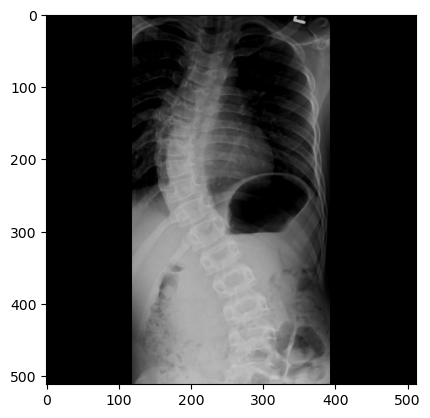

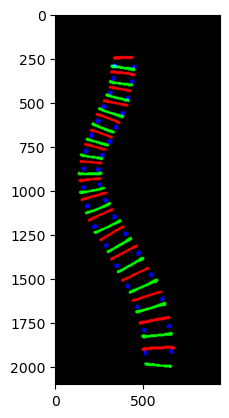

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


1602.0
sunhl-1th-01-Mar-2017-311 O AP.jpg
Ground Truth Cobb angles [27.372, 13.871, 10.869]
Infered Cobb angles [27.431056843414094, 13.80079297162662, 10.767247400514666]
CMAE :  0.07700549027095875
SMAPE :  0.0018787837033952307


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


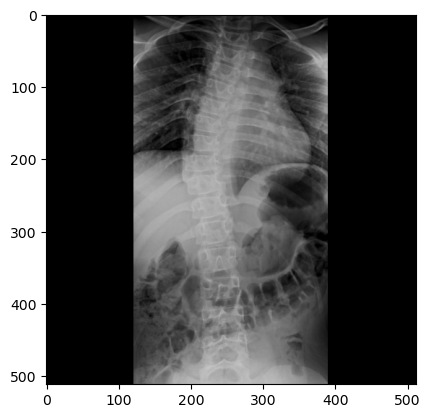

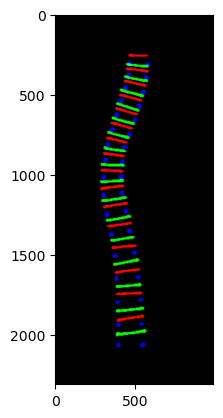

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-311 P AP.jpg
Ground Truth Cobb angles [72.294, 19.667, 38.109]
Infered Cobb angles [68.32995027440981, 24.536394099909806, 33.118197673733945]
CMAE :  4.608085320699478
SMAPE :  0.050287523008460795


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


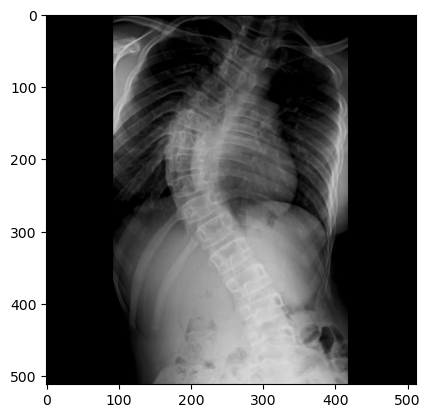

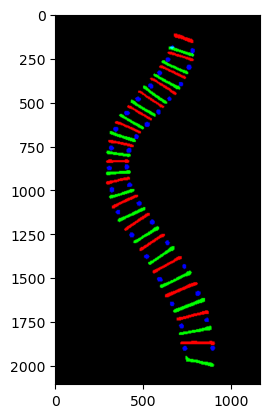

[ WARN:0@2723.572] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-176 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2723.576] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-176 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2723.634] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-176 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-06-Jan-2017-176 B AP.jpg
Ground Truth Cobb angles [11.984, 1.7461, 1.5852]
Infered Cobb angles [10.083676345448474, 1.194083193713663, 4.47279385623133]
CMAE :  1.7799864166801924
SMAPE :  0.10697967601875975


[ WARN:0@2731.352] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-176 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2731.363] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-176 B AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


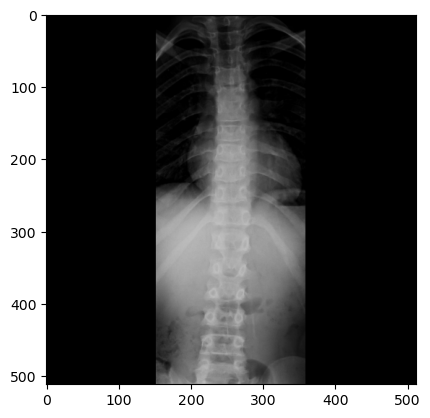

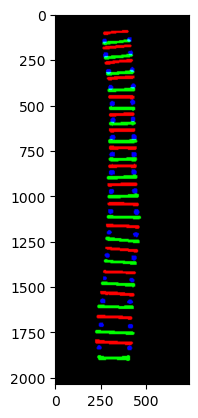

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-312 A AP.jpg
Ground Truth Cobb angles [37.114, 11.177, 26.81]
Infered Cobb angles [31.922433280756792, 13.412350448879398, 24.644230069973375]
CMAE :  3.1974618370563137
SMAPE :  0.058517124851037064


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


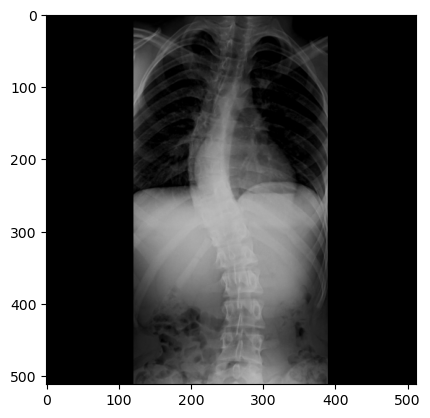

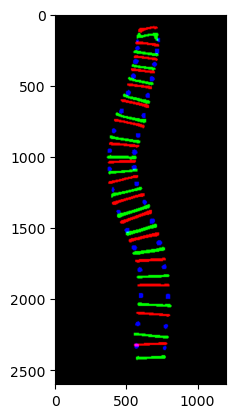

[ WARN:0@2750.438] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-177 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2750.444] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-177 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2750.538] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-177 C AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-06-Jan-2017-177 C AP.jpg
Ground Truth Cobb angles [43.853, 38.813, 11.871]
Infered Cobb angles [45.99324030245551, 27.564795904188497, 19.47195525027746]
CMAE :  6.9971012261052525
SMAPE :  0.10168467555103936


[ WARN:0@2763.212] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-177 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2763.225] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-177 C AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


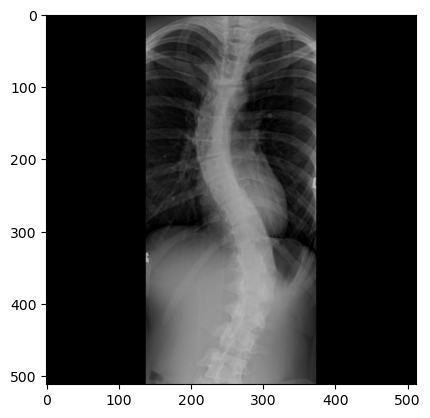

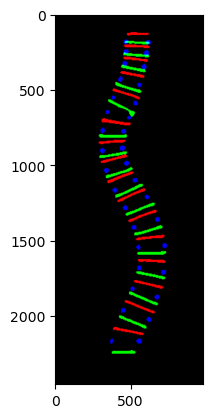

[ WARN:0@2763.711] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-178 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2763.716] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-178 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2763.783] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-178 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-06-Jan-2017-178 A AP.jpg
Ground Truth Cobb angles [58.7, 0.0, 30.266]
Infered Cobb angles [59.39131704006367, 5.2873671898319525, 33.19372115206105]
CMAE :  2.9687907763027694
SMAPE :  0.043300567157720835


[ WARN:0@2773.178] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-178 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2773.190] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-178 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


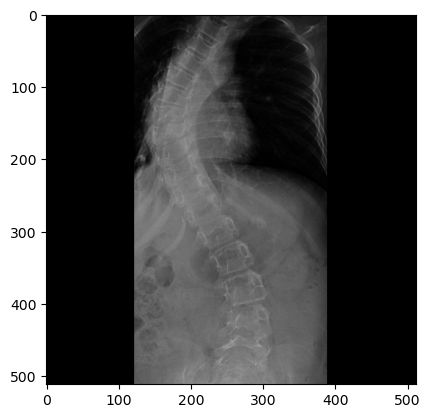

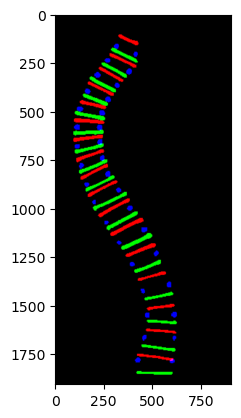

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-312 D AP.jpg
Ground Truth Cobb angles [42.282, 16.976, 28.076]
Infered Cobb angles [44.11097346823111, 18.887677980660825, 23.640965303079987]
CMAE :  2.7251654100907188
SMAPE :  0.04239991507480832


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


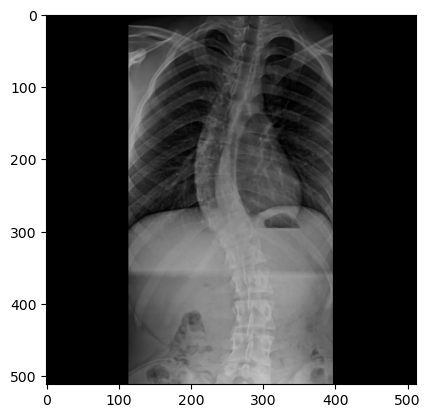

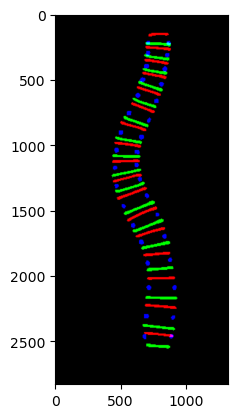

[ WARN:0@2796.281] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-239 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2796.303] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-239 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2796.421] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-239 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-239 A AP.jpg
Ground Truth Cobb angles [43.26, 20.134, 24.293]
Infered Cobb angles [43.890209389078954, 20.62390191243278, 22.839514216828675]
CMAE :  0.8578631617114804
SMAPE :  0.01327347813886631


[ WARN:0@2812.249] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-239 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2812.264] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-239 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


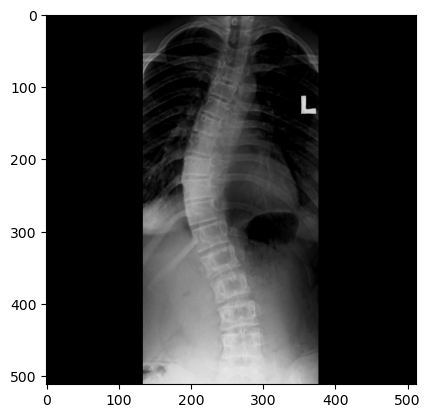

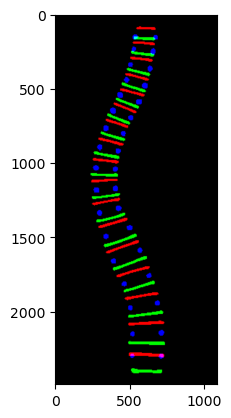

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-313 A AP.jpg
Ground Truth Cobb angles [35.073, 0.92806, 8.147]
Infered Cobb angles [30.221119039137886, 9.043487027125158, 8.883394853220025]
CMAE :  4.568097119871269
SMAPE :  0.12329503610392946


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


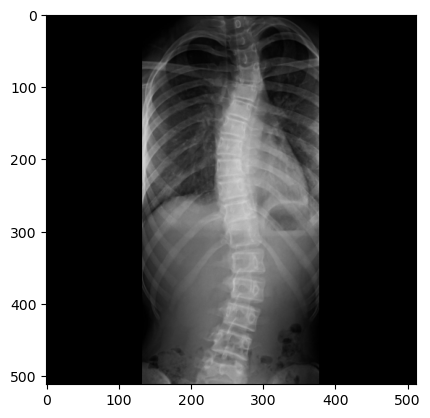

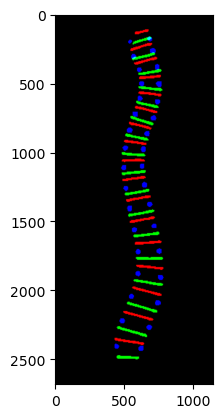

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-313 B AP.jpg
Ground Truth Cobb angles [38.726, 4.013, 4.7835]
Infered Cobb angles [34.530787512510095, 8.37334611576107, 11.423411658691471]
CMAE :  5.065107726217891
SMAPE :  0.12589495002301773


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


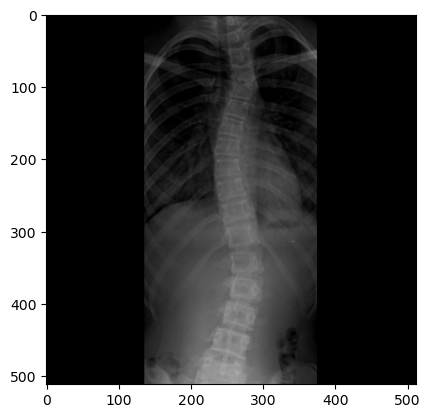

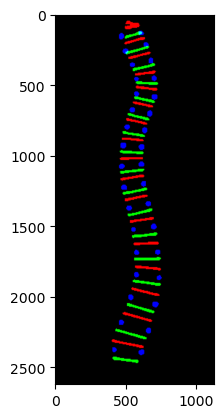

[ WARN:0@2848.610] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-180 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2848.615] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-180 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2848.686] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-180 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-06-Jan-2017-180 A AP.jpg
Ground Truth Cobb angles [27.702, 15.396, 2.8629]
Infered Cobb angles [25.520957193183424, 9.952705912021067, 6.730319774641534]
CMAE :  3.830590532273508
SMAPE :  0.10738510427331555


[ WARN:0@2859.157] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-180 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2859.169] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-180 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


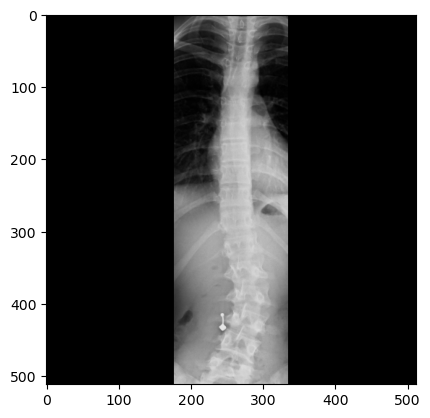

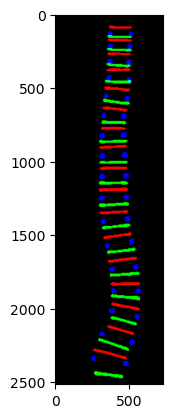

[ WARN:0@2859.525] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-238 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2859.533] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-238 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2859.657] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-238 C AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-238 C AP.jpg
Ground Truth Cobb angles [64.234, 22.443, 34.867]
Infered Cobb angles [58.318089436884804, 22.379949883606045, 32.0111402990294]
CMAE :  2.9449013792077623
SMAPE :  0.03490606437577023


[ WARN:0@2878.006] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-238 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2878.021] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-238 C AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


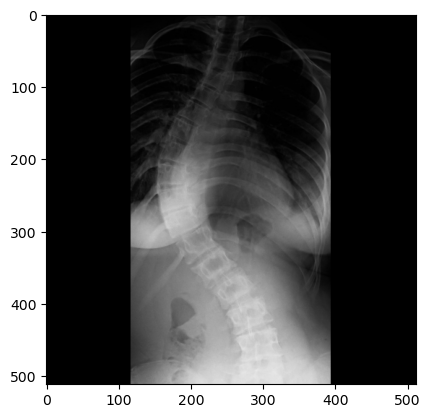

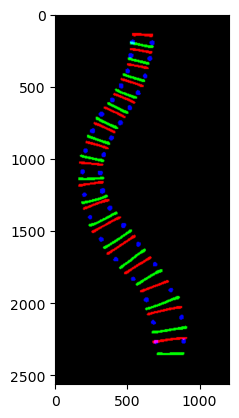

[ WARN:0@2878.603] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-182 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2878.608] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-182 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2878.686] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-182 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-06-Jan-2017-182 B AP.jpg
Ground Truth Cobb angles [23.68, 0.0, 18.127]
Infered Cobb angles [19.929345105608082, 5.316865097442621, 9.627519143160125]
CMAE :  5.855514645408595
SMAPE :  0.18388933728647536


[ WARN:0@2889.388] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-182 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2889.400] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-182 B AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


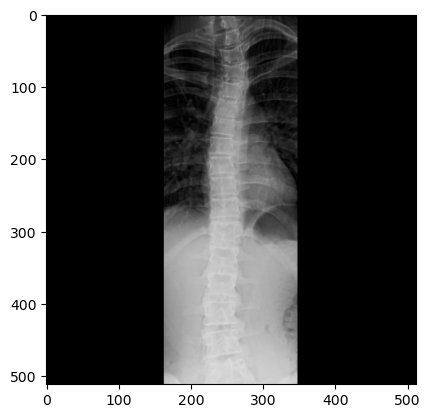

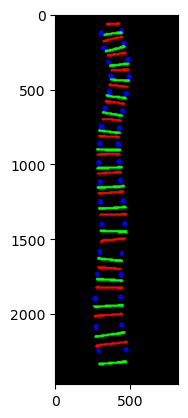

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-314 A AP.jpg
Ground Truth Cobb angles [44.163, 18.397, 19.388]
Infered Cobb angles [44.156010437549, 20.56675724693022, 21.442916288082767]
CMAE :  1.4105892294547973
SMAPE :  0.022633663707693926


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


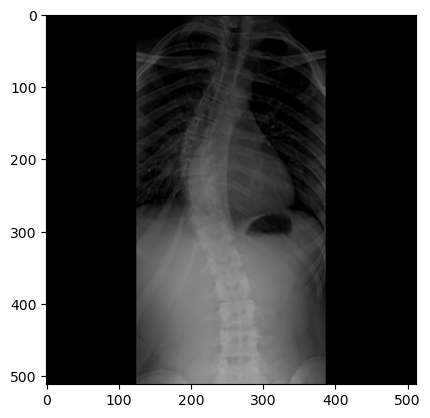

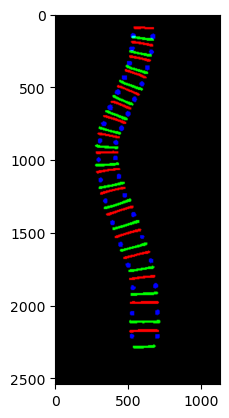

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-314 B AP.jpg
Ground Truth Cobb angles [41.083, 17.512, 19.412]
Infered Cobb angles [41.965336311153244, 18.85906633144095, 20.60069692476801]
CMAE :  1.1393666561567906
SMAPE :  0.019172469304195982


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


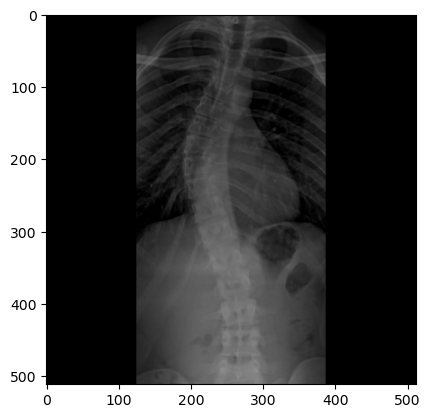

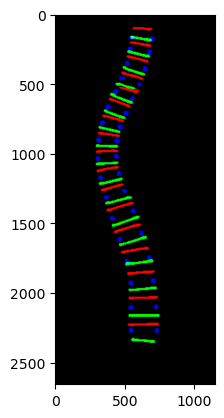

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-314 C AP.jpg
Ground Truth Cobb angles [36.844, 13.085, 12.971]
Infered Cobb angles [40.310088326033345, 16.68589421867951, 15.411080724217584]
CMAE :  3.169025837742363
SMAPE :  0.06167145672274978


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


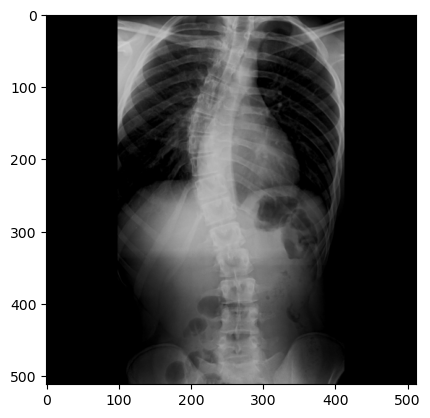

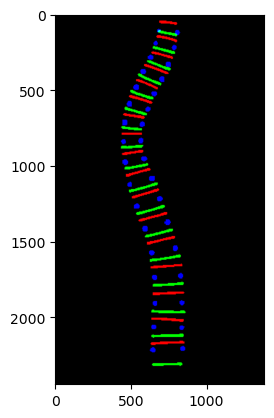

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


59.0
sunhl-1th-01-Mar-2017-315 A AP.jpg
Ground Truth Cobb angles [11.732, 7.6203, 5.0782]
Infered Cobb angles [16.111177836707235, 5.517968889625314, 8.411933292283942]
CMAE :  3.271751489034013
SMAPE :  0.13386647811044652


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


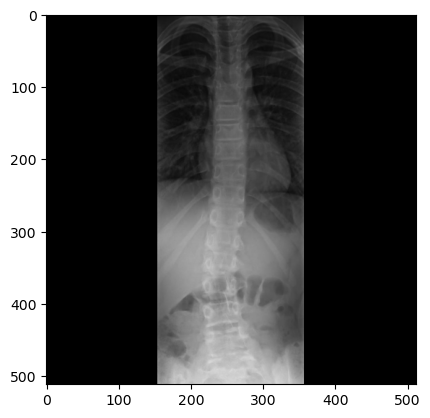

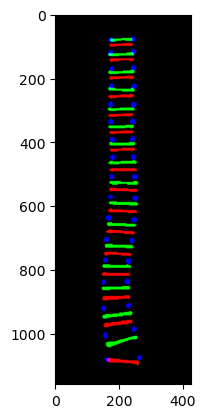

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-315 B AP.jpg
Ground Truth Cobb angles [11.594, 8.4509, 4.6449]
Infered Cobb angles [10.15533490900783, 2.312277810846911, 5.58856433529265]
CMAE :  2.839871759893945
SMAPE :  0.1383371683570476


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


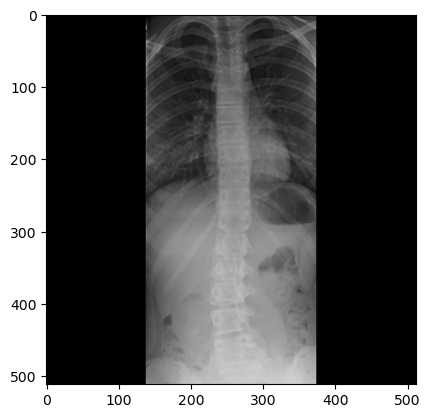

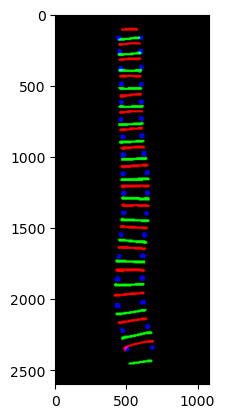

[ WARN:0@2964.227] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-238 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2964.233] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-238 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2964.347] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-238 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-238 B AP.jpg
Ground Truth Cobb angles [59.977, 20.099, 33.892]
Infered Cobb angles [57.161274522055294, 19.94301187571338, 29.731338151315704]
CMAE :  2.377546653677849
SMAPE :  0.02976123845679531


[ WARN:0@2981.446] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-238 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2981.461] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-238 B AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


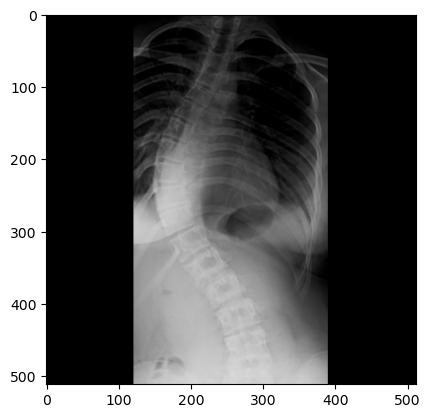

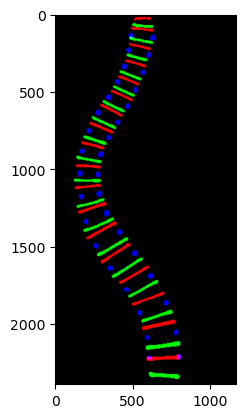

[ WARN:0@2982.011] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-190 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2982.017] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-190 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2982.101] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-190 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-06-Jan-2017-190 A AP.jpg
Ground Truth Cobb angles [30.839, 14.551, 15.01]
Infered Cobb angles [30.95830630241604, 18.155107906489526, 14.675510825156872]
CMAE :  1.3524908842560508
SMAPE :  0.028369312625797893


[ WARN:0@2993.848] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-190 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2993.861] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-190 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


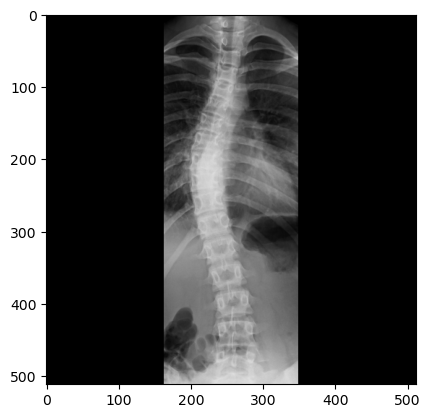

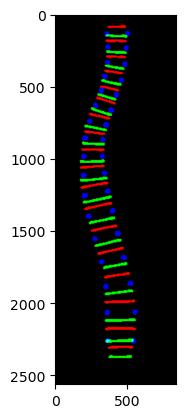

[ WARN:0@2994.317] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-192 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2994.333] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-192 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2994.430] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-192 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-06-Jan-2017-192 A AP.jpg
Ground Truth Cobb angles [47.616, 21.979, 31.575]
Infered Cobb angles [44.246002406345994, 17.416835003231746, 26.69180137460665]
CMAE :  4.271795200747394
SMAPE :  0.06150167123099925


[ WARN:0@3006.707] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-192 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3006.720] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-06-Jan-2017-192 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


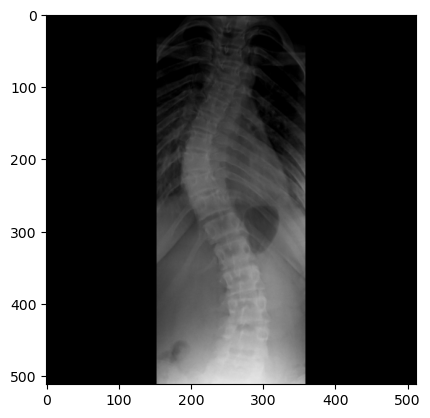

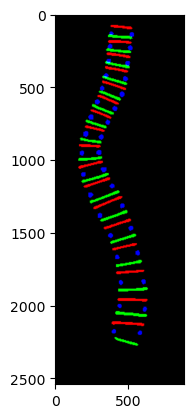

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-317 E AP.jpg
Ground Truth Cobb angles [57.688, 48.546, 6.1322]
Infered Cobb angles [52.920623150372506, 35.00667040766133, 13.691313469913792]
CMAE :  8.620915639598003
SMAPE :  0.11109107600879149


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


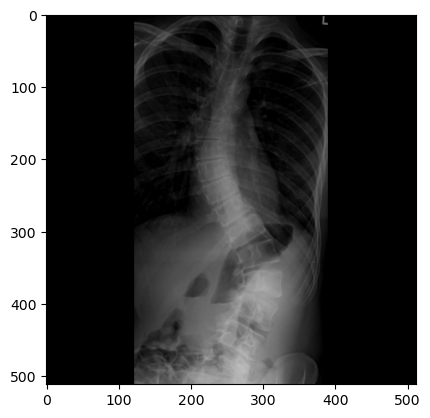

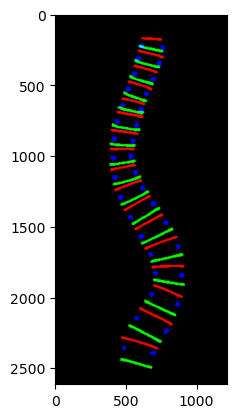

[ WARN:0@3026.457] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-192 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3026.458] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-192 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3026.474] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-192 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

105.0
sunhl-1th-09-Jan-2017-192 B AP.jpg
Ground Truth Cobb angles [33.024, 18.991, 16.54]
Infered Cobb angles [27.216915058068075, 13.852411881489783, 12.286615539958543]
CMAE :  5.06635471539074
SMAPE :  0.10797814509848076


[ WARN:0@3028.420] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-192 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3028.427] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-192 B AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


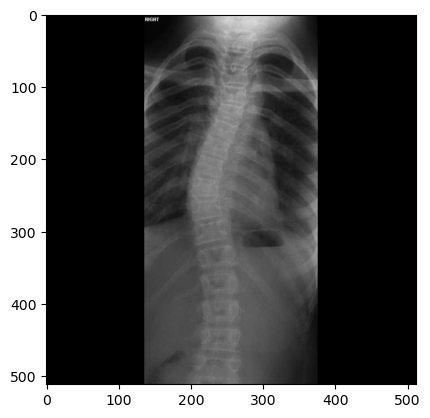

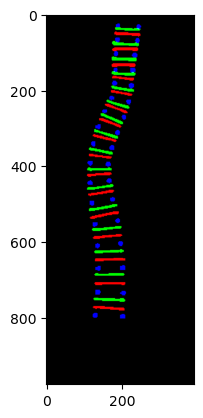

[ WARN:0@3028.649] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-194 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3028.659] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-194 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3028.710] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-194 C AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-194 C AP.jpg
Ground Truth Cobb angles [23.918, 0.0, 3.1398]
Infered Cobb angles [17.279034203998535, 0.0, 7.928385671236072]
CMAE :  3.8097202828386543
SMAPE :  0.16069166132076912


[ WARN:0@3033.902] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-194 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3033.911] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-194 C AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


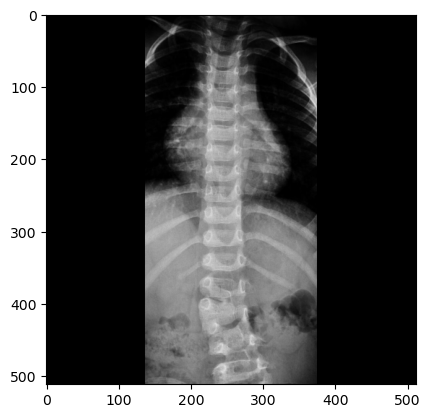

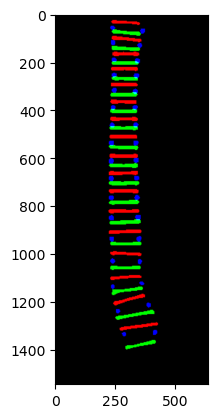

[ WARN:0@3034.202] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-195 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3034.207] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-195 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3034.283] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-195 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-195 A AP.jpg
Ground Truth Cobb angles [18.85, 12.196, 9.261]
Infered Cobb angles [16.68488336687091, 10.183775989336775, 7.559324448430452]
CMAE :  1.9596722065379495
SMAPE :  0.06282037837193553


[ WARN:0@3044.781] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-195 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3044.793] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-195 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


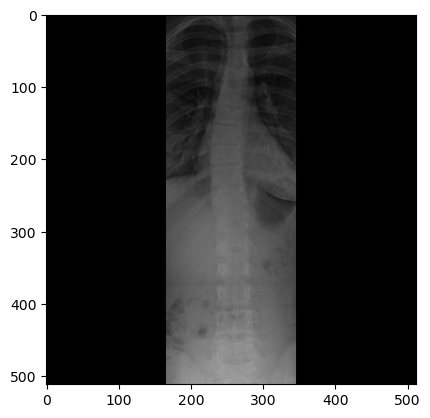

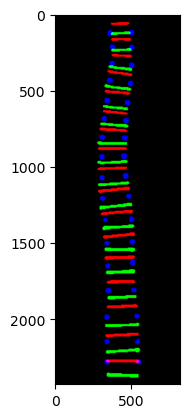

[ WARN:0@3045.222] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-196 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3045.236] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-196 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3045.471] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-196 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-196 B AP.jpg
Ground Truth Cobb angles [17.606, 8.2509, 0.0]
Infered Cobb angles [13.234901352763872, 7.459155367489092, 0.0]
CMAE :  1.7207325155138624
SMAPE :  0.07894193900321071


[ WARN:0@3075.271] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-196 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3075.294] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-196 B AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


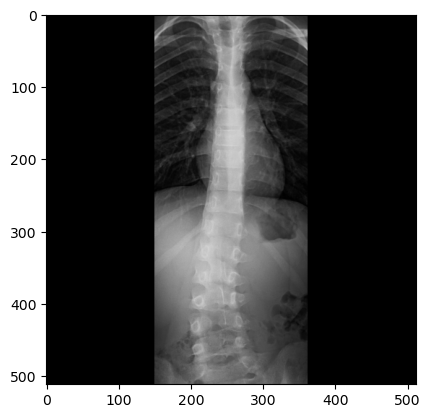

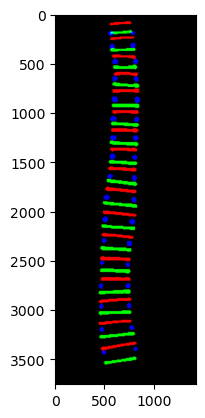

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-320 A AP.jpg
Ground Truth Cobb angles [55.311, 40.749, 24.792]
Infered Cobb angles [53.62954788039336, 33.024354423866896, 27.54982641567797]
CMAE :  4.0540674863300366
SMAPE :  0.0479073294145633


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


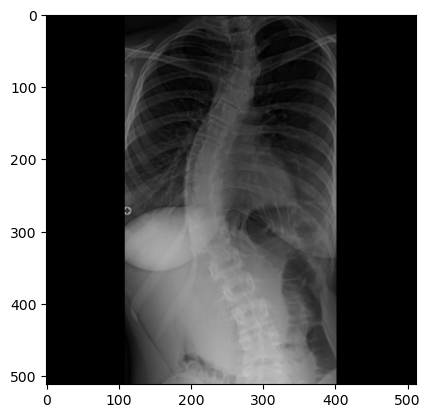

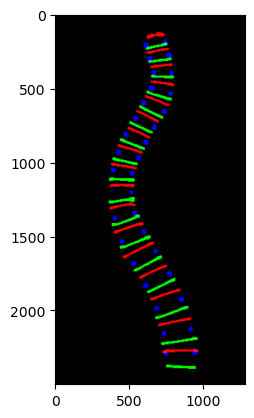

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-321 A AP.jpg
Ground Truth Cobb angles [26.723, 6.0564, 16.887]
Infered Cobb angles [26.152422568686617, 5.215991360899163, 12.061086199875362]
CMAE :  2.078705965333625
SMAPE :  0.05571373855225942


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


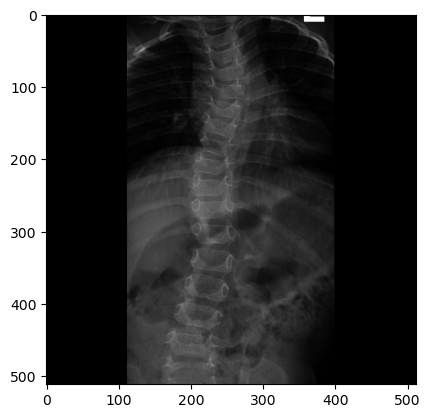

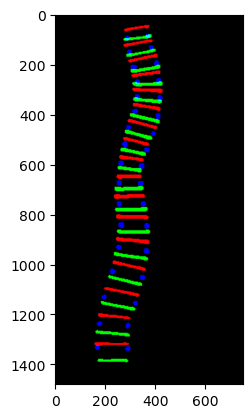

[ WARN:0@3101.869] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-196 E AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3101.874] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-196 E AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3101.954] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-196 E AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-196 E AP.jpg
Ground Truth Cobb angles [23.781, 0.0, 13.747]
Infered Cobb angles [26.071367609951693, 3.7085564321870845, 15.046328084309518]
CMAE :  2.4327402547113577
SMAPE :  0.07211440228600627


[ WARN:0@3112.297] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-196 E AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3112.308] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-196 E AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


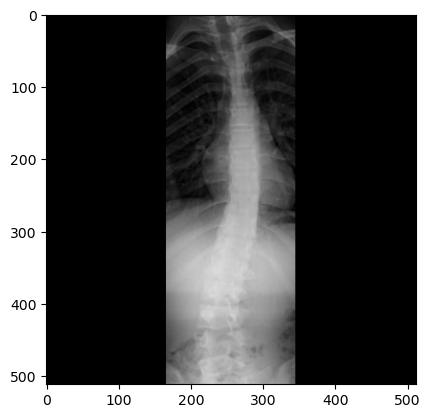

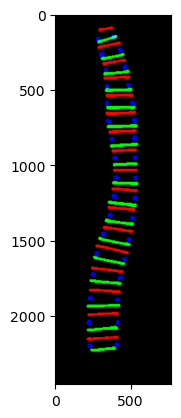

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-01-Mar-2017-321 D AP.jpg
Ground Truth Cobb angles [15.209, 0.0, 2.6406]
Infered Cobb angles [12.510617581622126, 0.9886898511938249, 6.206099775587063]
CMAE :  2.4175474067813085
SMAPE :  0.1285812998577913


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


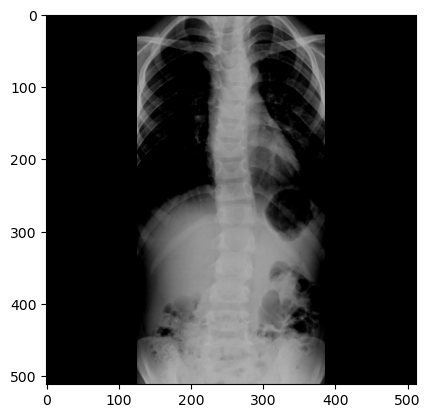

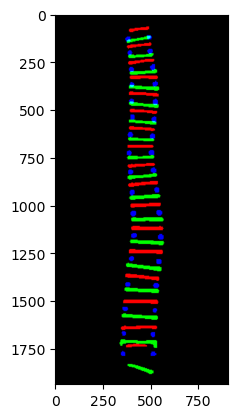

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-07-Feb-2017-282 A AP.jpg
Ground Truth Cobb angles [16.007, 9.4175, 1.9516]
Infered Cobb angles [16.61834695538311, 7.961285277985629, 12.442486988836725]
CMAE :  4.18301866610387
SMAPE :  0.15085626786481068


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


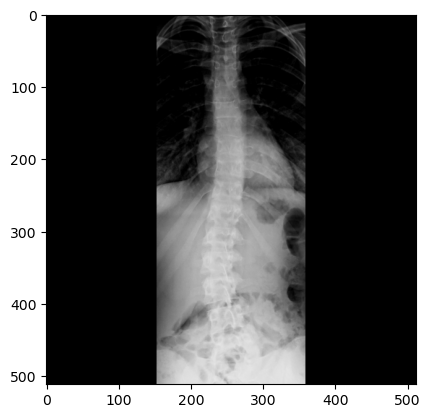

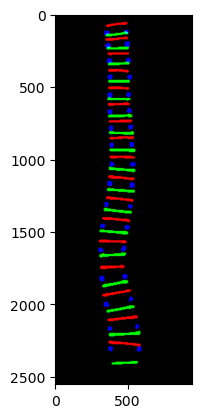

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-07-Feb-2017-283 A AP.jpg
Ground Truth Cobb angles [14.189, 3.8682, 8.1103]
Infered Cobb angles [12.966539659010625, 4.398555036869144, 2.473163310612591]
CMAE :  2.4629306463709417
SMAPE :  0.11394520540670632


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


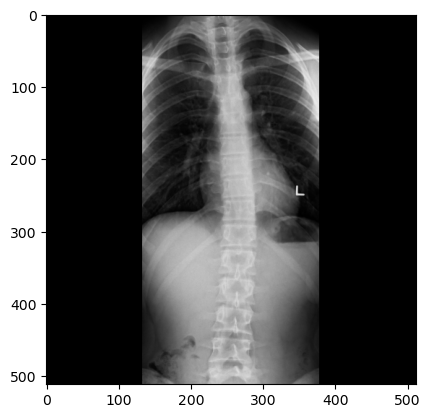

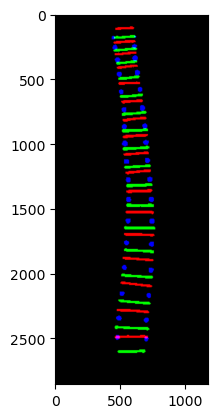

[ WARN:0@3154.873] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-238 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3154.880] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-238 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3154.992] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-238 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-238 A AP.jpg
Ground Truth Cobb angles [43.887, 20.698, 23.624]
Infered Cobb angles [40.49050584863233, 17.55459334416076, 22.61777257029208]
CMAE :  2.515418483030506
SMAPE :  0.04019854488637544


[ WARN:0@3170.996] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-238 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3171.010] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-238 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


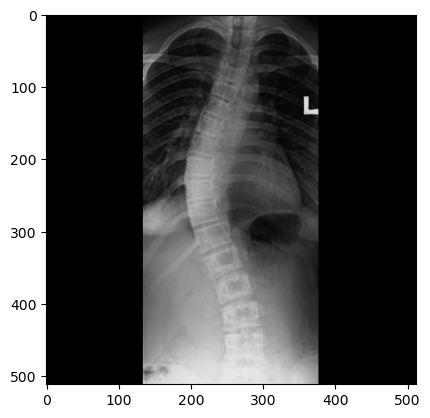

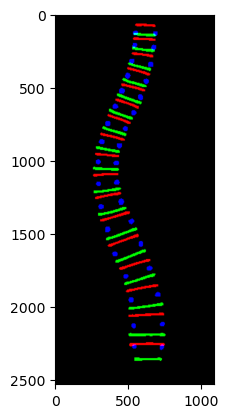

[ WARN:0@3171.578] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-197 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3171.584] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-197 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3171.688] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-197 C AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-197 C AP.jpg
Ground Truth Cobb angles [16.105, 0.0, 10.485]
Infered Cobb angles [13.496383001321616, 4.972829275324679, 5.456121529114834]
CMAE :  4.2034930106953015
SMAPE :  0.18179694070680824


[ WARN:0@3184.738] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-197 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3184.751] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-197 C AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


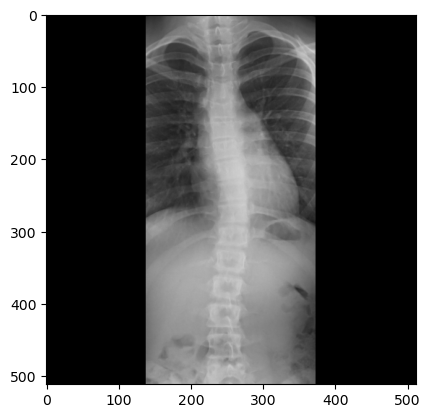

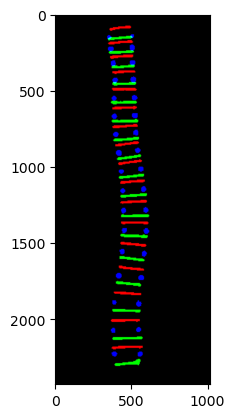

[ WARN:0@3185.248] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-199 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3185.254] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-199 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3185.357] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-199 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-199 B AP.jpg
Ground Truth Cobb angles [21.034, 1.3901, 12.247]
Infered Cobb angles [19.86170759940215, 2.546648416501527, 10.11530037344644]
CMAE :  1.486843413002611
SMAPE :  0.05184003827628315


[ WARN:0@3198.838] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-199 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3198.851] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-199 B AP.jpg'): can't open/read file: check file path/integrity


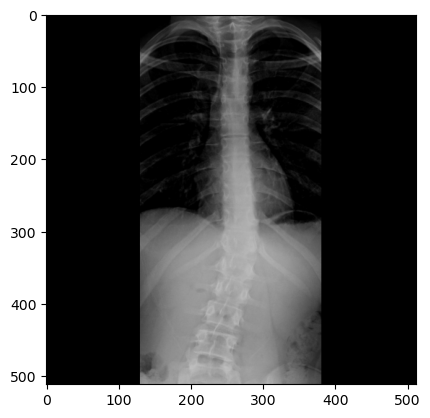

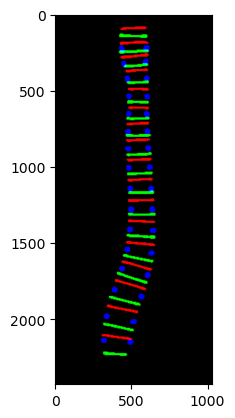

[ WARN:0@3199.363] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-199 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3199.369] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-199 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3199.470] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-199 C AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-199 C AP.jpg
Ground Truth Cobb angles [15.93, 0.0, 9.7103]
Infered Cobb angles [17.260906275565866, 3.556839848768756, 12.52659274254558]
CMAE :  2.56802837670598
SMAPE :  0.09898013190503893


[ WARN:0@3212.504] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-199 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3212.517] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-199 C AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


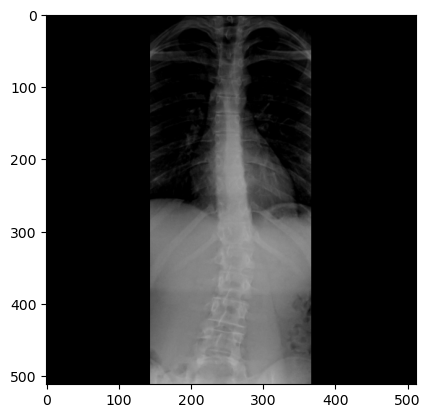

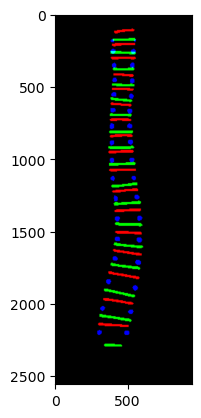

[ WARN:0@3213.004] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-202 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3213.009] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-202 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3213.088] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-202 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-202 A AP.jpg
Ground Truth Cobb angles [12.906, 0.0, 10.627]
Infered Cobb angles [10.881492780659437, 0.0, 2.236758960680777]
CMAE :  3.470326424237041
SMAPE :  0.18765039099828387


[ WARN:0@3223.229] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-202 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3223.241] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-202 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


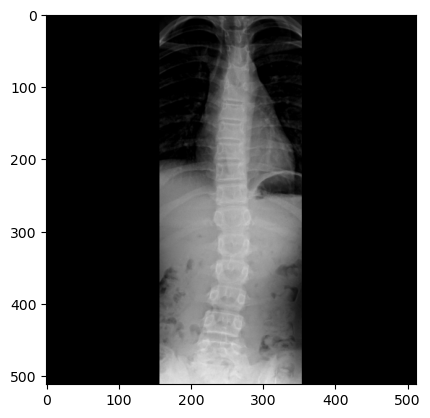

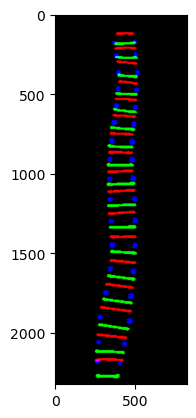

[ WARN:0@3223.665] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-202 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3223.670] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-202 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3223.767] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-202 C AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-202 C AP.jpg
Ground Truth Cobb angles [25.132, 6.9755, 4.7717]
Infered Cobb angles [24.99809571913535, 6.834885699591869, 9.073826664544999]
CMAE :  1.5252766074337585
SMAPE :  0.04735984410035559


[ WARN:0@3236.357] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-202 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3236.370] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-202 C AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


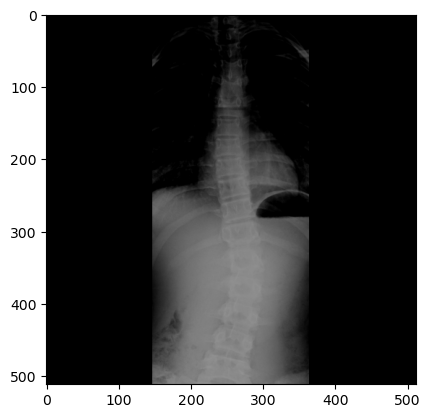

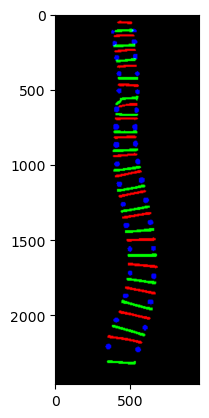

[ WARN:0@3236.835] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-204 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3236.839] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-204 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3236.909] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-204 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-204 A AP.jpg
Ground Truth Cobb angles [93.802, 32.173, 20.124]
Infered Cobb angles [79.43467569427213, 31.977549392977917, 20.589902611900424]
CMAE :  4.999114992383856
SMAPE :  0.050610011539314444


[ WARN:0@3246.280] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-204 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3246.292] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-204 A AP.jpg'): can't open/read file: check file path/integrity


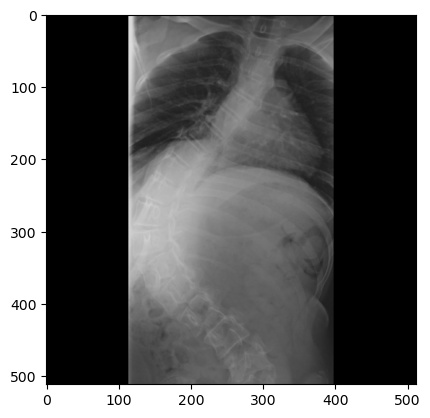

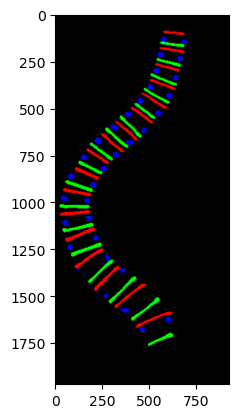

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-15-Feb-2017-287 A AP.jpg
Ground Truth Cobb angles [54.345, 24.119, 33.424]
Infered Cobb angles [46.31497139761231, 20.514949917885346, 26.000326090039078]
CMAE :  6.352835022139899
SMAPE :  0.08524372611284343


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


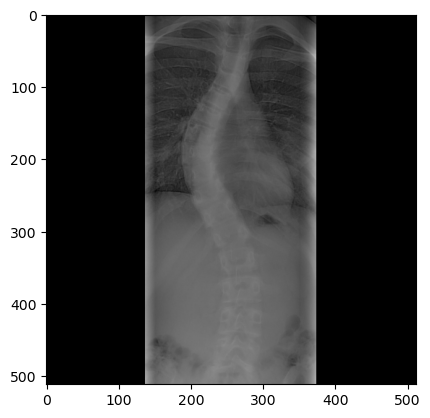

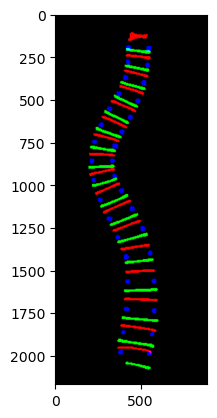

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-15-Feb-2017-287 B AP.jpg
Ground Truth Cobb angles [53.508, 24.125, 27.788]
Infered Cobb angles [55.020251970547584, 24.59410830486303, 30.23011545599567]
CMAE :  1.4744937755880398
SMAPE :  0.018894454150059425


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


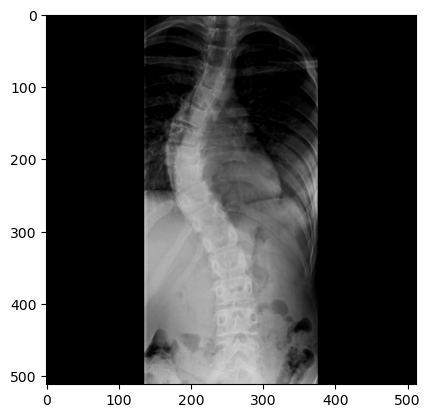

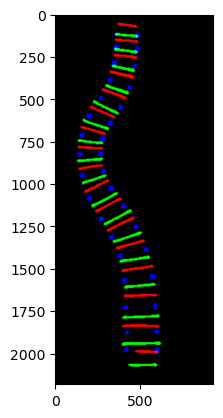

[ WARN:0@3269.605] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-205 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3269.609] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-205 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3269.661] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-205 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-205 B AP.jpg
Ground Truth Cobb angles [21.91, 11.294, 2.0718]
Infered Cobb angles [18.798120391483316, 9.765322914390985, 5.868294670413703]
CMAE :  2.8123696680866335
SMAPE :  0.09527245072284887


[ WARN:0@3276.883] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-205 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3276.893] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-205 B AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


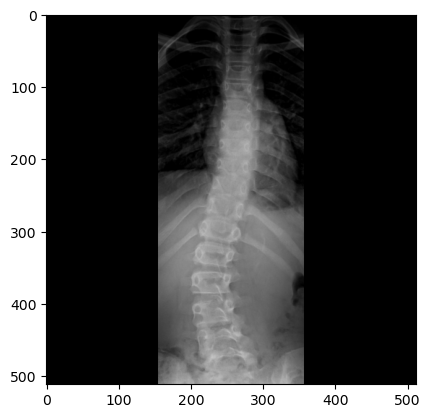

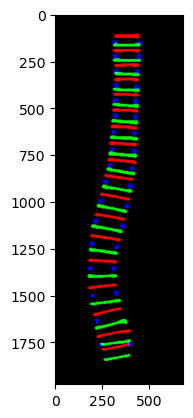

[ WARN:0@3277.264] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-205 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3277.267] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-205 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3277.318] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-205 C AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-205 C AP.jpg
Ground Truth Cobb angles [25.891, 13.6, 1.5791]
Infered Cobb angles [20.998168481523823, 12.439511252121099, 3.034871536932504]
CMAE :  2.5028599576641657
SMAPE :  0.07790144060423321


[ WARN:0@3284.139] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-205 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3284.149] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-205 C AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


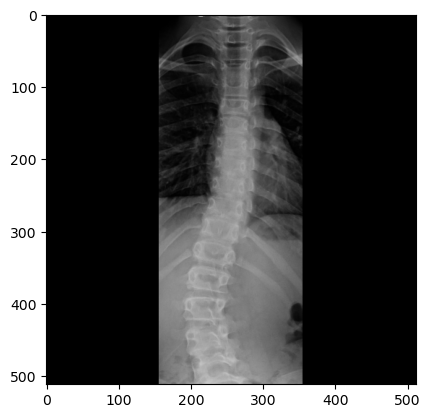

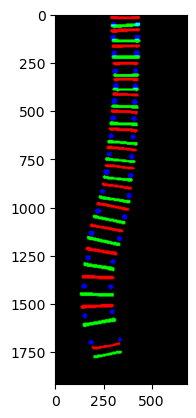

[ WARN:0@3284.494] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-205 D AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3284.499] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-205 D AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3284.569] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-205 D AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-205 D AP.jpg
Ground Truth Cobb angles [29.656, 19.908, 4.5513]
Infered Cobb angles [22.742562148979783, 14.209075761965687, 3.1312468203356336]
CMAE :  4.677849707595925
SMAPE :  0.12412822394932906


[ WARN:0@3294.387] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-205 D AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3294.399] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-205 D AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


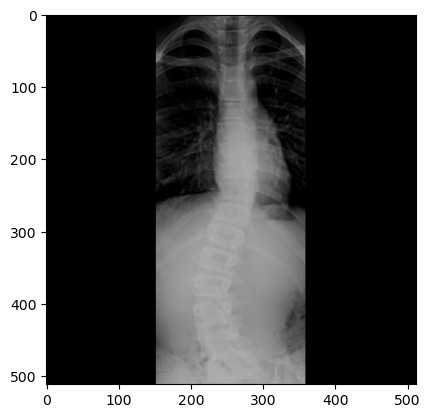

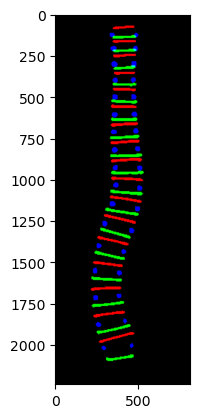

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-15-Feb-2017-287 F AP.jpg
Ground Truth Cobb angles [70.773, 23.06, 45.194]
Infered Cobb angles [65.24248204512583, 29.754966814892775, 32.9495915311639]
CMAE :  8.155833676903107
SMAPE :  0.08561187233761626


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


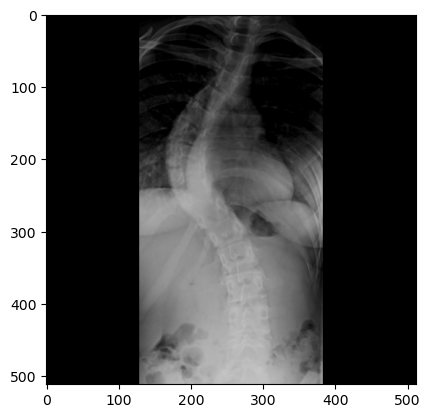

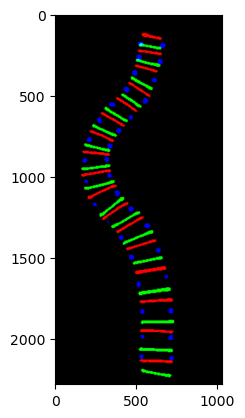

[ WARN:0@3309.454] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-206 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3309.460] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-206 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3309.549] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-206 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-206 A AP.jpg
Ground Truth Cobb angles [39.115, 13.516, 27.273]
Infered Cobb angles [38.74593976582411, 12.322790261507352, 24.508756229181216]
CMAE :  1.4421533135221347
SMAPE :  0.024817804617197643


[ WARN:0@3321.331] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-206 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3321.344] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-206 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


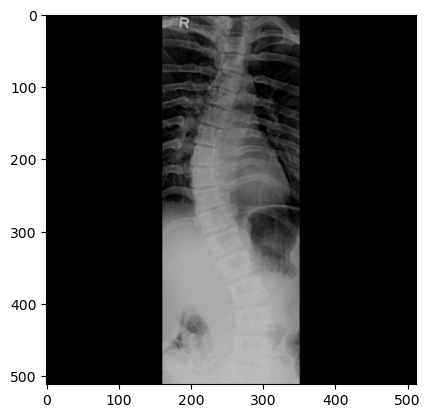

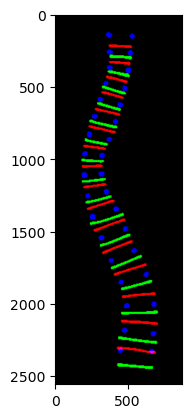

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-15-Feb-2017-288 B AP.jpg
Ground Truth Cobb angles [43.055, 32.551, 10.937]
Infered Cobb angles [39.21825463021584, 21.155978331150077, 13.855428343215298]
CMAE :  6.048181134049514
SMAPE :  0.10104649448236543


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


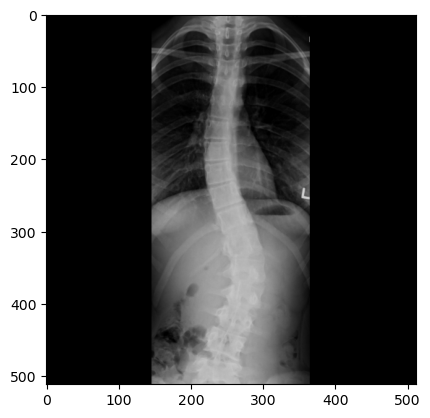

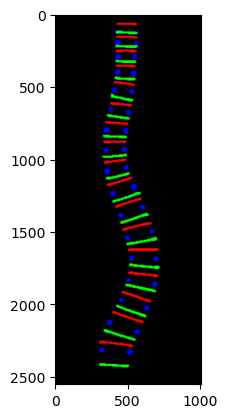

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-15-Feb-2017-289 A AP.jpg
Ground Truth Cobb angles [52.21, 25.463, 0.0]
Infered Cobb angles [48.35156083514956, 22.86347395341233, 14.897243593230721]
CMAE :  7.112564747887465
SMAPE :  0.11692845390710492


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


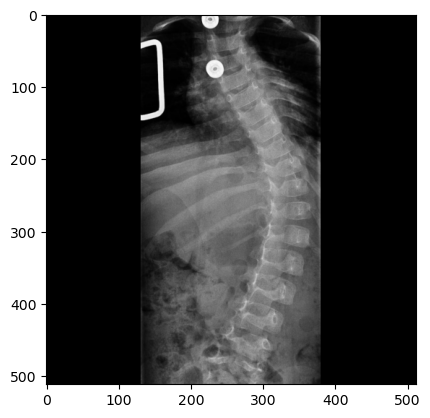

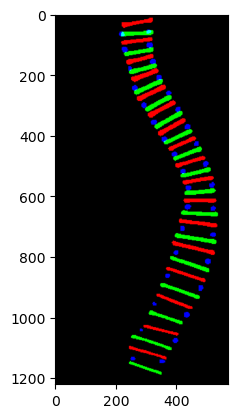

[ WARN:0@3340.353] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-206 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3340.359] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-206 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3340.451] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-206 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-206 B AP.jpg
Ground Truth Cobb angles [45.359, 17.536, 29.255]
Infered Cobb angles [43.003262639812924, 16.042275015375335, 28.044447242614268]
CMAE :  1.686668580141546
SMAPE :  0.025544080122898754


[ WARN:0@3353.110] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-206 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3353.123] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-206 B AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


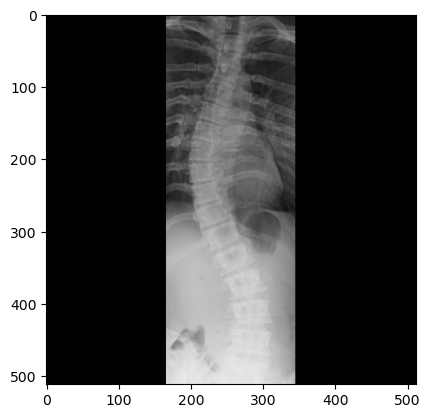

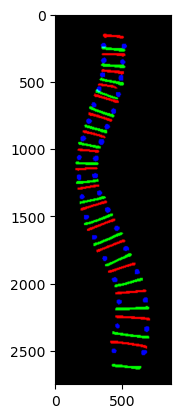

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-15-Feb-2017-290 A AP.jpg
Ground Truth Cobb angles [17.453, 0.0, 6.1536]
Infered Cobb angles [11.562276175950005, 1.0360577811824803, 4.435905527093921]
CMAE :  2.8811637315078595
SMAPE :  0.14530876823354957


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


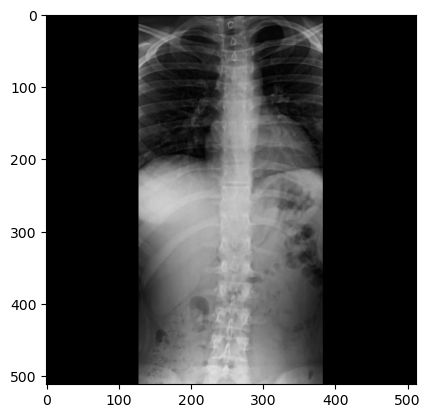

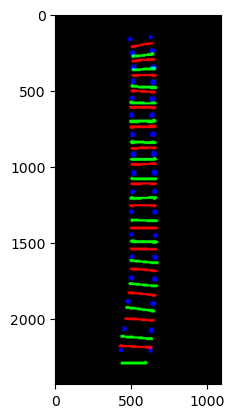

[ WARN:0@3368.716] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-207 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3368.721] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-207 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3368.799] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-207 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-207 A AP.jpg
Ground Truth Cobb angles [54.414, 31.248, 35.984]
Infered Cobb angles [51.205717387982254, 20.257578479290615, 26.046571952891586]
CMAE :  8.046747651885642
SMAPE :  0.10141000906781612


[ WARN:0@3379.695] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-207 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3379.707] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-207 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


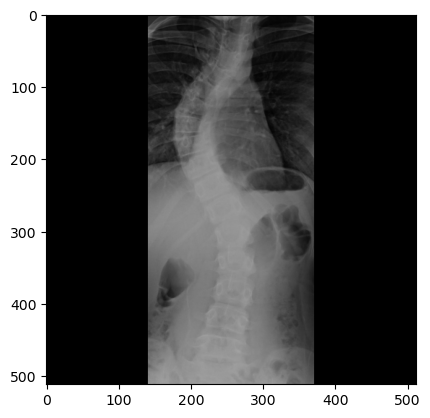

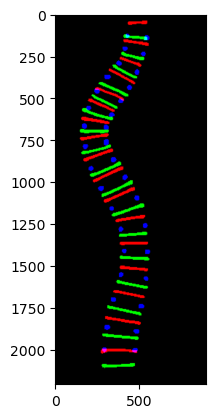

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-15-Feb-2017-291 B AP.jpg
Ground Truth Cobb angles [35.869, 17.308, 6.6546]
Infered Cobb angles [29.547170421095657, 13.766272202506759, 7.589327782017314]
CMAE :  3.599407123146574
SMAPE :  0.08333043660949611


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


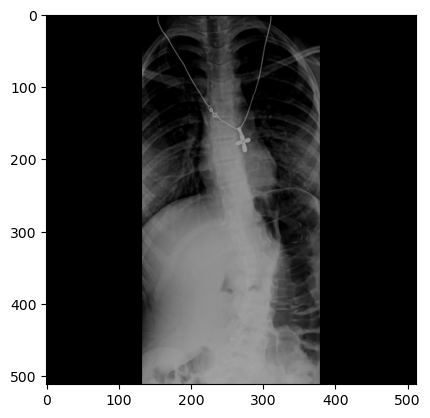

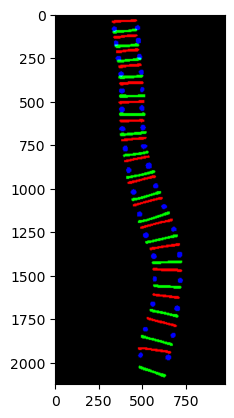

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-15-Feb-2017-291 C AP.jpg
Ground Truth Cobb angles [42.281, 25.543, 5.0576]
Infered Cobb angles [35.16891470777143, 21.404279179423874, 11.715300517990663]
CMAE :  5.969575311753322
SMAPE :  0.11191442172402051


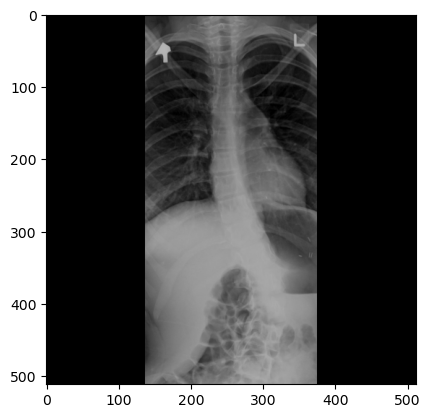

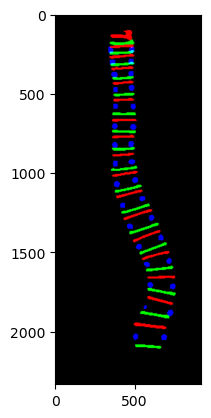

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-16-Feb-2017-291 D AP.jpg
Ground Truth Cobb angles [35.127, 24.566, 3.3988]
Infered Cobb angles [25.18380010905903, 18.654950005777952, 6.379232566794363]
CMAE :  6.2780019675261665
SMAPE :  0.1425149569529216


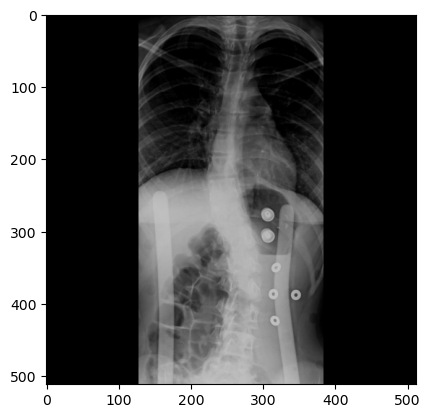

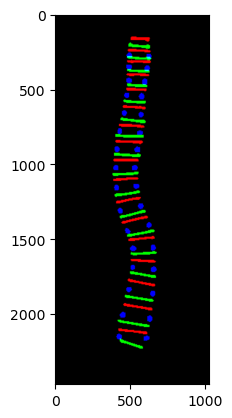

[ WARN:0@3418.017] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-237 E AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3418.022] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-237 E AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3418.093] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-237 E AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-237 E AP.jpg
Ground Truth Cobb angles [24.567, 5.2775, 22.321]
Infered Cobb angles [25.298736821705283, 7.020105853631705, 18.094446817486876]
CMAE :  2.2335573172306358
SMAPE :  0.05518395095464692


[ WARN:0@3428.042] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-237 E AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3428.054] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-237 E AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


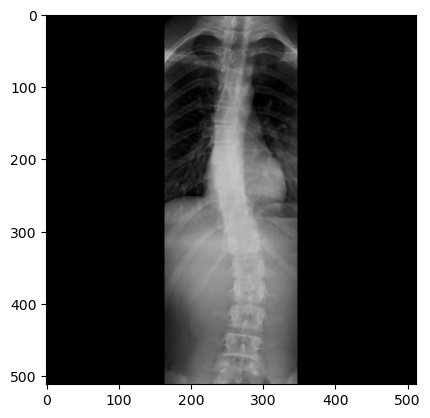

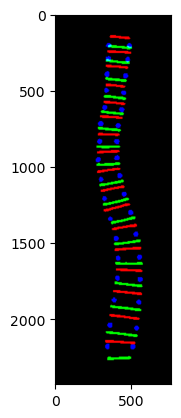

[ WARN:0@3428.462] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-209 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3428.468] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-209 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3428.569] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-209 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-209 B AP.jpg
Ground Truth Cobb angles [32.1, 13.308, 6.7765]
Infered Cobb angles [30.388182019036275, 8.674659566073132, 11.2714121623242]
CMAE :  3.613443683371986
SMAPE :  0.08931549435582223


[ WARN:0@3441.476] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-209 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3441.489] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-209 B AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


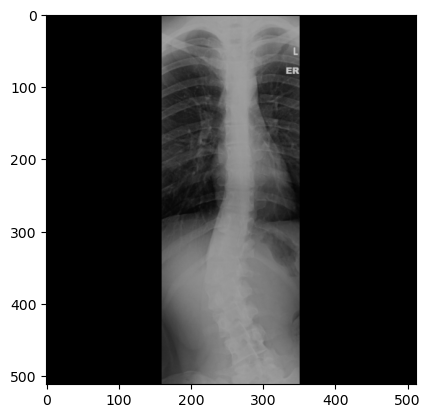

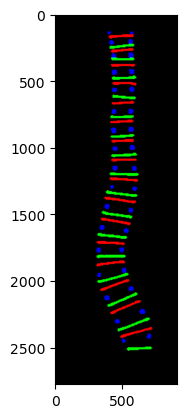

[ WARN:0@3441.998] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-210 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3442.002] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-210 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3442.074] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-210 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-210 A AP.jpg
Ground Truth Cobb angles [73.411, 30.283, 42.777]
Infered Cobb angles [76.14992279831999, 33.9753320322439, 45.8798723141047]
CMAE :  3.1780415196764524
SMAPE :  0.02967122656891425


[ WARN:0@3451.246] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-210 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3451.258] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-210 A AP.jpg'): can't open/read file: check file path/integrity


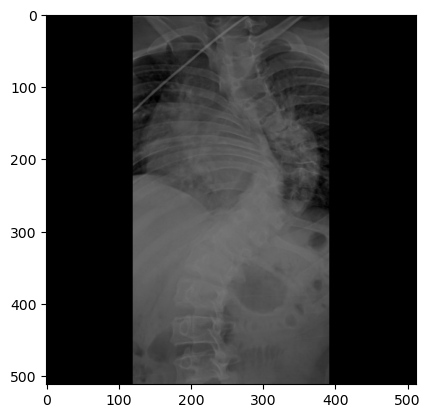

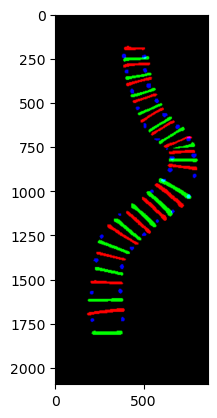

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-239 A AP.jpg
Ground Truth Cobb angles [44.123, 16.449, 25.076]
Infered Cobb angles [41.4917745658368, 17.871547585160624, 23.47736028270598]
CMAE :  1.8841325802711966
SMAPE :  0.03017223171437853


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


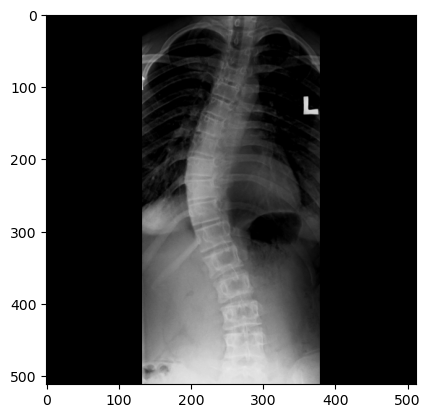

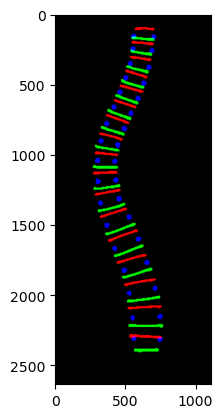

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-239 B AP.jpg
Ground Truth Cobb angles [58.912, 20.255, 33.227]
Infered Cobb angles [59.24773633592354, 21.48570799493977, 30.91491089785183]
CMAE :  1.2928414000009727
SMAPE :  0.015968145726401782


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


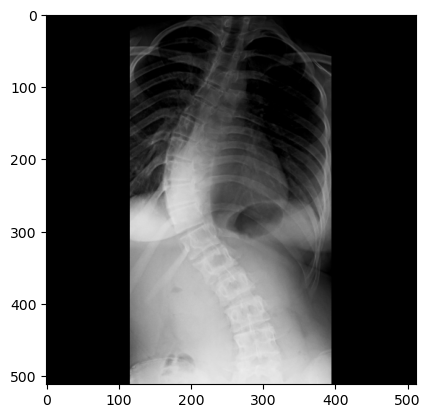

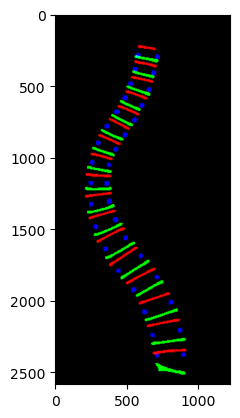

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-239 C AP.jpg
Ground Truth Cobb angles [65.858, 23.355, 38.382]
Infered Cobb angles [60.31383726585816, 22.049860899258142, 35.17107949396068]
CMAE :  3.353374975024163
SMAPE :  0.03810988612050102


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


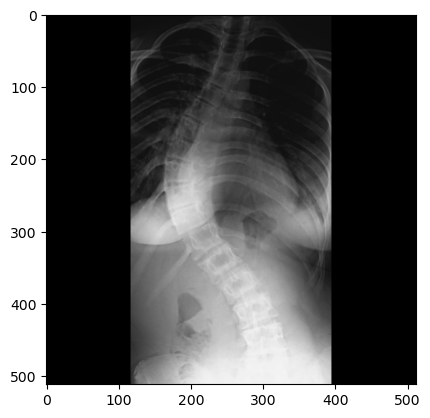

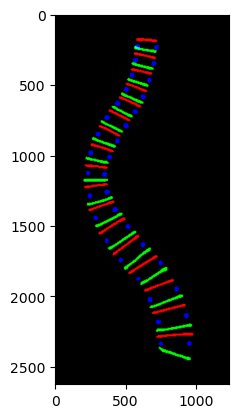

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


242.0
sunhl-1th-28-Feb-2017-239 D AP.jpg
Ground Truth Cobb angles [65.326, 18.936, 37.521]
Infered Cobb angles [62.80787898509146, 18.902757613484145, 33.842309616038136]
CMAE :  2.076757981060702
SMAPE :  0.024318525964342905


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


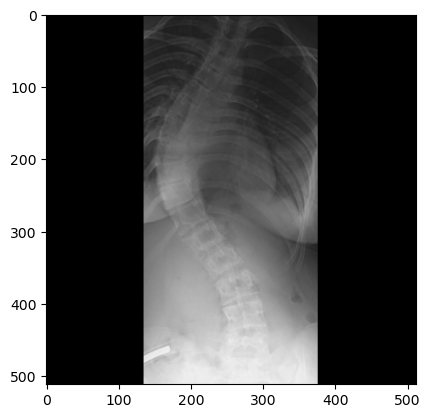

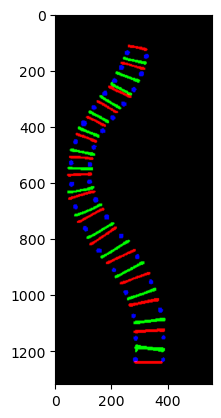

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-240 A AP.jpg
Ground Truth Cobb angles [49.088, 30.214, 34.736]
Infered Cobb angles [45.031946191387334, 24.58932684110736, 24.964450190678885]
CMAE :  6.483743750979435
SMAPE :  0.0855145573579717


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


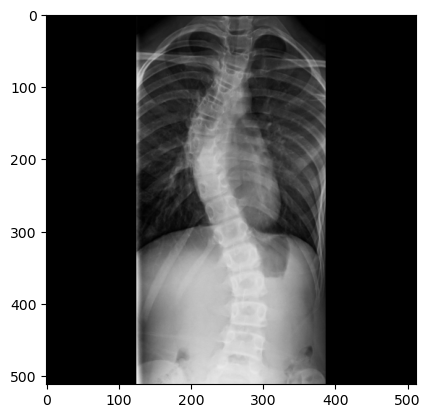

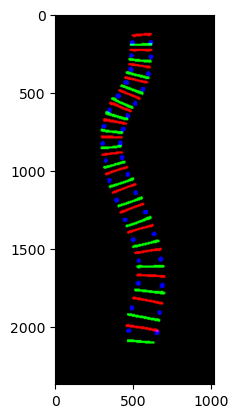

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-240 B AP.jpg
Ground Truth Cobb angles [59.096, 34.551, 34.973]
Infered Cobb angles [51.27587518336263, 26.279963098436472, 30.338644630121962]
CMAE :  6.908649149979566
SMAPE :  0.08116067235917836


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


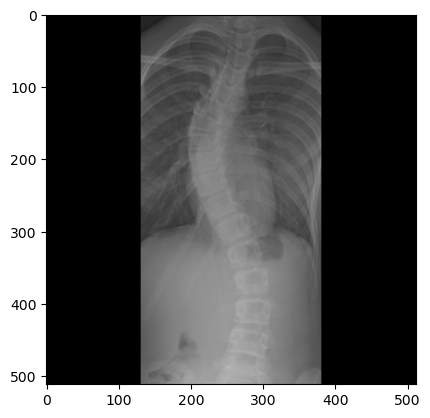

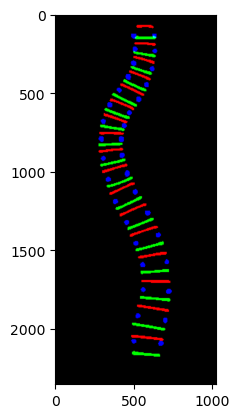

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-241 A AP.jpg
Ground Truth Cobb angles [31.407, 17.617, 2.7552]
Infered Cobb angles [31.356748457070147, 15.533302207780439, 15.964532568356201]
CMAE :  5.108095408300795
SMAPE :  0.11494529579993759


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


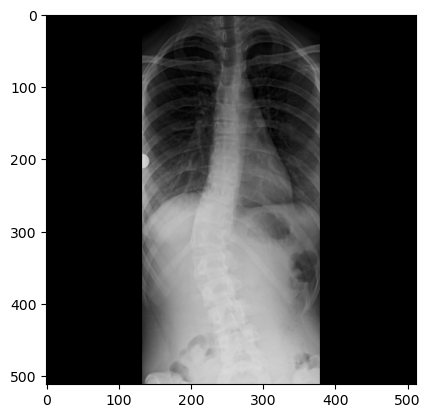

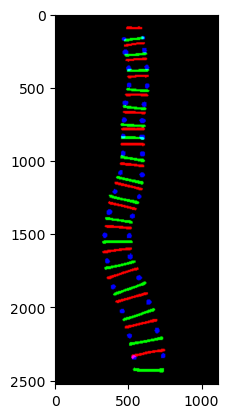

[ WARN:0@3556.704] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-236 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3556.710] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-236 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3556.787] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-236 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-236 A AP.jpg
Ground Truth Cobb angles [11.206, 5.1955, 6.6488]
Infered Cobb angles [11.470462961654153, 6.5663255681491455, 5.278764521602451]
CMAE :  1.0017797569641018
SMAPE :  0.046083035520756314


[ WARN:0@3566.672] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-236 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3566.684] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-236 A AP.jpg'): can't open/read file: check file path/integrity


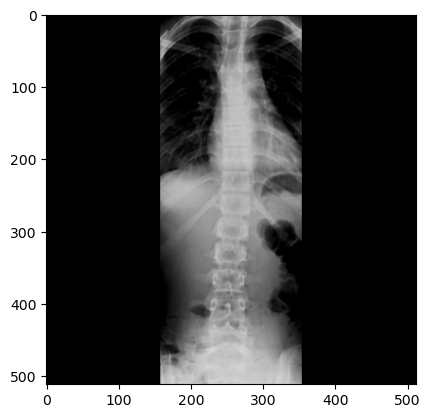

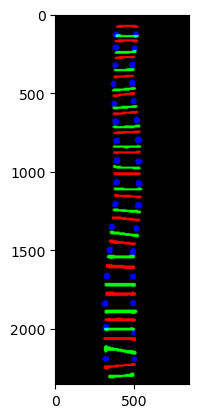

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-241 C AP.jpg
Ground Truth Cobb angles [30.367, 18.7, 1.9574]
Infered Cobb angles [30.078457366733385, 15.371751825515293, 15.294077378392073]
CMAE :  5.646278203118784
SMAPE :  0.1297940307775803


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


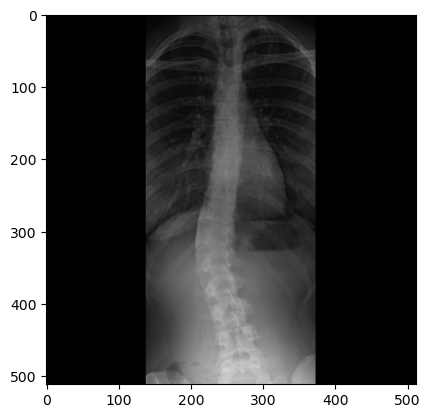

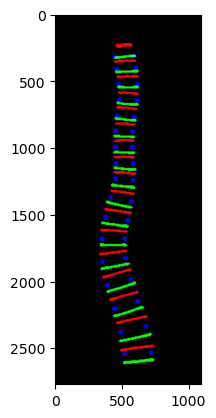

[ WARN:0@3585.076] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-211 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3585.083] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-211 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3585.190] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-211 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-211 B AP.jpg
Ground Truth Cobb angles [34.434, 18.646, 0.89346]
Infered Cobb angles [33.212136018728245, 16.362599111171473, 11.579374155173753]
CMAE :  4.727791826071768
SMAPE :  0.10592240282353553


[ WARN:0@3598.692] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-211 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3598.706] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-211 B AP.jpg'): can't open/read file: check file path/integrity


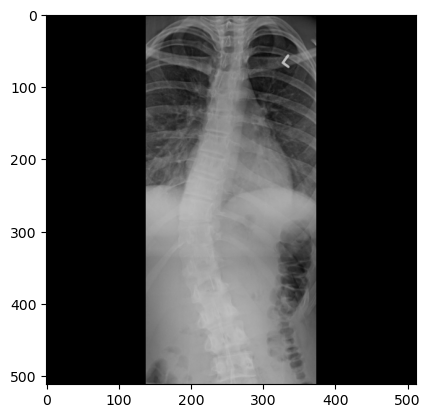

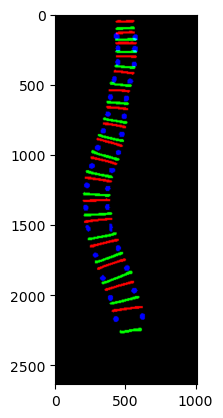

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-243 A AP.jpg
Ground Truth Cobb angles [58.791, 25.708, 30.058]
Infered Cobb angles [52.57290186931358, 25.42158958185308, 26.11910306688049]
CMAE :  3.4813385094353015
SMAPE :  0.04396850314646951


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


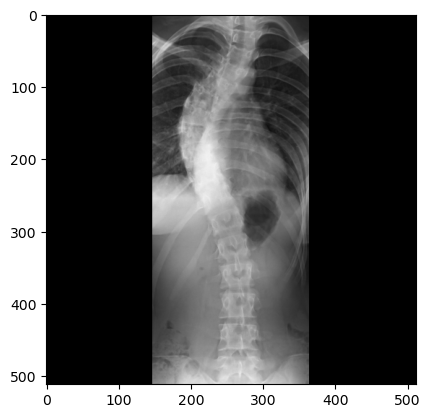

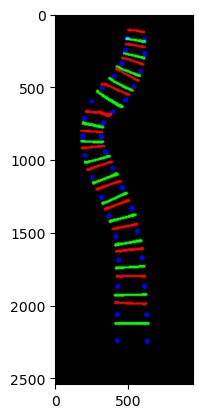

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-243 B AP.jpg
Ground Truth Cobb angles [60.008, 21.901, 28.064]
Infered Cobb angles [64.92782573159383, 26.145389114134126, 29.308310185998177]
CMAE :  3.4696353418626793
SMAPE :  0.04176707296249341


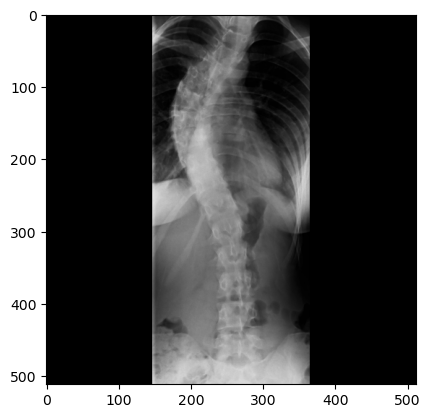

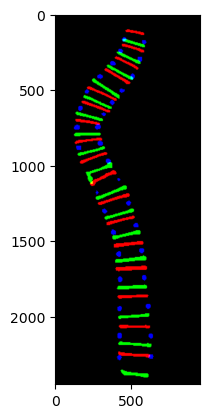

[ WARN:0@3624.373] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-228 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3624.393] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-228 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3624.526] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-228 C AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-228 C AP.jpg
Ground Truth Cobb angles [42.387, 20.258, 0.68813]
Infered Cobb angles [44.77809919776054, 24.638002943099192, 0.16905430476828454]
CMAE :  2.4300519060124204
SMAPE :  0.04803506277999636


[ WARN:0@3637.065] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-228 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3637.078] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-228 C AP.jpg'): can't open/read file: check file path/integrity


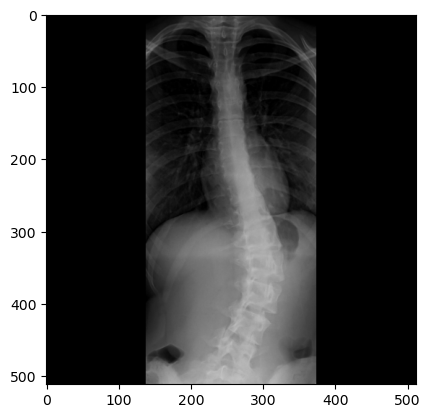

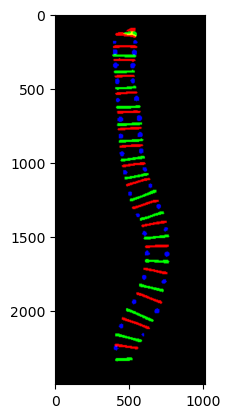

[ WARN:0@3637.589] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-215 E AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3637.595] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-215 E AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3637.680] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-215 E AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-215 E AP.jpg
Ground Truth Cobb angles [19.034, 18.39, 8.5858]
Infered Cobb angles [17.740239262102723, 17.162800949463254, 8.913980720949361]
CMAE :  0.9497165156869503
SMAPE :  0.026216741778294732


[ WARN:0@3647.941] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-215 E AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3647.953] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-215 E AP.jpg'): can't open/read file: check file path/integrity


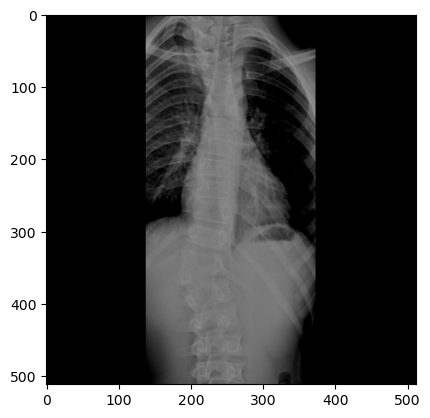

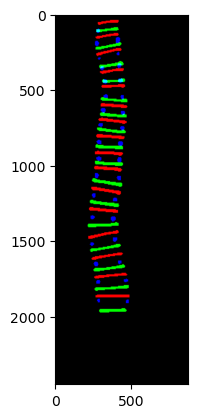

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


197.0
2340.0
sunhl-1th-28-Feb-2017-244 B AP.jpg
Ground Truth Cobb angles [40.022, 14.956, 29.095]
Infered Cobb angles [41.743115399839596, 17.826738809126294, 26.58567576236478]
CMAE :  2.3670618321647914
SMAPE :  0.03755685601040309


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


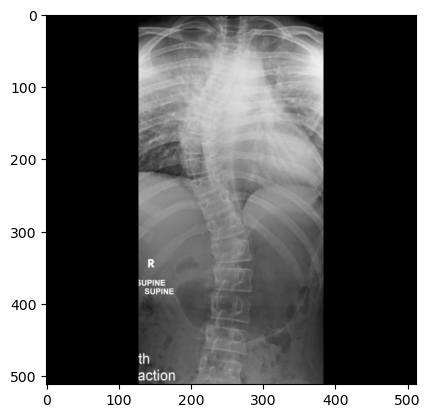

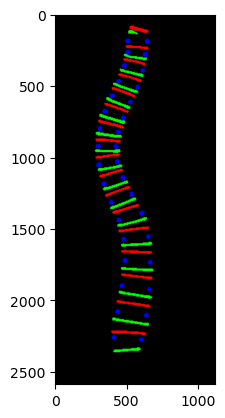

[ WARN:0@3666.475] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-214 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3666.481] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-214 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3666.582] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-214 C AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-214 C AP.jpg
Ground Truth Cobb angles [55.832, 7.2417, 14.39]
Infered Cobb angles [52.711875047338886, 13.568177360660039, 16.95043104988967]
CMAE :  4.002194307329685
SMAPE :  0.06687525504766571


[ WARN:0@3679.923] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-214 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3679.936] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-214 C AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


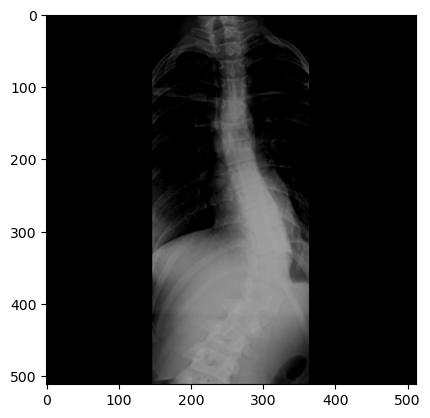

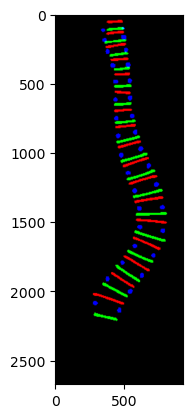

[ WARN:0@3680.428] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-217 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3680.434] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-217 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3680.542] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-217 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-217 A AP.jpg
Ground Truth Cobb angles [45.045, 15.316, 39.897]
Infered Cobb angles [44.79814868309954, 14.680906720788265, 37.658553807760626]
CMAE :  1.0401107134351988
SMAPE :  0.014429875398276237


[ WARN:0@3694.863] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-217 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3694.876] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-217 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


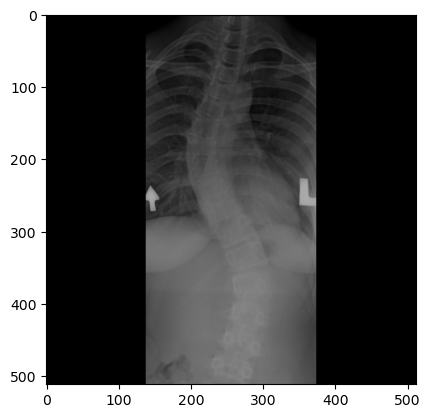

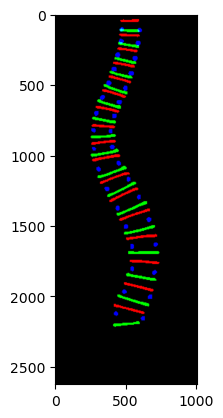

[ WARN:0@3695.405] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-218 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3695.411] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-218 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3695.506] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-218 C AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-218 C AP.jpg
Ground Truth Cobb angles [75.32, 16.282, 43.677]
Infered Cobb angles [61.057548434488886, 15.975898261652592, 36.84780899293725]
CMAE :  7.131828949671094
SMAPE :  0.07983940655877679


[ WARN:0@3707.491] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-218 C AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3707.504] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-218 C AP.jpg'): can't open/read file: check file path/integrity


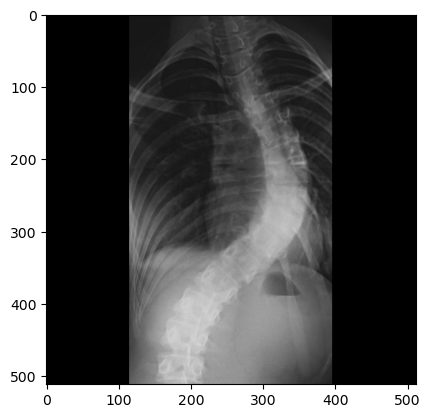

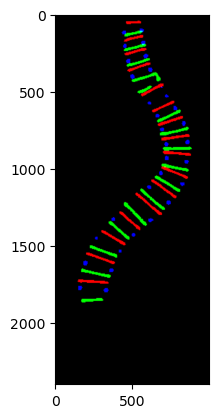

[ WARN:0@3708.015] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-219 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3708.020] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-219 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3708.102] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-219 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-219 B AP.jpg
Ground Truth Cobb angles [42.611, 17.282, 13.136]
Infered Cobb angles [36.683152008592124, 12.5048222701657, 19.77963343482418]
CMAE :  5.782892756735827
SMAPE :  0.10785870650556365


[ WARN:0@3719.719] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-219 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3719.731] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-219 B AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


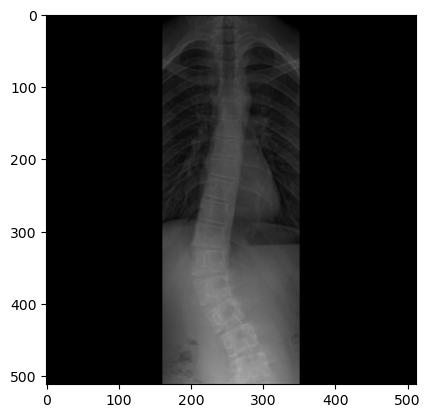

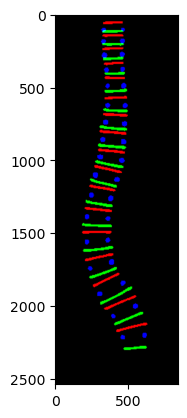

[ WARN:0@3720.194] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-220 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3720.201] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-220 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3720.300] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-220 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-220 A AP.jpg
Ground Truth Cobb angles [68.203, 27.656, 33.216]
Infered Cobb angles [62.85960115303643, 23.112156498139104, 32.38693233808808]
CMAE :  3.572343147347915
SMAPE :  0.0402440265217665


[ WARN:0@3732.308] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-220 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3732.322] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-220 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


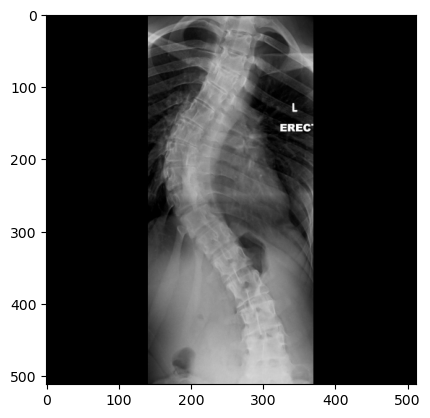

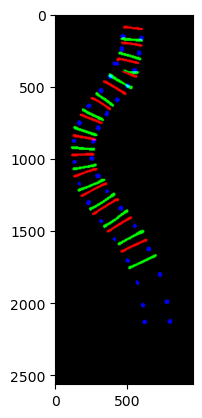

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-291 O AP.jpg
Ground Truth Cobb angles [53.845, 32.721, 6.4581]
Infered Cobb angles [45.28531624499479, 25.37371463409415, 8.43207925425047]
CMAE :  5.961046453993761
SMAPE :  0.09363480365808956


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


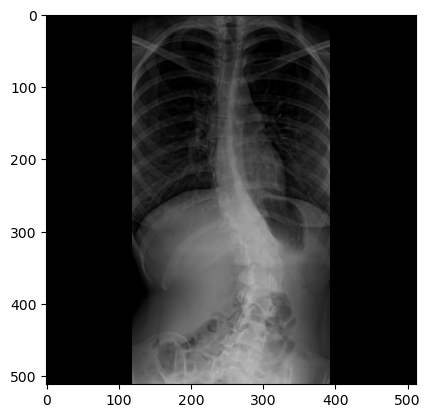

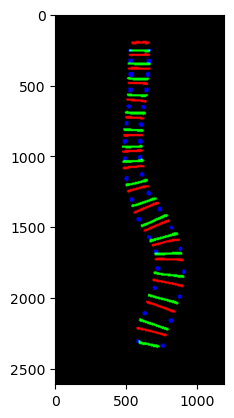

[ WARN:0@3751.344] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-195 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3751.351] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-195 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3751.456] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-195 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-09-Jan-2017-195 B AP.jpg
Ground Truth Cobb angles [20.69, 12.281, 12.72]
Infered Cobb angles [20.96208312380368, 11.74001265693699, 14.161877205463846]
CMAE :  0.7516456837871043
SMAPE :  0.020241077220459373


[ WARN:0@3765.349] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-195 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3765.363] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-09-Jan-2017-195 B AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


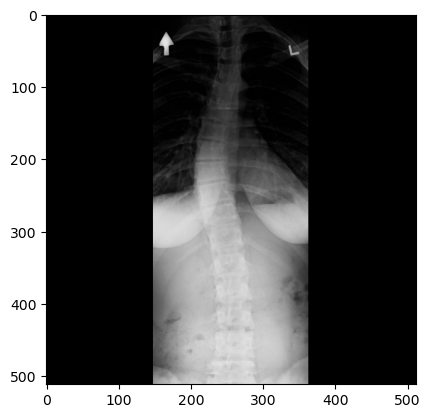

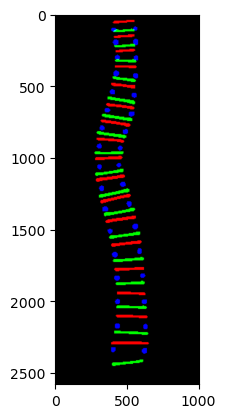

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-292 B AP.jpg
Ground Truth Cobb angles [43.718, 31.776, 28.124]
Infered Cobb angles [39.208082351488805, 18.650390251057715, 21.8137811061878]
CMAE :  7.980397335021737
SMAPE :  0.11846130821565541


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


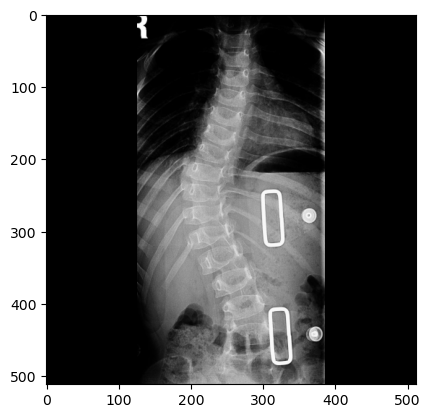

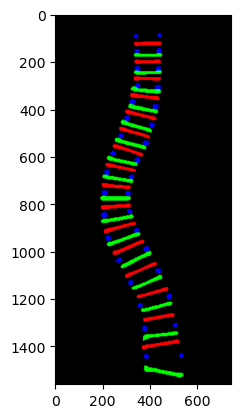

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-293 A AP.jpg
Ground Truth Cobb angles [28.278, 22.203, 20.417]
Infered Cobb angles [26.009785951333825, 15.144484871029062, 15.868270189358803]
CMAE :  4.625130733609109
SMAPE :  0.0945387328768188


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


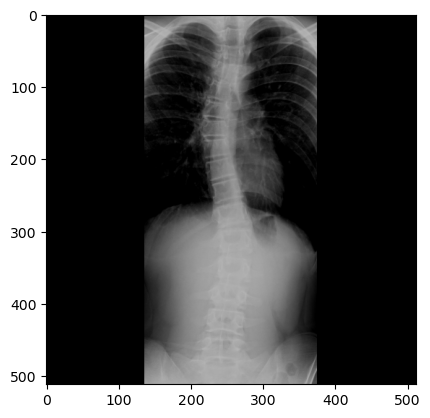

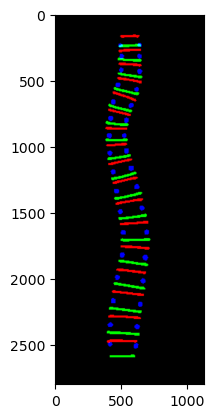

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-293 B AP.jpg
Ground Truth Cobb angles [26.258, 13.556, 22.831]
Infered Cobb angles [23.275363622719198, 13.582793456703586, 12.106567144404226]
CMAE :  4.5756832690633695
SMAPE :  0.10527317546346299


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


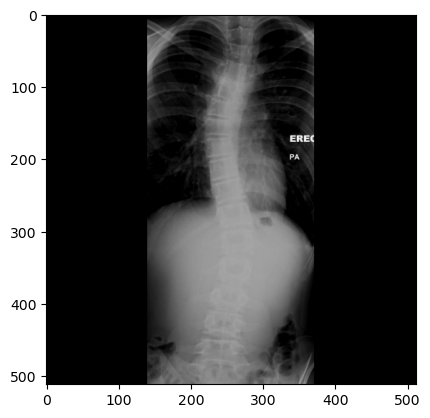

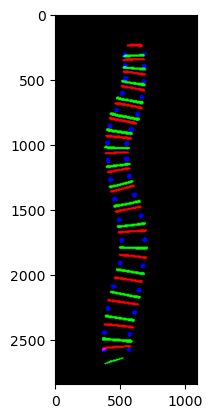

[ WARN:0@3809.979] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-224 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3809.985] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-224 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3810.080] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-224 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-224 A AP.jpg
Ground Truth Cobb angles [13.784, 0.0, 2.3366]
Infered Cobb angles [9.635723927826504, 2.2972172769917245, 2.0486838480949836]
CMAE :  2.244479811672049
SMAPE :  0.13755187997316012


[ WARN:0@3823.881] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-224 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3823.894] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-224 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


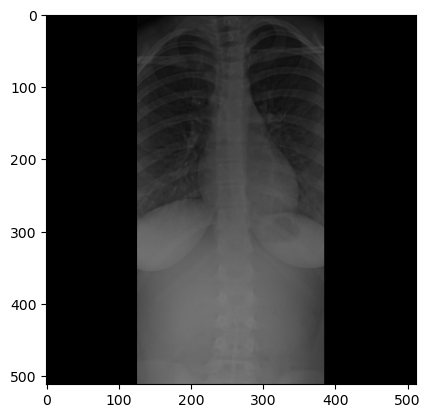

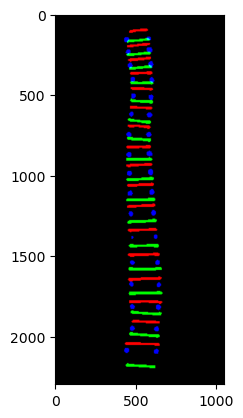

[ WARN:0@3824.386] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-227 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3824.391] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-227 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3824.456] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-227 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-227 A AP.jpg
Ground Truth Cobb angles [23.247, 8.9681, 9.8522]
Infered Cobb angles [21.483541594762116, 9.407771510948745, 3.860339270598676]
CMAE :  2.731296007303707
SMAPE :  0.08566027412149237


[ WARN:0@3833.942] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-227 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3833.954] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-227 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


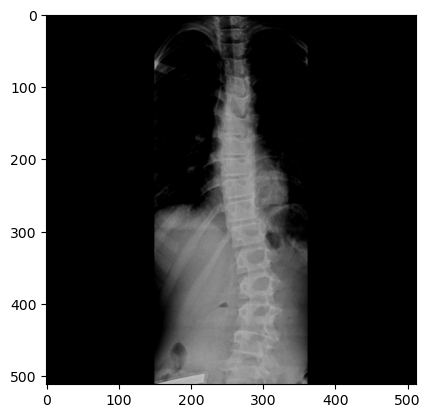

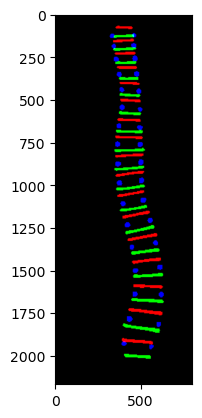

[ WARN:0@3834.364] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-227 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3834.370] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-227 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3834.456] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-227 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-227 B AP.jpg
Ground Truth Cobb angles [24.381, 4.7959, 21.238]
Infered Cobb angles [20.71127284664325, 6.075083717579025, 9.980304073096367]
CMAE :  5.400074382502329
SMAPE :  0.1528476481603699


[ WARN:0@3845.680] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-227 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3845.693] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-227 B AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


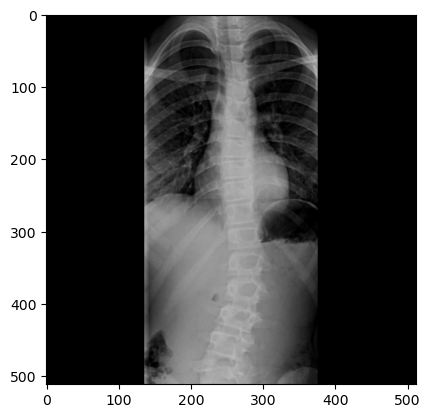

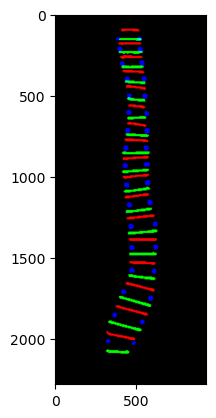

[ WARN:0@3846.206] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-228 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3846.212] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-228 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3846.305] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-228 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-228 B AP.jpg
Ground Truth Cobb angles [39.992, 15.519, 24.697]
Infered Cobb angles [38.58959070204856, 12.938776037557707, 20.887423370162654]
CMAE :  2.5974020332060475
SMAPE :  0.04544268873605801


[ WARN:0@3857.963] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-228 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3857.976] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-228 B AP.jpg'): can't open/read file: check file path/integrity


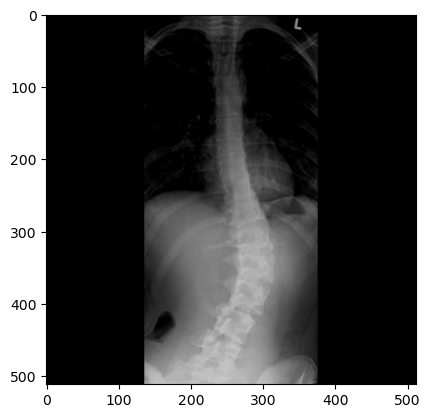

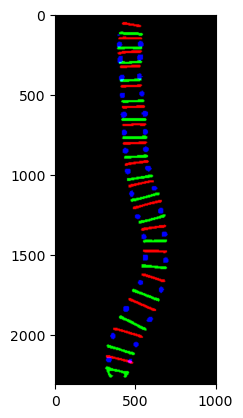

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-295 A AP.jpg
Ground Truth Cobb angles [28.399, 26.692, 16.704]
Infered Cobb angles [25.728381678960233, 13.192918505933777, 6.3469928423405495]
CMAE :  8.84445114323647
SMAPE :  0.19517438695412512


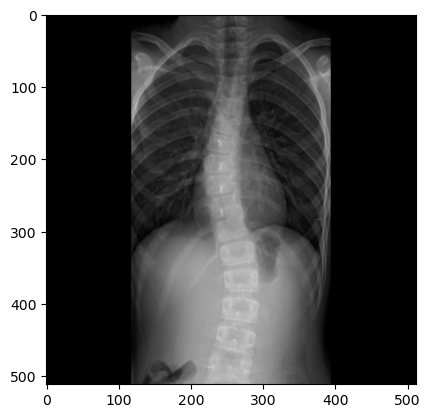

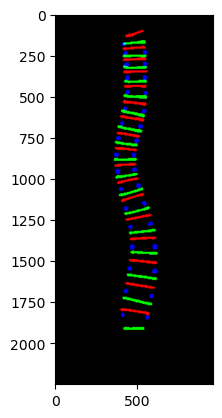

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-295 B AP.jpg
Ground Truth Cobb angles [19.321, 0.041317, 16.482]
Infered Cobb angles [17.754116832976216, 1.8047994290058156, 11.54437518899476]
CMAE :  2.755866046008895
SMAPE :  0.09636670940704686


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


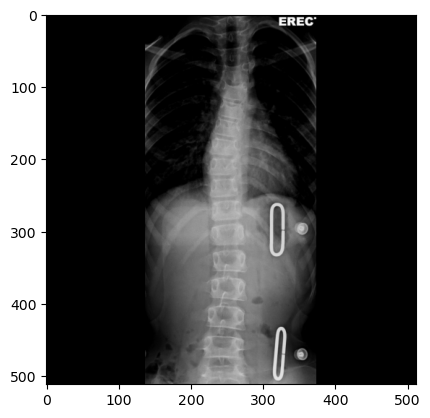

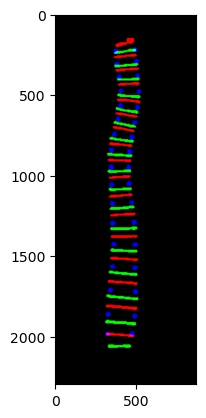

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-295 C AP.jpg
Ground Truth Cobb angles [19.953, 17.483, 19.66]
Infered Cobb angles [19.84155409402912, 13.518458535182477, 10.231787194194261]
CMAE :  4.500809565773921
SMAPE :  0.11297054458363529


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


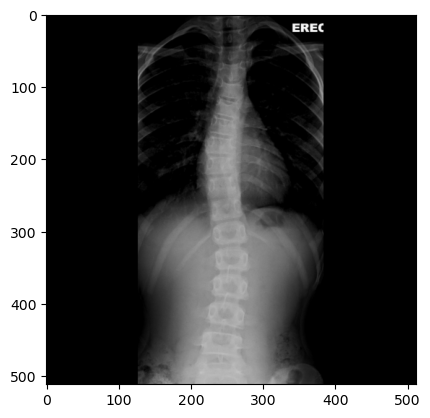

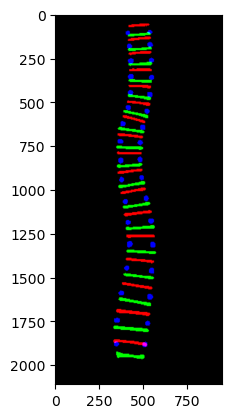

[ WARN:0@3893.149] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-230 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3893.155] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-230 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3893.254] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-230 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-230 A AP.jpg
Ground Truth Cobb angles [26.187, 21.206, 5.1874]
Infered Cobb angles [25.05575951970464, 19.4166453390645, 9.255349187894415]
CMAE :  2.3294576391553927
SMAPE :  0.055837905079126095


[ WARN:0@3906.793] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-230 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3906.806] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-230 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


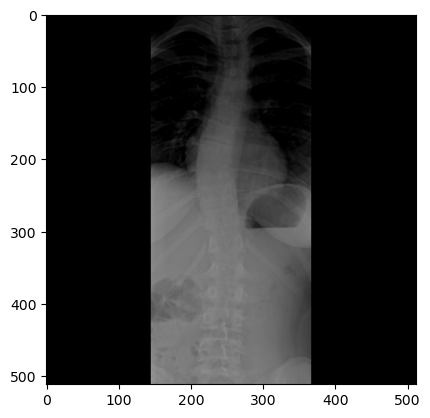

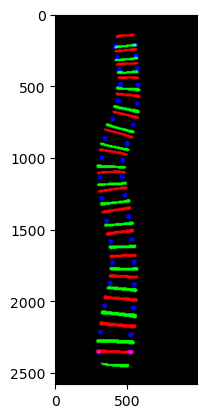

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-295 E AP.jpg
Ground Truth Cobb angles [20.49, 20.438, 15.767]
Infered Cobb angles [23.99848333850202, 15.162619448776194, 13.619657247421824]
CMAE :  3.643718778692064
SMAPE :  0.08518355525445763


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


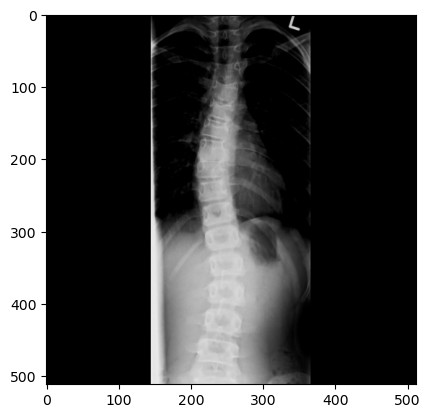

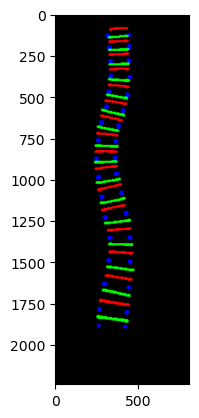

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-295 F AP.jpg
Ground Truth Cobb angles [25.651, 18.789, 18.306]
Infered Cobb angles [23.40587186866332, 13.456801436864904, 13.044432088219017]
CMAE :  4.279738317341409
SMAPE :  0.09763220362111684


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


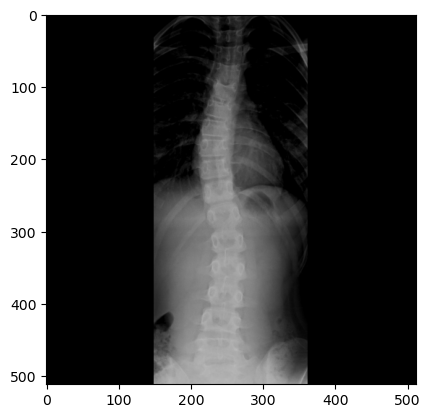

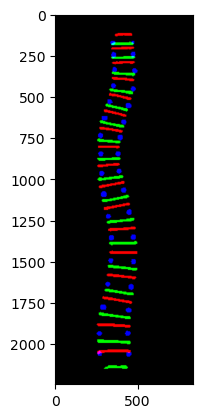

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-295 G AP.jpg
Ground Truth Cobb angles [22.152, 17.919, 19.668]
Infered Cobb angles [22.209133083243326, 17.73550190284115, 13.784210274692443]
CMAE :  2.0407538229645317
SMAPE :  0.04628583127378003


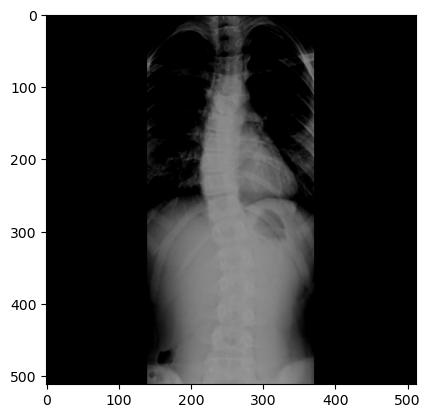

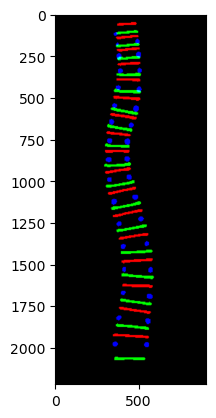

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


228.0
3391.0
sunhl-1th-28-Feb-2017-295 H AP.jpg
Ground Truth Cobb angles [28.508, 23.224, 21.83]
Infered Cobb angles [22.58373681424685, 13.316224592390736, 10.159851782259516]
CMAE :  9.167700904059195
SMAPE :  0.19861280341042142


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


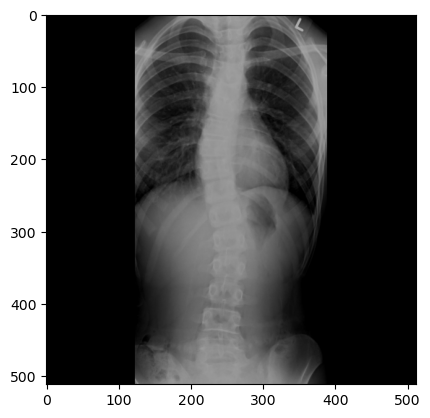

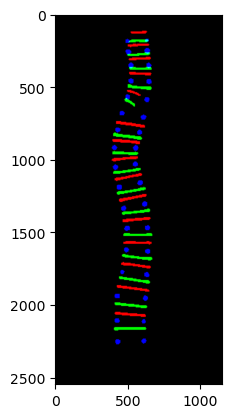

[ WARN:0@3954.685] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-231 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3954.696] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-231 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3954.801] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-231 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-231 A AP.jpg
Ground Truth Cobb angles [37.639, 29.185, 30.424]
Infered Cobb angles [34.95845256273674, 22.071876954111023, 18.176824261164544]
CMAE :  7.346676813460066
SMAPE :  0.11521329640343615


[ WARN:0@3969.252] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-231 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@3969.266] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-231 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


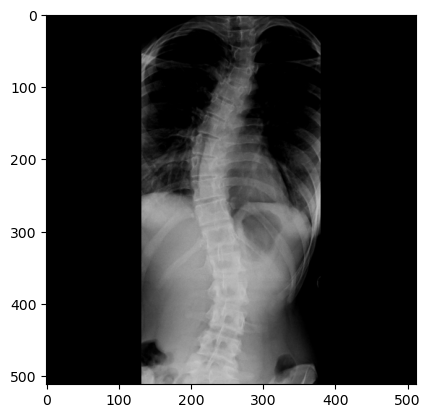

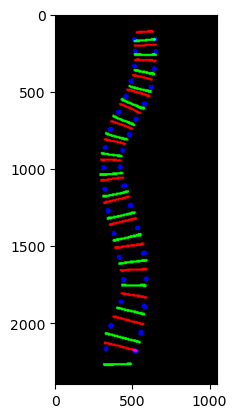

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-295 J AP.jpg
Ground Truth Cobb angles [33.537, 27.694, 26.601]
Infered Cobb angles [31.638902471496195, 21.40190976396708, 17.989844601596978]
CMAE :  5.600839477180543
SMAPE :  0.0945424228427248


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


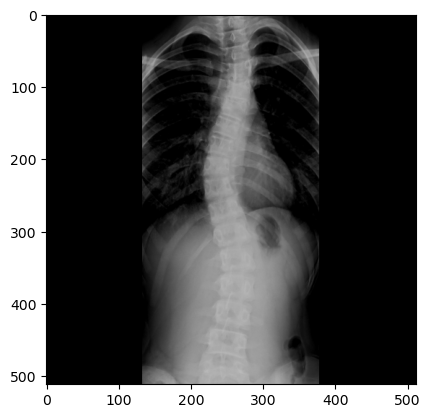

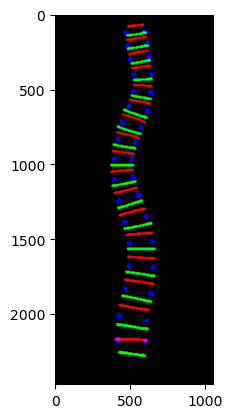

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-295 K AP.jpg
Ground Truth Cobb angles [37.489, 26.649, 29.495]
Infered Cobb angles [34.482862517757496, 20.132061856353655, 19.288318333334704]
CMAE :  6.576546475596634
SMAPE :  0.10585440220060835


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


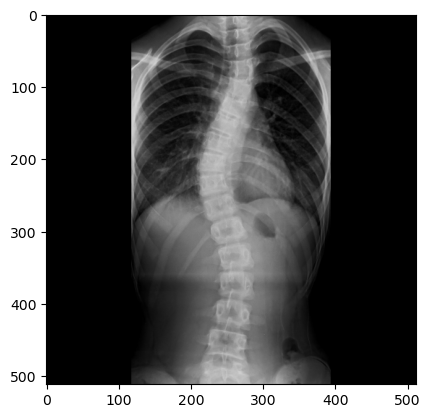

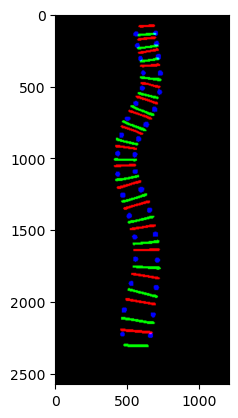

[ WARN:0@4004.600] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-231 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@4004.607] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-231 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@4004.713] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-231 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-231 B AP.jpg
Ground Truth Cobb angles [36.373, 27.745, 28.597]
Infered Cobb angles [34.552202134661776, 21.095743523329137, 20.163300669974628]
CMAE :  5.635134976448168
SMAPE :  0.09021310899859901


[ WARN:0@4020.357] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-231 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@4020.371] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-231 B AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


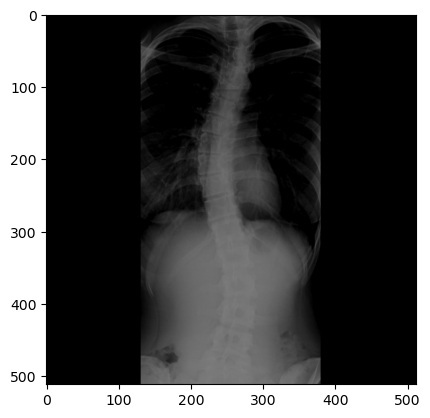

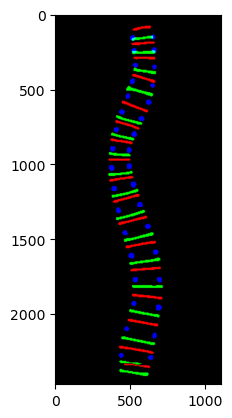

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-297 A AP.jpg
Ground Truth Cobb angles [18.918, 2.1909, 7.7505]
Infered Cobb angles [19.321100675823356, 5.399126089683432, 5.23009807089997]
CMAE :  2.04395578798187
SMAPE :  0.07895680509479172


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


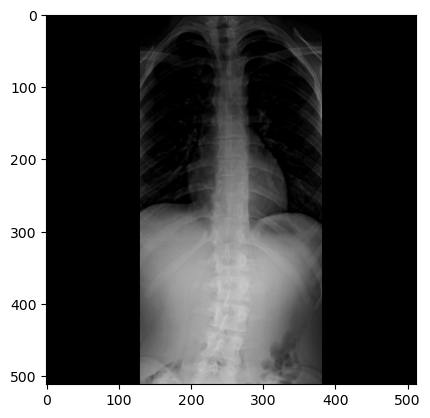

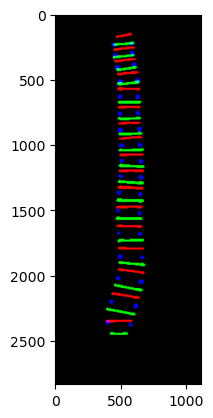

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-298 A AP.jpg
Ground Truth Cobb angles [19.31, 18.305, 9.9513]
Infered Cobb angles [19.057214257229056, 9.19626910251814, 10.054212728970963]
CMAE :  3.152127178590264
SMAPE :  0.09037536626237425


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


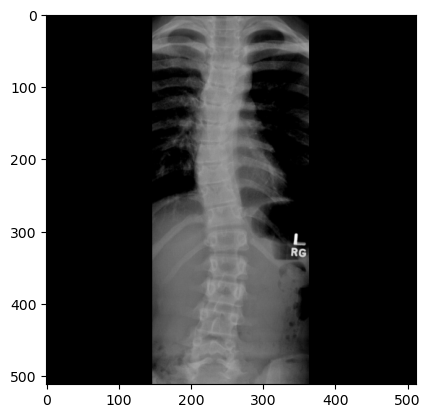

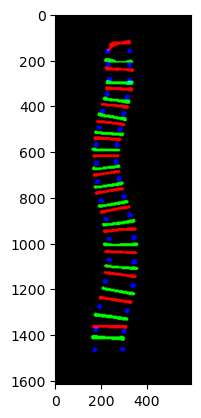

[ WARN:0@4044.373] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-232 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@4044.388] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-232 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@4044.483] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-232 A AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

sunhl-1th-10-Jan-2017-232 A AP.jpg
Ground Truth Cobb angles [28.177, 11.339, 12.134]
Infered Cobb angles [27.969063827079957, 8.7295295638482, 13.175650383340505]
CMAE :  1.286334602177908
SMAPE :  0.032058944738509884


[ WARN:0@4053.943] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-232 A AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@4053.955] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-232 A AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


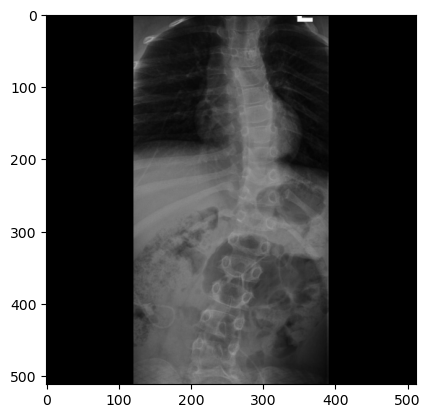

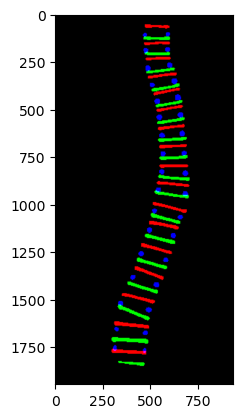

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-300 A AP.jpg
Ground Truth Cobb angles [41.637, 17.304, 22.73]
Infered Cobb angles [34.75453319313705, 14.71087981550679, 20.522912264446674]
CMAE :  3.893891709221633
SMAPE :  0.06851651740987123


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


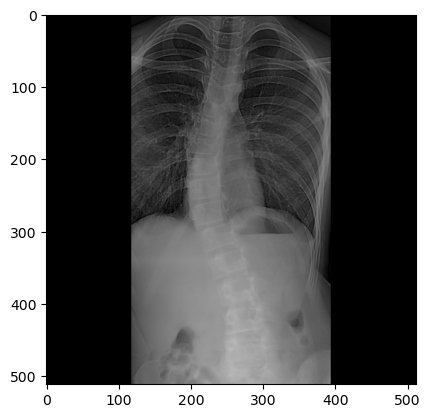

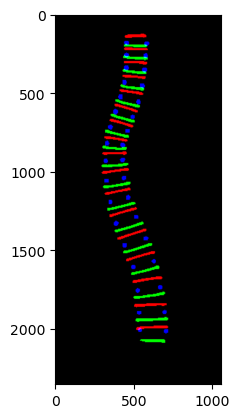

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-300 B AP.jpg
Ground Truth Cobb angles [24.306, 15.078, 5.7366]
Infered Cobb angles [25.989156893192813, 17.977758930186265, 9.606185514604599]
CMAE :  2.8175054304687
SMAPE :  0.0719097082644349


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


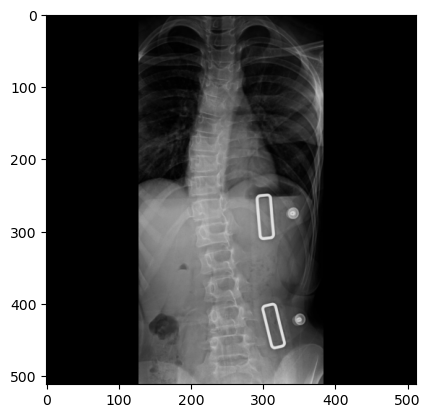

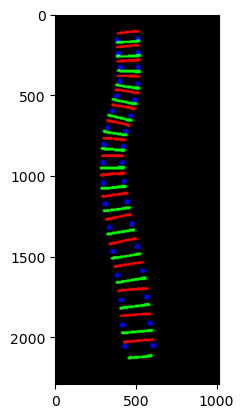

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-300 C AP.jpg
Ground Truth Cobb angles [19.758, 13.773, 5.2297]
Infered Cobb angles [22.06017394023081, 15.209188303161532, 9.045231470963229]
CMAE :  2.5179491916321273
SMAPE :  0.07268611636986728


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


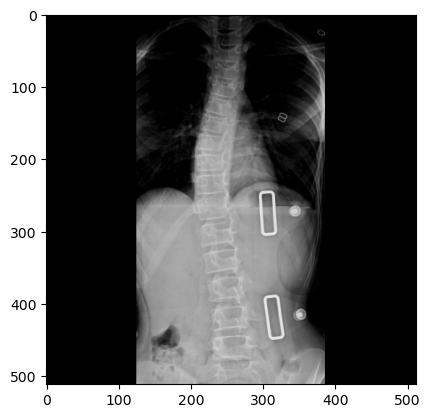

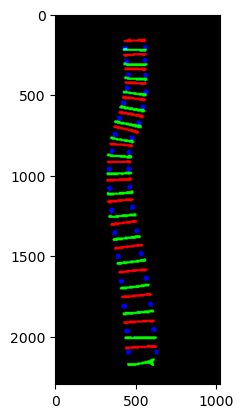

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-300 D AP.jpg
Ground Truth Cobb angles [39.925, 18.158, 18.518]
Infered Cobb angles [37.04639771501702, 17.584462648726994, 18.4494149246494]
CMAE :  1.173517499389965
SMAPE :  0.02089068621053054


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


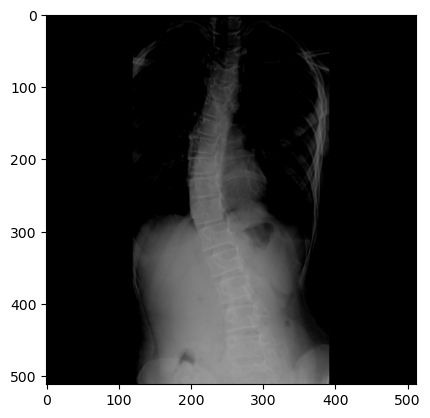

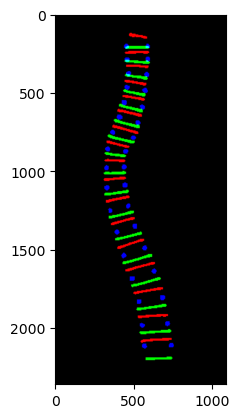

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-300 E AP.jpg
Ground Truth Cobb angles [38.148, 21.958, 16.204]
Infered Cobb angles [37.243559068916724, 20.046536986837122, 19.25942924652332]
CMAE :  1.957108383900152
SMAPE :  0.03419349255684628


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


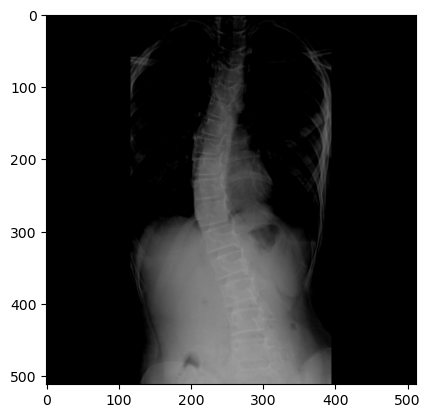

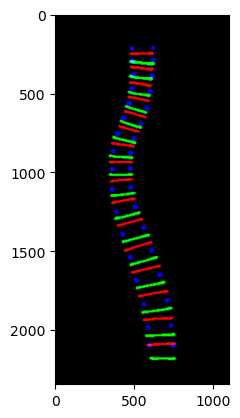

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-300 F AP.jpg
Ground Truth Cobb angles [33.68, 24.611, 14.39]
Infered Cobb angles [31.546485851262638, 18.45924197836966, 12.49618755221664]
CMAE :  3.3927636186843686
SMAPE :  0.06608401807760382


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


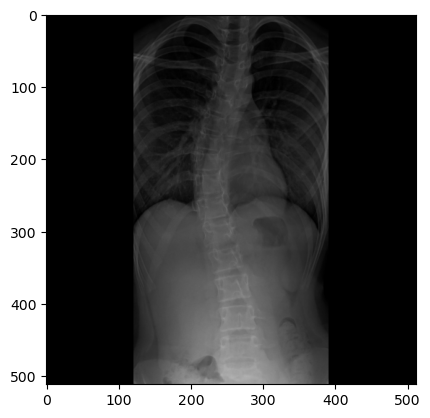

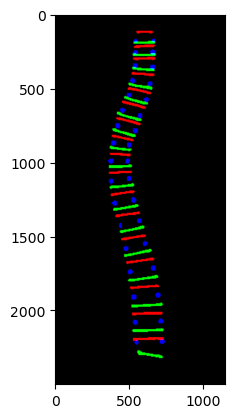

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-300 G AP.jpg
Ground Truth Cobb angles [23.917, 22.097, 10.506]
Infered Cobb angles [23.73838386213379, 16.72885839387431, 13.6460780096457]
CMAE :  2.8956953391501807
SMAPE :  0.06708868392048306


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


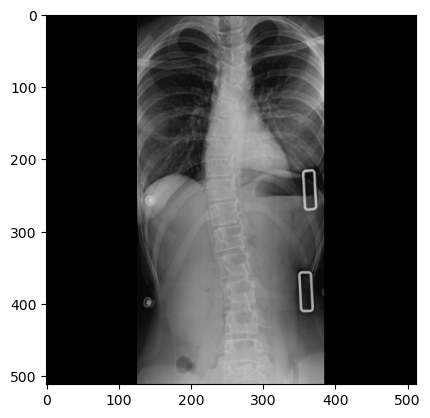

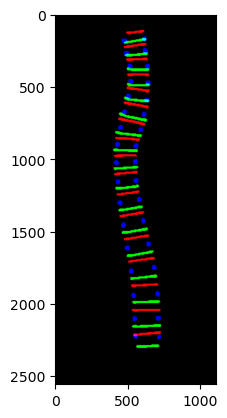

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-300 H AP.jpg
Ground Truth Cobb angles [30.09, 18.005, 18.032]
Infered Cobb angles [32.043012928610544, 20.27897774767905, 13.720195809632925]
CMAE :  2.8462269153239506
SMAPE :  0.05654129236236309


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


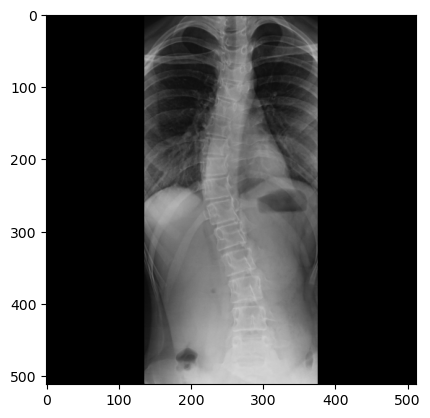

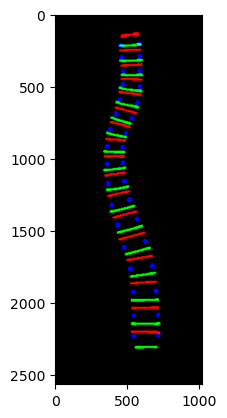

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-300 I AP.jpg
Ground Truth Cobb angles [47.905, 20.724, 30.632]
Infered Cobb angles [45.04814543113099, 19.16571593516472, 28.534806035006127]
CMAE :  2.170775962996641
SMAPE :  0.03088474146908579


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


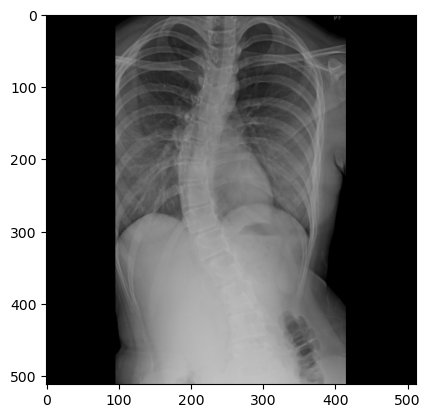

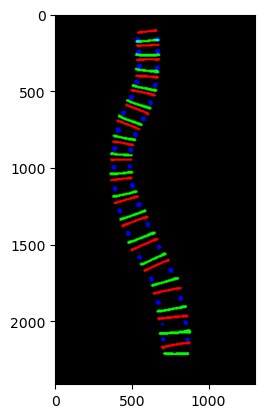

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-300 J AP.jpg
Ground Truth Cobb angles [42.404, 22.014, 19.329]
Infered Cobb angles [45.33553027696605, 19.995610678424942, 24.520868651474064]
CMAE :  3.380539819598838
SMAPE :  0.05269869495867103


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


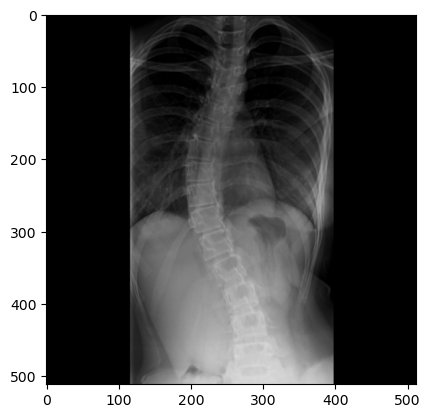

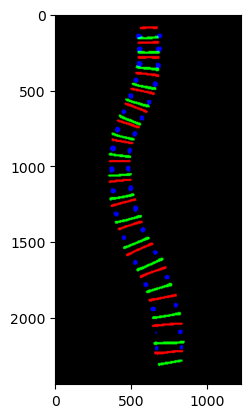

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-300 K AP.jpg
Ground Truth Cobb angles [43.089, 19.373, 22.701]
Infered Cobb angles [42.15435871090948, 15.706903445137627, 25.40559492303176]
CMAE :  2.435136196687795
SMAPE :  0.039007665871745104


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


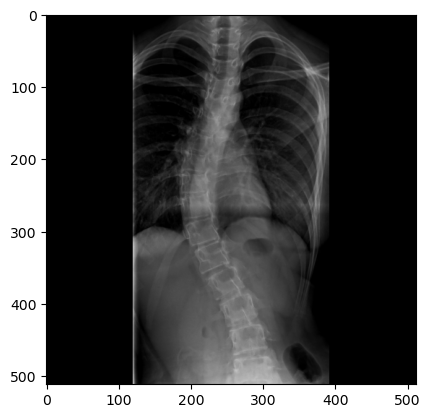

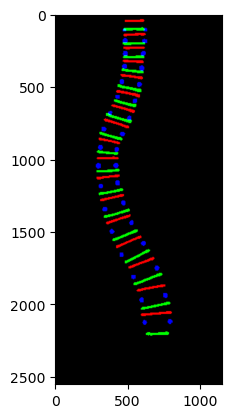

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-307 A AP.jpg
Ground Truth Cobb angles [11.13, 1.3697, 4.4634]
Infered Cobb angles [9.70320599630207, 1.7708863450071135, 3.3274144906168837]
CMAE :  0.9879905541314121
SMAPE :  0.0585600096266585


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


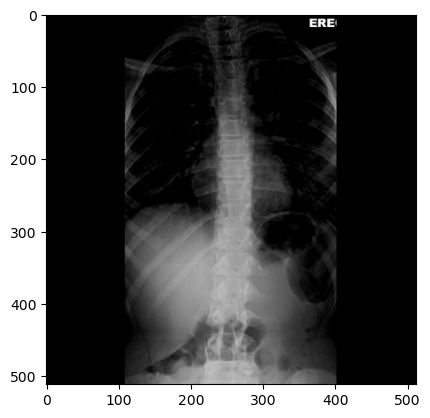

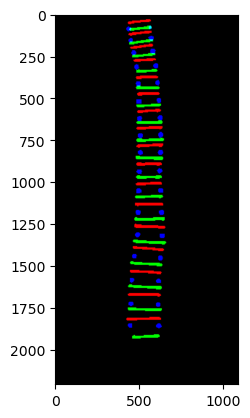

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-307 B AP.jpg
Ground Truth Cobb angles [8.0308, 5.5956, 5.0677]
Infered Cobb angles [10.266680144847964, 4.656601643076194, 7.722458509079038]
CMAE :  1.9432229547432922
SMAPE :  0.09685488436674049


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


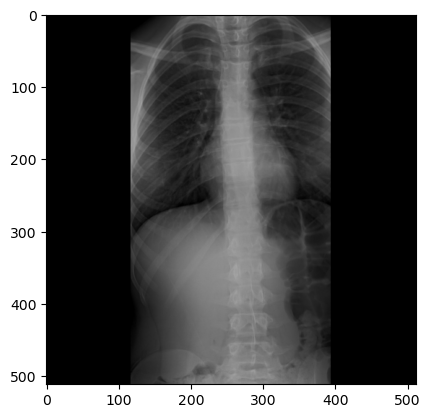

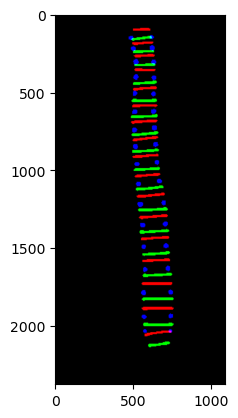

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-308 A AP.jpg
Ground Truth Cobb angles [68.979, 31.19, 37.149]
Infered Cobb angles [65.51681182644037, 29.46602507333897, 39.73225481262453]
CMAE :  2.58980571970971
SMAPE :  0.026709801963238827


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


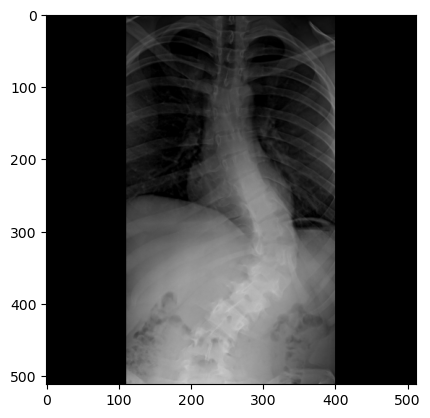

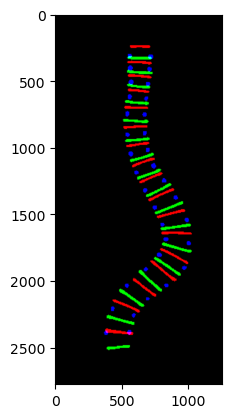

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-309 A AP.jpg
Ground Truth Cobb angles [43.788, 36.18, 27.493]
Infered Cobb angles [44.15991990762078, 30.593152278367857, 20.5709598245012]
CMAE :  4.294280010393871
SMAPE :  0.0581173179012205


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


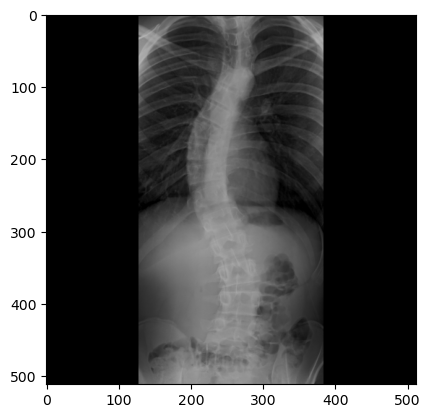

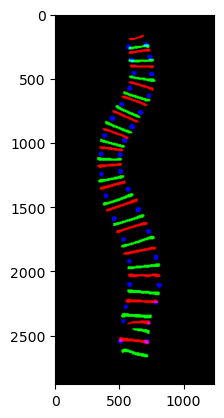

/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sunhl-1th-28-Feb-2017-309 B AP.jpg
Ground Truth Cobb angles [46.747, 40.562, 31.747]
Infered Cobb angles [46.453387488077084, 32.15715298925751, 22.11212350457556]
CMAE :  6.11350390414152
SMAPE :  0.07682802991828741


/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


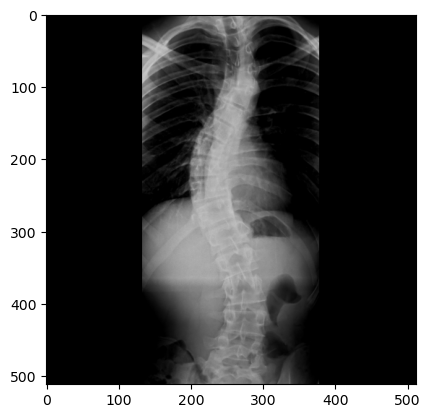

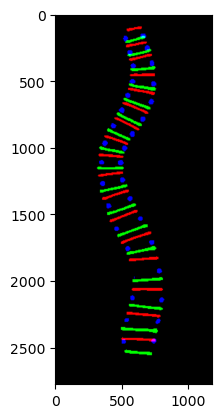

[ WARN:0@4321.501] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-232 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@4321.505] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-232 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@4321.572] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-232 B AP.jpg'): can't open/read file: check file path/integrity
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/airdp/anaconda3/envs/torch2/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars

196.0
3172.0
sunhl-1th-10-Jan-2017-232 B AP.jpg
Ground Truth Cobb angles [30.626, 15.258, 10.358]
Infered Cobb angles [25.978181574608602, 12.760168462907846, 10.817532595895749]
CMAE :  2.535052561696932
SMAPE :  0.06101354866611676


[ WARN:0@4330.378] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-232 B AP.jpg'): can't open/read file: check file path/integrity
[ WARN:0@4330.389] global loadsave.cpp:241 findDecoder imread_('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/sunhl-1th-10-Jan-2017-232 B AP.jpg'): can't open/read file: check file path/integrity
/tmp/ipykernel_3364444/512454245.py:28: RuntimeWarning: invalid value encountered in divide
  x = dot_v/(mod_v.reshape(-1, 1) * mod_v)
/tmp/ipykernel_3364444/2511952617.py:14: RuntimeWarning: invalid value encountered in double_scalars
  ll[i] = (p[i,1] - p[num-1,1]) / (p[0,1] - p[num-1,1]) - (p[i,0] - p[num-1,0]) / (p[0,0] - p[num-1,0])


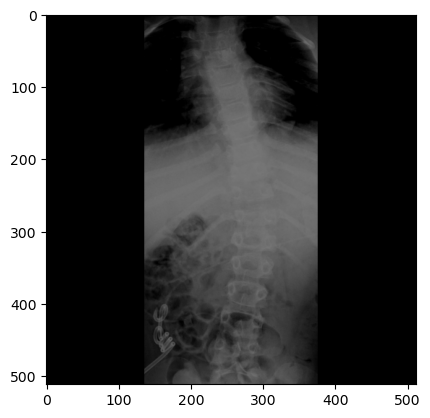

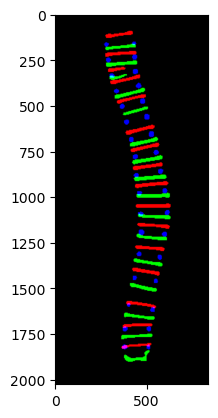

In [37]:
Cs = []
Ss = []
ID_S = []
Gts = []
Preds = []
Failed = []
for path in paths:
    ID = path.split('/')[-1]
    try:
        img = cv2.imread('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/'+ID)
        CCC = img.shape
    except:
        img = cv2.imread('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/training/'+ID)
        CCC = img.shape

    #     IMG,R_sizer = fix_dims(img,Center=256,F_mas=False,R_Resizer = True)
    #     inp = IMG[:,:,1].copy()
    #     inp = cv2.equalizeHist(inp)
    #     Image = np.zeros((1,1,512,512))
    #     Image[0,0,:,:] = inp
    #     z = model0_0.predict(Image/255)
    #     z[z>.01]=1
    #     z[z<=.01]=0

    #     mask2 = z[0,:,:,:].copy()
    #     mask2 = np.moveaxis(mask2,0,-1)
    #     mask2 = make_label_1(mask2)
    #     mask6 = mask2.copy()
    #     mask6 = mask6[:,R_sizer[0]:R_sizer[1]]
    #     mask6 = cv2.resize(mask6,(R_sizer[3],R_sizer[2]),interpolation = cv2.INTER_NEAREST)
    #         img = dcm.pixel_array
    U_L_Bound = get_Spine_mask_GT(ID)[:,:,0]/255
    mask6 = U_L_Bound

    A,B = np.where(mask6>0)
    Sh1 = mask6.shape[0]
    Sh2 = mask6.shape[1]
    A1 = np.min(A)
    A2 = np.max(A)
    #     A1 = A1+int(0.2*(A2-A1))
    if((A2-A1)<mask6.shape[1]):
        B1,B2 = Get_CP(A1,A2,0,Sh2)
        print(A1,A2,Sh1,Sh2,B1,B2)
    else:
        B1=0
        B2=Sh2


    #     try:
    #     img = bpdfhe(img)
    try:
        img = cv2.imread('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/test/'+ID)
        CCC = img.shape
    except:
        img = cv2.imread('/home/airdp/abdullah/Spine_assesment/Public_Data/boostnet_labeldata/data/training/'+ID)
        CCC = img.shape
    img2 = img.copy()
    # img2 = ((img2/np.max(img2))*255).astype(np.uint8)
    img[:,:,0] = P_ENH(img[:,:,0])
    img[:,:,1] = img[:,:,0].copy()
    img[:,:,2] = img[:,:,0].copy()
    img = np.array(img)
    img = ((img/np.max(img))*255).astype(np.uint8)

    mask5G = np.moveaxis(np.array([mask6,mask6,mask6]),0,-1)
    mask5,R_sizer = fix_dims(mask5G[A1:A2,B1:B2,:],Center=256,F_mas=True,R_Resizer = True)
    mask5 = mask5[:,:,0]
    IMG2,R_sizer = fix_dims(img2[A1:A2,B1:B2,:],Center=256,F_mas=False,R_Resizer = True)
    IMG,R_sizer = fix_dims(img2[A1:A2,B1:B2,:],Center=256,F_mas=False,R_Resizer = True)
    mask4,R_sizer_T = fix_dims(mask5G[0:Sh1,0:Sh2,:],Center=256,F_mas=True,R_Resizer = True)
    mask4 = mask4[:,:,0]
    IMG3,R_sizer_T = fix_dims(img2[0:Sh1,0:Sh2,:],Center=256,F_mas=False,R_Resizer = True)
    #         T12_mask = get_T12_mask_2(IMG,R_sizer,A1,A2,B1,B2,img.shape)

    #     if(np.sum(T12_mask)==0):
    #         T12_mask = get_T12_mask_2(IMG2,R_sizer,A1,A2,B1,B2,img.shape)


    # predicting centriods
    inp = IMG2[:,:,0].copy()
    maskT = cv2.blur((mask5*255).astype(np.uint8),(20,50),0)
    maskT[maskT<=20] = 0
    maskT[maskT>20] = 1
    inp = maskT*inp
    inp = cv2.equalizeHist(inp)
    Image = np.zeros((1,1,512,512))
    Image[0,0,:,:] = inp
    z = model2.predict(Image/255)
    ZC = z.copy()
    z[z>.8]=1
    z[z<=.8]=0
    labelled_mask1, num_labels1 = label(z[0,0,:,:])
    labelled_mask2, num_labels2 = label(z[0,1,:,:])  
    if(num_labels1!=17 and num_labels2!=17):
        z = ZC.copy()
        z[z>.7]=1
        z[z<=.7]=0
    labelled_mask1, num_labels1 = label(z[0,0,:,:])
    labelled_mask2, num_labels2 = label(z[0,1,:,:])  
    if(num_labels1!=17 and num_labels2!=17):
        z = ZC.copy()
        z[z>.6]=1
        z[z<=.6]=0
    ZC = z.copy()
    ZC[0,1,:,:] = preprocess_C(ZC[0,1,:,:],R_sizer,A1,A2,B1,B2,img)
    ZC[0,0,:,:] = preprocess_C(ZC[0,0,:,:],R_sizer,A1,A2,B1,B2,img)
    mask2 = ZC[0,:,:,:].copy()
    mask2 = np.moveaxis(mask2,0,-1)
    mask33 = mask2.copy()
    labelled_maskC, num_labels_C = label(mask33)

    # predicting locators
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(16,16))
    inp = IMG3[:,:,2].copy()
    inp = clahe.apply(inp)
    inp = P_ENH(inp)
    # inp = IMG3[:,:,2]
    maskT = cv2.blur((mask4*255).astype(np.uint8),(20,50),0)
    maskT[maskT<=30] = 0
    maskT[maskT>30] = 1
    inp = maskT*inp
    Image = np.zeros((1,512,512,1))
    Image[0,:,:,0] = inp
    z = model1_1.predict(Image/255)
    z[z>.3]=1
    z[z<=.3]=0

    maskA = z[0,:,:,:].copy()

    flag = False
    for i in range(4):
        labelled_mask1, num_labels1 = label(z[0,:,:,i])
        if(num_labels1<15):
            flag=True
    if(flag):
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4,4))
        IMG3[:,:,2] = clahe.apply(IMG3[:,:,2])
        IMG3[:,:,2] = clahe.apply(IMG3[:,:,2])
        IMG3[:,:,2] = clahe.apply(IMG3[:,:,2])
        IMG3[:,:,2] = P_ENH(IMG3[:,:,2])
        inp = IMG3[:,:,2]
        maskT = cv2.blur((mask4*255).astype(np.uint8),(20,20),0)
        maskT[maskT<=30] = 0
        maskT[maskT>30] = 1
        inp = maskT*inp
        Image = np.zeros((1,512,512,1))
        Image[0,:,:,0] = inp
        z = model1_1.predict(Image/255)
        z[z>.2]=1
        z[z<=.2]=0
        maskA = z[0,:,:,:].copy()


    # z[0,:,:,0] = preprocess_Z(z[0,:,:,0],R_sizer_T,A1,A2,B1,B2)
    # z[0,:,:,1] = preprocess_Z(z[0,:,:,1],R_sizer_T,A1,A2,B1,B2)
    # z[0,:,:,2] = preprocess_Z(z[0,:,:,2],R_sizer_T,A1,A2,B1,B2)
    # z[0,:,:,3] = preprocess_Z(z[0,:,:,3],R_sizer_T,A1,A2,B1,B2)


    R_sizer = R_sizer_T
    A1=0
    A2 = Sh1
    B1 = 0
    B2 = Sh2

    Z = np.zeros((1,6,512,512))
    Z[0,0,:,:] = z[0,:,:,0]
    Z[0,1,:,:] = z[0,:,:,1]
    Z[0,2,:,:] = z[0,:,:,2]
    Z[0,3,:,:] = z[0,:,:,3]
    Z[0,4,:,:] = ZC[0,0,:,:]
    Z[0,5,:,:] = ZC[0,1,:,:]

    z1 = model1_2.predict(Z)
    z1[z1>.8]=1
    z1[z1<=.8]=0

    mask2 = z1[0,:,:,:].copy()
    mask2 = np.moveaxis(mask2,0,-1)

    mask2[:,:,2] = mask33[:,:,0]+mask33[:,:,1]
    mask2 = mask2[:,R_sizer[0]:R_sizer[1]]
    mask2 = cv2.resize(mask2,(R_sizer[3],R_sizer[2]),interpolation = cv2.INTER_NEAREST)
    mask2T = np.zeros(img.shape)
    mask2T[A1:A2,B1:B2,:] = mask2
    mask2 = mask2T

    Temp = np.zeros((512,512,3))
    Temp[:,:,0] = mask33[:,:,0]
    Temp[:,:,1] = mask33[:,:,1]
    Temp = Temp[:,R_sizer[0]:R_sizer[1]]
    Temp = cv2.resize(Temp,(R_sizer[3],R_sizer[2]),interpolation = cv2.INTER_NEAREST)
    TempT = np.zeros(img.shape)
    TempT[A1:A2,B1:B2,:] = Temp


    Z = mask2[:,:,2]

    labelled_mask1, num_labels1 = label(mask2[:,:,0])
    labelled_mask2, num_labels2 = label(mask2[:,:,1])   

    mask2T = np.zeros(mask2.shape)
    j1 = 1
    j2 = 1
    Edges_Sizes = []
    for j in range(1,num_labels2+2):
        mask1 =labelled_mask1.copy()
        mask1[mask1!=j1]=0
        mask1[mask1==j1]=1
        Edges_Sizes.append(np.sum(mask1))
        A1,B1 = np.where(mask1>0)
        mask2 =labelled_mask2.copy()
        mask2[mask2!=j2]=0
        mask2[mask2==j2]=1
        Edges_Sizes.append(np.sum(mask2))
        A2,B2 = np.where(mask2>0)
        if(np.average(A2)>np.average(A1)):
            mask2T[:,:,0] = mask2T[:,:,0]+mask1
            mask2T[:,:,1] = mask2T[:,:,1]+mask2
        if(np.average(A2)<np.average(A1)):
            j2 = j2+1
        else:
            j1 = j1+1
            j2 = j2+1

    Avg_Size = np.average(Edges_Sizes)
    mask2 = mask2T
    mask2T = np.zeros(mask2.shape)
    labelled_mask1, num_labels1 = label(mask2[:,:,0])
    labelled_mask2, num_labels2 = label(mask2[:,:,1])   
    for j in range(1,num_labels2+2):
        mask1 =labelled_mask1.copy()
        mask1[mask1!=j]=0
        mask1[mask1==j]=1    
        mask2 =labelled_mask2.copy()
        mask2[mask2!=j]=0
        mask2[mask2==j]=1
        if(np.sum(mask1)>float(Avg_Size*.4)):
            mask2T[:,:,0] = mask2T[:,:,0]+mask1
        if(np.sum(mask2)>float(Avg_Size*.4)):
            mask2T[:,:,1] = mask2T[:,:,1]+mask2
    mask2T[:,:,2] = Z
    mask2 = mask2T  


    labelled_mask1, num_labels1 = label(mask2[:,:,0])
    labelled_mask2, num_labels2 = label(mask2[:,:,1])       
    mask2T = np.zeros(mask2.shape)

    j1 = 1
    j2 = 1
    for j in range(1,num_labels1+1):
        mask11 =labelled_mask1.copy()
        mask11[mask11!=j1]=0
        mask11[mask11==j1]=1
        A11,B11 = np.where(mask11>0)

        if(j1<num_labels1):
            mask12 =labelled_mask1.copy()
            mask12[mask12!=j1+1]=0
            mask12[mask12==j1+1]=1
            A12,B12 = np.where(mask12>0)

        mask2 =labelled_mask2.copy()
    #     mask2[mask2!=0]=1
        A2,B2 = np.where(mask2>0)


        mask2[:np.min(A11),:]=0
        if(j1<num_labels1):
            mask2[np.max(A12):,:]=0

        T = np.unique(mask2)
        mask2 =labelled_mask2.copy()
        for k in np.unique(mask2):
            if(k not in T):
                mask2[mask2==k]=0
        mask2[mask2!=0]=1

        j1 = j1+1

        labelled_mask2T, num_labels2T = label(mask2)
        if(num_labels2T == 1):

            if(np.sum(mask11)!=0 and np.sum(mask2)!=0):
                mask2T[:,:,0] = mask2T[:,:,0]+mask11
                mask2T[:,:,1] = mask2T[:,:,1]+mask2
        elif(num_labels2T > 1):
            Dist = []
            Js = []
            for k in range(1,num_labels2T+1):
                mask3 =labelled_mask2T.copy()
                mask3[mask3!=k]=0
                mask3[mask3==k]=1
                if(np.sum(mask3)<(np.sum(mask11)*.5)):
                    continue
                A,B = np.where(mask3>0)
                Dis = np.average(A)-np.average(A11)
                if(Dis<0):
                    continue
                Dist.append(Dis)
                Js.append(k)
            if(len(Dist)>0):
                MI = int(Js[Dist.index(min(Dist))])
                mask3 =labelled_mask2T.copy()
                mask3[mask3!=MI]=0
                mask3[mask3==MI]=1
                if(np.sum(mask11)!=0 and np.sum(mask3)!=0):
                    mask2T[:,:,0] = mask2T[:,:,0]+mask11
                    mask2T[:,:,1] = mask2T[:,:,1]+mask3

    mask2T[:,:,2] = Z
    mask2 = mask2T

    mask2T[:,:,2] = Z

    Z = mask2[:,:,2]
    mask2T = np.zeros(mask2.shape)
    mask2T1 = mask2[:,:,0]
    mask2T2 = mask2[:,:,1]
    labelled_mask1, num_labels1 = label(mask2[:,:,0])
    labelled_mask2, num_labels2 = label(mask2[:,:,1])   
    a1 = 1
    a2 = 1
    while(True):
        if(a1>num_labels1+2):
            break
        if(a2>num_labels2+2):
            break
        mask1 =labelled_mask1.copy()
        mask1[mask1!=a1]=0
        mask1[mask1==a1]=1    
        mask2 =labelled_mask2.copy()
        mask2[mask2!=a2]=0
        mask2[mask2==a2]=1
        a1 = a1+1
        a2 = a2+1
        if(np.sum(mask1)==0 or np.sum(mask2)==0):
            continue
        Sq_points = mask_to_points(mask1)+mask_to_points(mask2)
        shape = (img.shape[0],img.shape[1])
        square = point_to_square(shape,Sq_points)
        if(np.sum(square*(mask2T1-mask1))>np.sum(mask1)*.1):
            print(np.sum(square*(mask2T1-mask1)))
            a2 = a2-1
            continue
        if(np.sum(square*(mask2T2-mask2))>np.sum(mask1)*.1):
            print(np.sum(square*(mask2T2-mask2)))
            a1 = a1-1
            continue
        mask2T[:,:,0] = mask2T[:,:,0]+mask1
        mask2T[:,:,1] = mask2T[:,:,1]+mask2
    mask2T[:,:,2] = Z
    mask2 = mask2T 
    mask7 = mask2.copy()


    labelled_mask1, num_labels1 = label(mask2[:,:,0])
    labelled_mask2, num_labels2 = label(mask2[:,:,1])  

    mid_p = np.zeros((34,2))
    up_p = np.zeros((34,2))
    dw_p = np.zeros((34,2))
    END=17
    tt = -1
    VMs = np.zeros((img.shape[0],img.shape[1],num_labels2))
    St = 1
    if(num_labels2>17):
        St = num_labels2-16
    for j in range(St,num_labels2+1):
        mask1 =labelled_mask1.copy()
        mask1[mask1!=j]=0
        mask1[mask1==j]=1
        mask2 =labelled_mask2.copy()
        mask2[mask2!=j]=0
        mask2[mask2==j]=1
        Sq_points = mask_to_points(mask1)+mask_to_points(mask2)
        shape = (img.shape[0],img.shape[1])
        square = point_to_square(shape,Sq_points)
        VMs[:,:,j-1] = square
        sides = get_inbounds2(square,Z)
        labelled_mask3, num_labels3 = label(sides)
        if(num_labels3!=2):
            END = END+1
            continue
        points = get_LR_points(sides)
        mid_p[tt,1] = points[0]
        mid_p[tt,0] = points[1]
        up_p[tt,1] = Sq_points[0]
        up_p[tt,0] = Sq_points[1]
        dw_p[tt,1] = Sq_points[4]
        dw_p[tt,0] = Sq_points[5]

        tt=tt+1
        mid_p[tt,1] = points[2]
        mid_p[tt,0] = points[3]
        up_p[tt,1] = Sq_points[2]
        up_p[tt,0] = Sq_points[3]
        dw_p[tt,1] = Sq_points[6]
        dw_p[tt,0] = Sq_points[7]
        tt=tt+1

    while(True):
        mid_p[tt,1] = points[0]
        mid_p[tt,0] = points[1]
        up_p[tt,1] = Sq_points[0]
        up_p[tt,0] = Sq_points[1]
        dw_p[tt,1] = Sq_points[4]
        dw_p[tt,0] = Sq_points[5]
        tt=tt+1
        if(tt>=33):
            break
        mid_p[tt,1] = points[2]
        mid_p[tt,0] = points[3]
        up_p[tt,1] = Sq_points[2]
        up_p[tt,0] = Sq_points[3]
        dw_p[tt,1] = Sq_points[6]
        dw_p[tt,0] = Sq_points[7]
        tt=tt+1
        if(tt>=33):
            break

    labelled_mask1, num_labels1 = label(TempT[:,:,0])
    labelled_mask2, num_labels2 = label(TempT[:,:,1])  
    if(num_labels1==17 and num_labels2==17):

        mid_p = np.zeros((34,2))
        up_p = np.zeros((34,2))
        dw_p = np.zeros((34,2))
        END=17
        tt = -1
        St = 1
        if(num_labels2>17):
            St = num_labels2-16
        for j in range(St,num_labels2+1):
            mask1 =labelled_mask1.copy()
            mask1[mask1!=j]=0
            mask1[mask1==j]=1
            mask2 =labelled_mask2.copy()
            mask2[mask2!=j]=0
            mask2[mask2==j]=1
            points = get_LR_points(mask2+mask1)
            mid_p[tt,1] = points[0]
            mid_p[tt,0] = points[1]

            tt=tt+1
            mid_p[tt,1] = points[2]
            mid_p[tt,0] = points[3]
            tt=tt+1





    mid_p2 = (up_p+dw_p)/2
    gt_angles,cob_angles = get_pred_angles(ID,mid_p)
    try:
        gt_angles,cob_angles2 = get_pred_angles(ID,mid_p2)
    except:
        cob_angles2 = cob_angles
    gt_angles[0] = float(gt_angles[0])
    gt_angles[1] = float(gt_angles[1])
    gt_angles[2] = float(gt_angles[2])
    C,S = cmean_smape(gt_angles,cob_angles)
    C2,S2 = cmean_smape(gt_angles,cob_angles2)
    if(S2<S):
        cob_angles = cob_angles2
    print(ID)
    print('Ground Truth Cobb angles',gt_angles)
    print('Infered Cobb angles',cob_angles)
    ID_S.append(ID)
    Gts.append(gt_angles)
    Preds.append(cob_angles)
    C,S = cmean_smape(gt_angles,cob_angles)
    print('CMAE : ',C)
    print('SMAPE : ',S)
    plt.imshow(IMG)
    plt.show()
    plt.imshow(mask7)
    plt.show()
    Cs.append(C)
    Ss.append(S)

In [38]:
print(np.average(Cs))
print(np.average(Ss))

3.503912888680498
0.07625387523243919


In [39]:
print(np.std(Cs))
print(np.std(Ss))

2.0097586673947787
0.04377659436151119


In [37]:
print('hello')

hello


In [41]:
import matplotlib.pyplot as plt
import numpy as np

def bland_altman_plot(data1, data2, *args, **kwargs):
    data1     = np.asarray(data1)
    data2     = np.asarray(data2)
    mean      = np.mean([data1, data2], axis=0)
    diff      = data1 - data2                   # Difference between data1 and data2
    md        = np.mean(diff)                   # Mean of the difference
    sd        = np.std(diff, axis=0)            # Standard deviation of the difference
    
    plt.title('Bland Altman Plot')
    plt.scatter(mean, diff,edgecolors='black', *args, **kwargs)
    plt.axhline(md,           color='gray', linestyle='--')
    plt.axhline(md + 1.96*sd, color='gray', linestyle='--')
    plt.axhline(md - 1.96*sd, color='gray', linestyle='--')
    plt.ylim(-15,15)

In [34]:
print(np.average(Cs))
print(np.average(Ss))

3.533912888680498
0.07625387523243919


In [36]:
Preds_1 = []
Preds_2 = []
Preds_3 = []
Gts_1 = []
Gts_2 = []
Gts_3 = []
for i in range(len(Preds)):
    Preds_1.append(Preds[i][0])
    Preds_2.append(Preds[i][1])
    Preds_3.append(Preds[i][2])
    Gts_1.append(Gts[i][0])
    Gts_2.append(Gts[i][1])
    Gts_3.append(Gts[i][2])

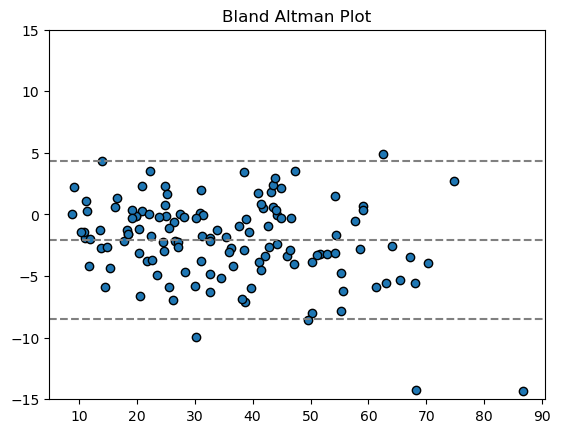

In [42]:
bland_altman_plot(np.array(Preds_1).flatten(), np.array(Gts_1).flatten())

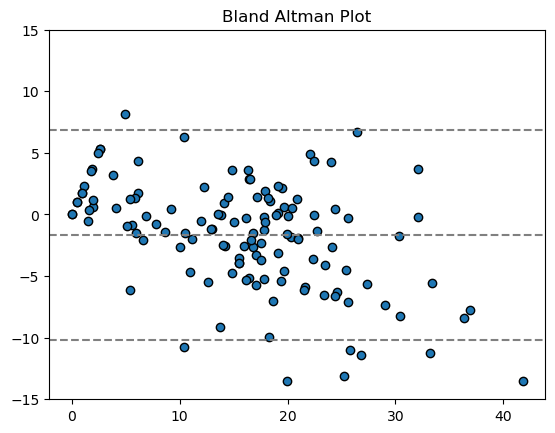

In [43]:
bland_altman_plot(np.array(Preds_2).flatten(), np.array(Gts_2).flatten())

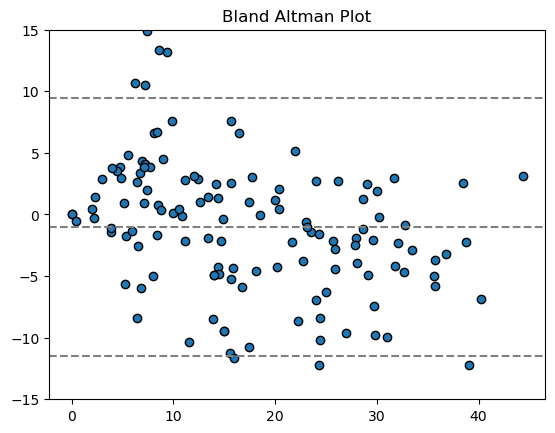

In [44]:
bland_altman_plot(np.array(Preds_3).flatten(), np.array(Gts_3).flatten())